In [1]:
from astropy.io import fits
from astropy import units, constants
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import corner
from voigt_fit_lib import *
import os
import pickle

Load in the files

In [2]:
rootdir = '/Users/thepoetoftwilight/Documents/Astro/Data/PG1522+101/'

First, the FUV files

In [3]:
spec_fits_fuv = fits.open(rootdir + 'FUV/PG1522+101_FUV_wavecal_new.fits')
lsf_fits_fuv = fits.open(rootdir + 'FUV/PG1522_COS_FUV_wavcal2022_lsf_ZQ.fits')

Then, the NUV files

In [4]:
spec_fits_nuv = fits.open(rootdir + 'G185M/PG1522+101_NUV_wavecal_new.fits')
lsf_fits_nuv = fits.open(rootdir + 'G185M/PG1522_COS_NUV_wavcal2022_lsf.fits')

Then, the STIS files

In [5]:
spec_fits_stis = fits.open(rootdir + 'STIS/PG1522+101_E230M_new.fits')
lsf_fits_stis = fits.open(rootdir + 'STIS/PG1522_STIS_NUV_wavcal2022_lsf.fits')

Finally, HIRES files

In [6]:
spec_fits_hires = fits.open(rootdir + 'HIRES/PG1522+101_HIRES.fits')
lsf_fits_hires = fits.open(rootdir + 'HIRES/PG1522_HIRES_wavcal2023_lsf.fits')

Compile a list of the spectra, continuum nodes, and IDs for all detectors

In [7]:
spec_fits_list = [spec_fits_fuv, spec_fits_nuv, spec_fits_stis, spec_fits_hires]
lsf_fits_list = [lsf_fits_fuv, lsf_fits_nuv, lsf_fits_stis, lsf_fits_hires]

Systemic redshift

In [8]:
z_sys = 1.09456549 #1.09456577 #1.094565 #1.09456367

In [9]:
np.round(1.09456577 - (1+1.09456577)*0.04/3e+5, 8)

1.09456549

# HI

## HI 1215 (STIS)

In [10]:
hi_1215_stis = ion_transition('HI', 1215, 'H', z_sys, 'STIS')

In [11]:
hi_1215_stis.grab_ion_transition_info()

In [12]:
hi_1215_stis.grab_ion_transition_spec(spec_fits_list, masks=[[120,300]])

In [13]:
hi_1215_stis.cont_norm_flux(v_abs_range=[-70,90], degree=1)

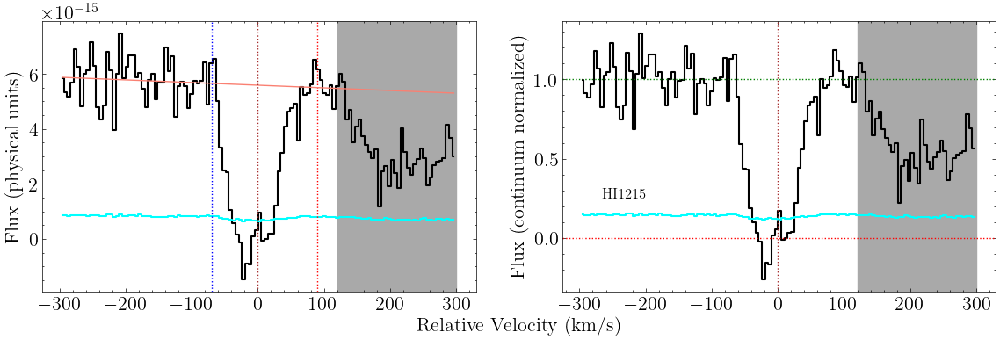

In [14]:
fig, axes = hi_1215_stis.plot_ion_transition_spec_cont()

In [15]:
hi_1215_stis.get_EW_total(-70,90)

Integration window: [-70, 90]
EW, 1sig: 364, 15
EW-3sig: 43.738


In [16]:
hi_1215_stis.grab_ion_transition_lsf(lsf_fits_list)

In [17]:
hi_1215_stis.init_ion_transition(init_values = np.array([[14.5,20,0],[14.0,22,-20]]), 
                             lsf_convolve = True)

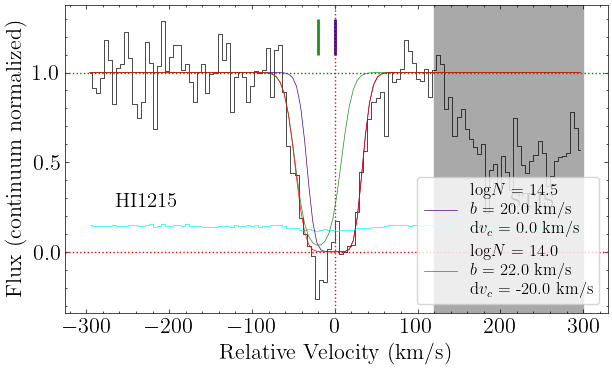

In [18]:
fig, ax = hi_1215_stis.plot_ion_transition_init_fit()

In [19]:
hi_1215_stis.fit_ion_transition()

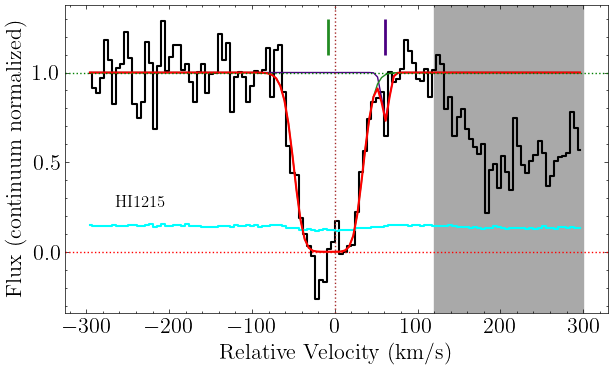

In [20]:
fig, ax = hi_1215_stis.plot_ion_transition_best_fit(legend=False)

## HI 1025 (STIS)

In [21]:
hi_1025_stis = ion_transition('HI', 1025, 'H', z_sys, 'STIS')

In [22]:
hi_1025_stis.grab_ion_transition_info()

In [23]:
hi_1025_stis.grab_ion_transition_spec(spec_fits_list)

In [24]:
hi_1025_stis.cont_norm_flux(v_abs_range=[-70,70], degree=1)

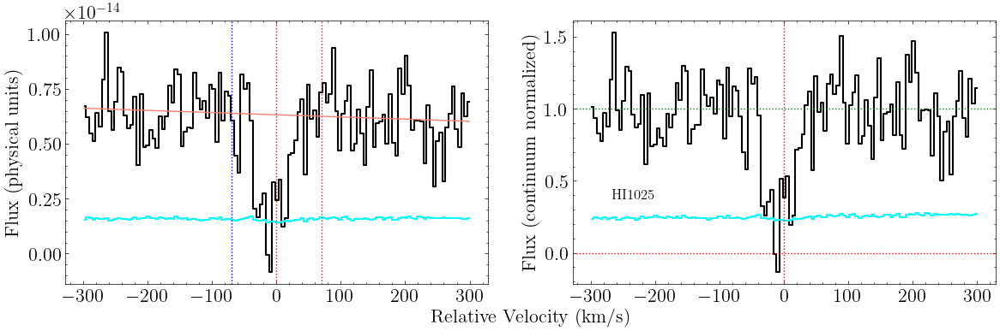

In [25]:
fig, axes = hi_1025_stis.plot_ion_transition_spec_cont()

In [26]:
hi_1025_stis.get_EW_total(-70,70)

Integration window: [-70, 70]
EW, 1sig: 150, 21
EW-3sig: 64.040


In [27]:
hi_1025_stis.grab_ion_transition_lsf(lsf_fits_list)

In [28]:
hi_1025_stis.init_ion_transition(init_values = np.array([[14.5,20,0],[14.0,22,-20]]), 
                             lsf_convolve = True)

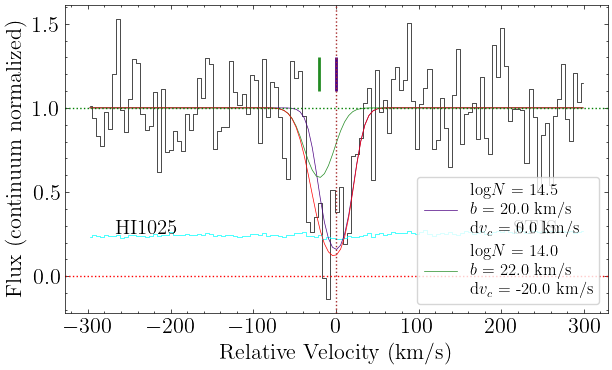

In [29]:
fig, ax = hi_1025_stis.plot_ion_transition_init_fit()

In [30]:
hi_1025_stis.fit_ion_transition()

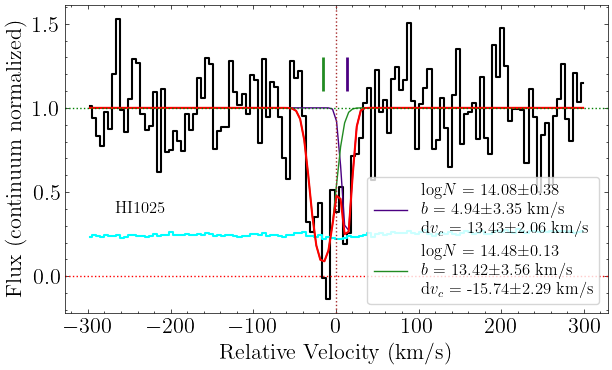

In [31]:
fig, ax = hi_1025_stis.plot_ion_transition_best_fit()

## HI 972 (STIS)

In [32]:
hi_972_stis = ion_transition('HI', 972, 'H', z_sys, 'STIS')

In [33]:
hi_972_stis.grab_ion_transition_info()

In [34]:
hi_972_stis.grab_ion_transition_spec(spec_fits_list)

In [35]:
hi_972_stis.cont_norm_flux(v_abs_range=[-200,100], degree=1)

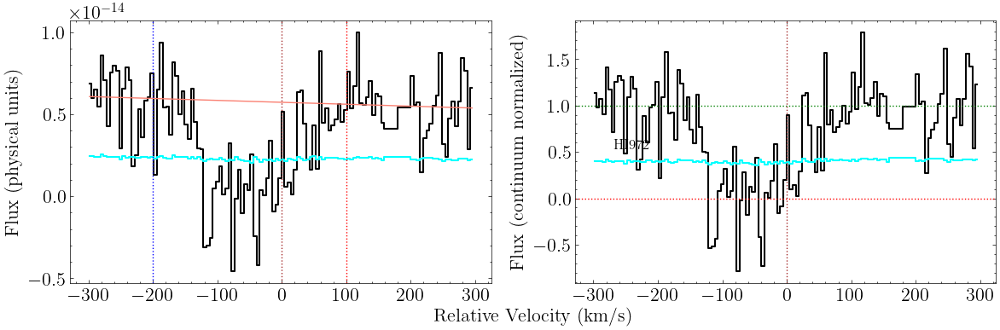

In [36]:
fig, axes = hi_972_stis.plot_ion_transition_spec_cont()

In [37]:
hi_972_stis.grab_ion_transition_lsf(lsf_fits_list)

In [38]:
hi_972_stis.init_ion_transition(init_values = np.array([[14.5,21,0],[14.1,22,-20]]), 
                             lsf_convolve = True)

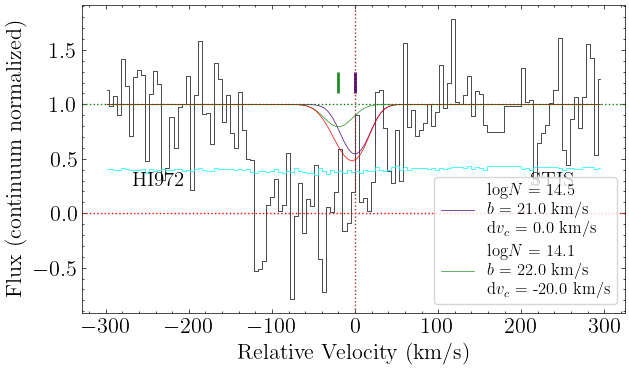

In [39]:
fig, ax = hi_972_stis.plot_ion_transition_init_fit()

In [40]:
hi_972_stis.fit_ion_transition()

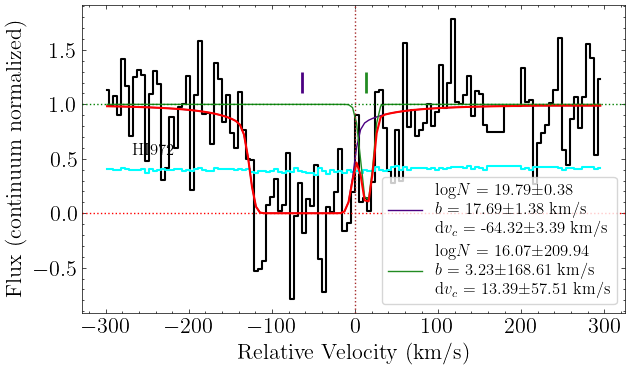

In [41]:
fig, ax = hi_972_stis.plot_ion_transition_best_fit()

## HI 949 (NUV)

In [42]:
hi_949_nuv = ion_transition('HI', 949, 'H', z_sys, 'COS NUV')

In [43]:
hi_949_nuv.grab_ion_transition_info()

In [44]:
hi_949_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-230,-30],[250,300]])

In [45]:
hi_949_nuv.cont_norm_flux(v_abs_range=[-30,30], degree=1)

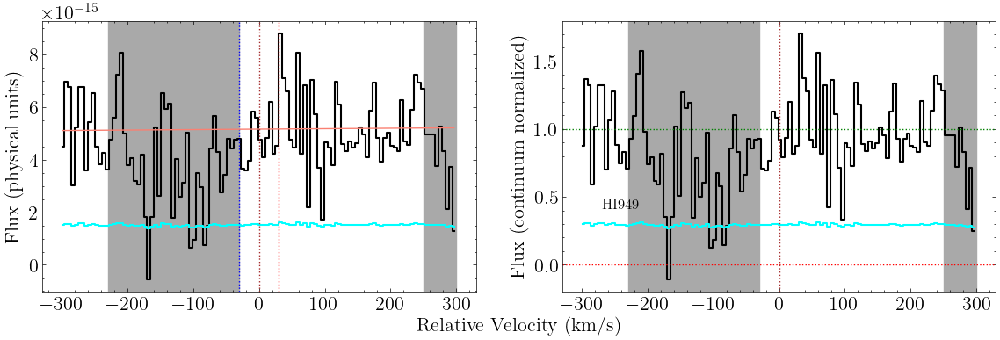

In [46]:
fig, axes = hi_949_nuv.plot_ion_transition_spec_cont()

In [47]:
hi_949_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [48]:
hi_949_nuv.init_ion_transition(init_values = np.array([[14.5,20,0],[14.0,22,-20]]), 
                             lsf_convolve = True)

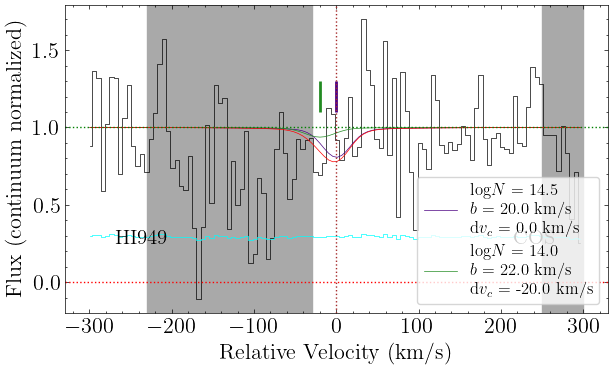

In [49]:
fig, ax = hi_949_nuv.plot_ion_transition_init_fit()

In [50]:
hi_949_nuv.fit_ion_transition()

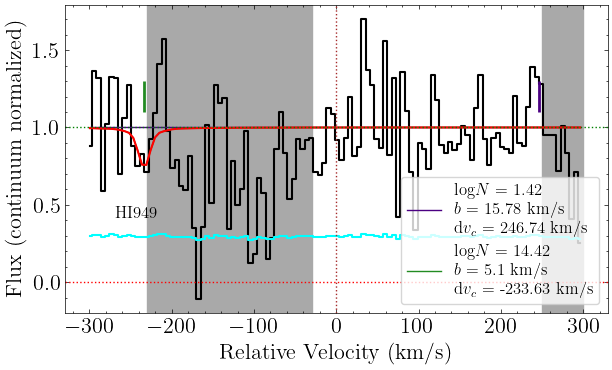

In [51]:
fig, ax = hi_949_nuv.plot_ion_transition_best_fit()

## HI ion

In [52]:
hi = ion(z_sys, 'HI', [hi_1215_stis, hi_1025_stis])

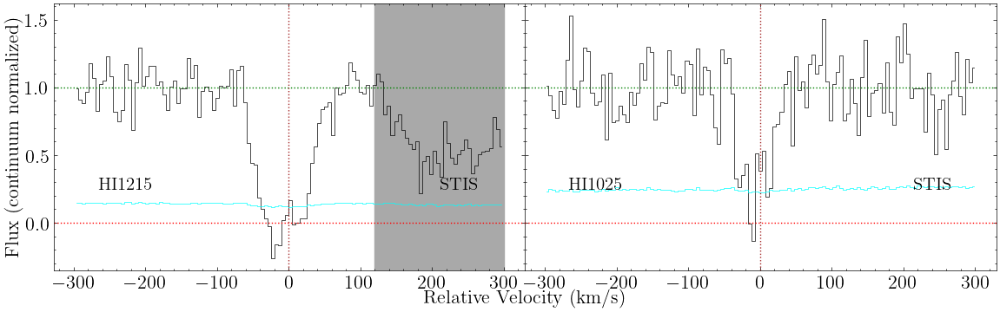

In [53]:
fig, axes = hi.plot_ion()

In [54]:
hi.init_ion([[[14.5,20,0],[14.0,22,-20]],
            [[14.5,20,0],[14.0,22,-20]]])

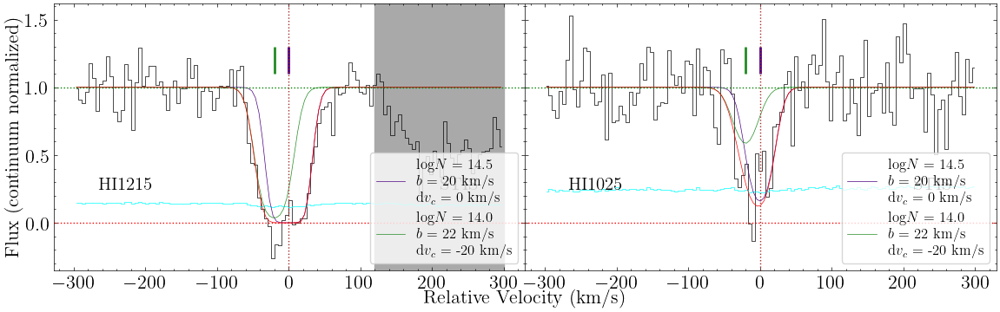

In [55]:
fig, axes = hi.plot_ion_init_fit()

In [56]:
hi.fit_ion(tie_params_list=[['it1c1_logN', 'it2c1_logN'], # Tie logN for c1
                            ['it1c1_b', 'it2c1_b'], # Tie b for c1
                            ['it1c1_dv_c', 'it2c1_dv_c'], # Tie dv_c for c1       
                            ['it1c2_logN', 'it2c2_logN'], # Tie logN for c1
                            ['it1c2_b', 'it2c2_b'], # Tie b for c1
                            ['it1c2_dv_c', 'it2c2_dv_c'], # Tie dv_c for c1  
                           ],
          fix_params_list=['it1c1_dv_c'],
          lower_bounds_dict = {'it1c1_b': 12.8},
          exclude_models=['it1c1_logN < it1c2_logN'])

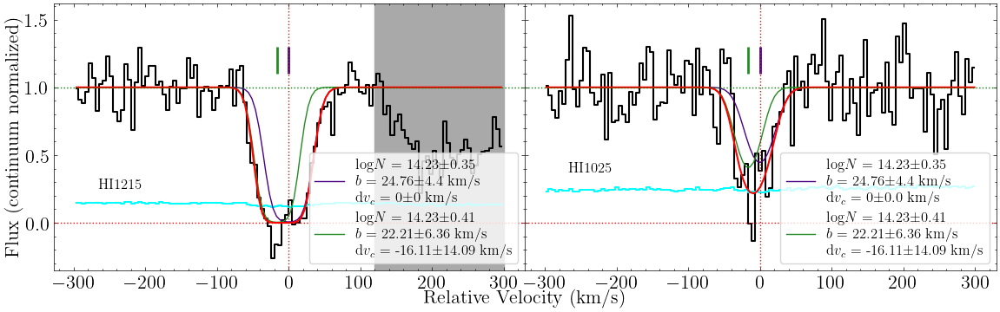

In [57]:
fig, axes = hi.plot_ion_best_fit()

In [58]:
#hi.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-16, n_walkers=100, n_steps=2500)
#hi.fit_ion_emcee(load=True, loaddir=rootdir)

In [59]:
#fig, axes = hi.plot_samples()

In [60]:
#hi.plot_corner()

# CIII

## CIII 977 (STIS)

In [61]:
ciii_977_stis = ion_transition('CIII', 977, 'C', z_sys, 'STIS')

In [62]:
ciii_977_stis.grab_ion_transition_info()

In [63]:
ciii_977_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-100,-40],[20,100]], delta_wav=0)

In [64]:
ciii_977_stis.cont_norm_flux(v_abs_range=[-100,100], degree=1)

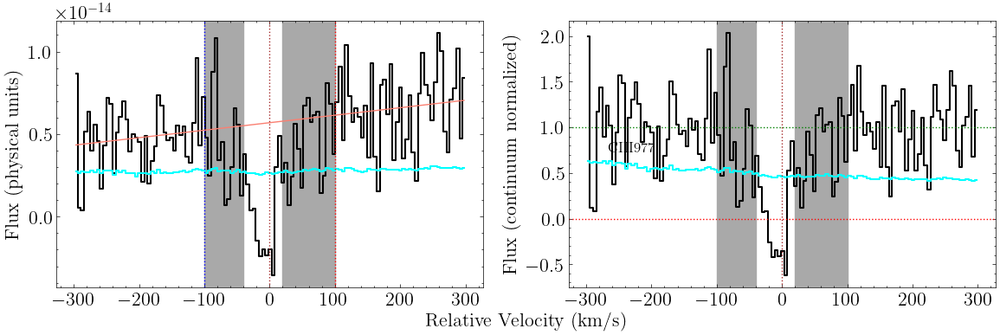

In [65]:
fig, ax = ciii_977_stis.plot_ion_transition_spec_cont()

In [66]:
ciii_977_stis.get_EW_total(-50,50)

Integration window: [-50, 50]
EW, 1sig: 246, 33
EW-3sig: 99.944


In [67]:
ciii_977_stis.grab_ion_transition_lsf(lsf_fits_list)

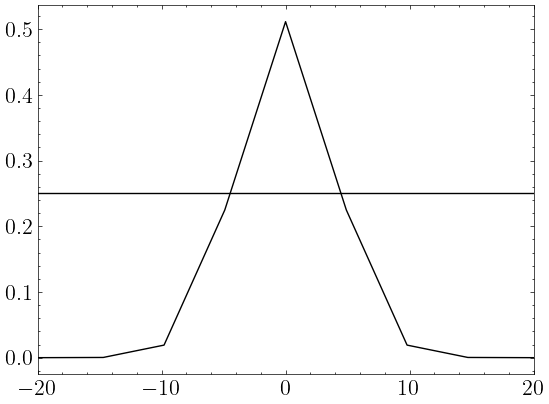

In [68]:
plt.plot(ciii_977_stis.v_lsf, ciii_977_stis.lsf)
plt.xlim(-20,20)
plt.axhline(0.25)

In [69]:
ciii_977_stis.init_ion_transition(init_values = np.array([[14.4, 17.7, 0]]), 
                             lsf_convolve = True)

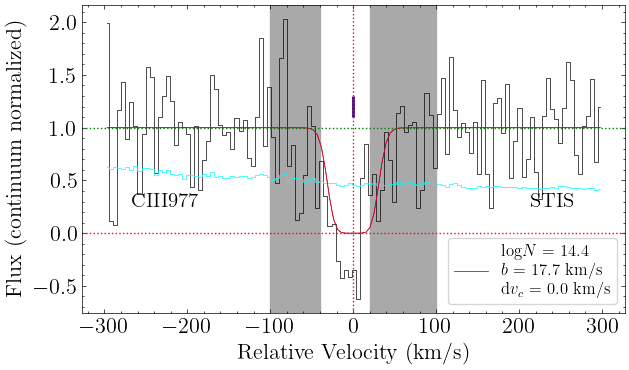

In [70]:
fig, ax = ciii_977_stis.plot_ion_transition_init_fit()

In [71]:
ciii_977_stis.fit_ion_transition()

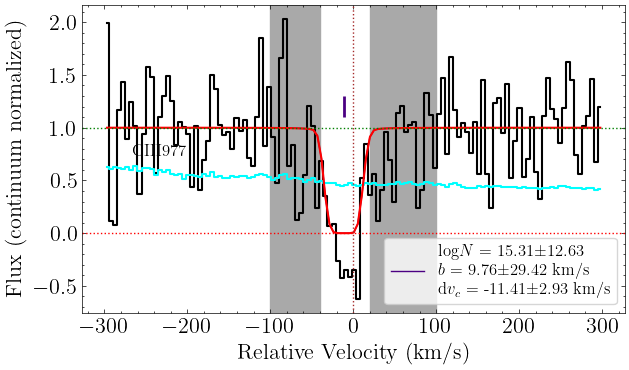

In [72]:
fig, ax = ciii_977_stis.plot_ion_transition_best_fit()

## CIII 977 (NUV)

In [73]:
ciii_977_nuv = ion_transition('CIII', 977, 'C', z_sys, 'COS NUV')

In [74]:
ciii_977_nuv.grab_ion_transition_info(delta_v=-12.5)

In [75]:
ciii_977_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-180],[-100,-40],[60,210],[280,300]])

In [76]:
ciii_977_nuv.cont_norm_flux(v_abs_range=[-100,100], degree=1)

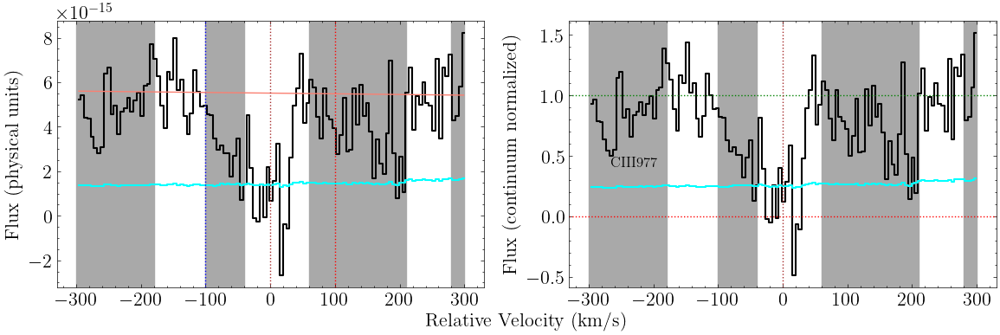

In [77]:
fig, ax = ciii_977_nuv.plot_ion_transition_spec_cont()

In [78]:
ciii_977_nuv.get_EW_total(-50,50)

Integration window: [-50, 50]
EW, 1sig: 224, 19
EW-3sig: 55.620


In [79]:
ciii_977_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [80]:
ciii_977_nuv.init_ion_transition(init_values = np.array([[14.4, 17.7, 0]]), 
                             lsf_convolve = True)

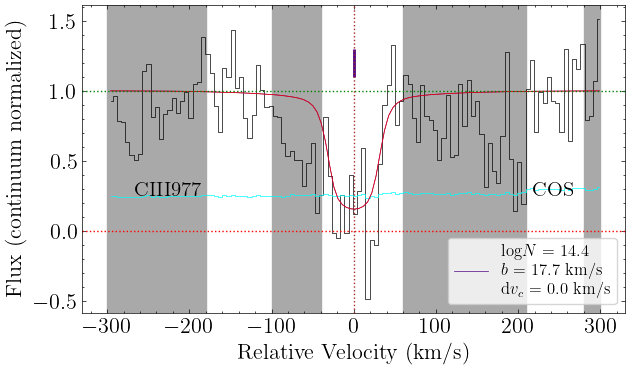

In [81]:
fig, ax = ciii_977_nuv.plot_ion_transition_init_fit()

In [82]:
ciii_977_nuv.fit_ion_transition()

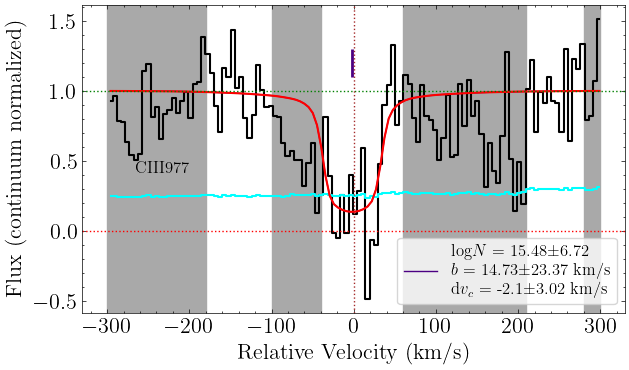

In [83]:
fig, ax = ciii_977_nuv.plot_ion_transition_best_fit()

## CIII ion

In [84]:
ciii = ion(z_sys, 'CIII', [ciii_977_nuv])

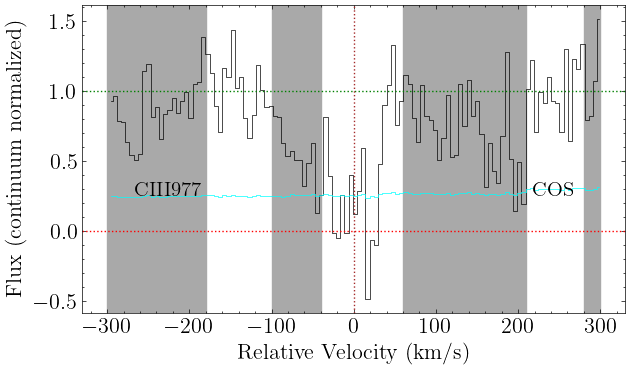

In [85]:
fig, axes = ciii.plot_ion()

In [86]:
ciii.init_ion([[[14.4, 17.7, 0]]])

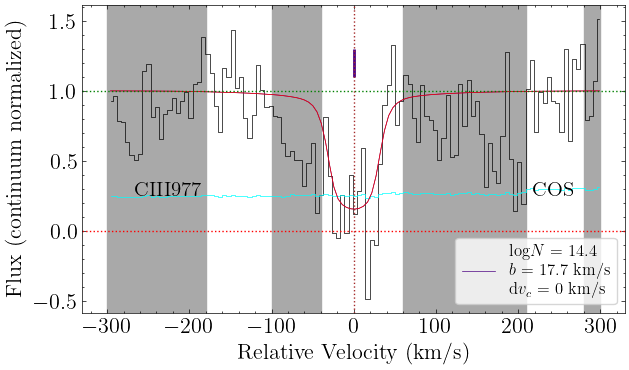

In [87]:
fig, axes = ciii.plot_ion_init_fit()

In [88]:
ciii.fit_ion(fix_params_list=['it1c1_b','it1c1_dv_c'],
            upper_bounds_dict = {'it1c1_logN':14.4})

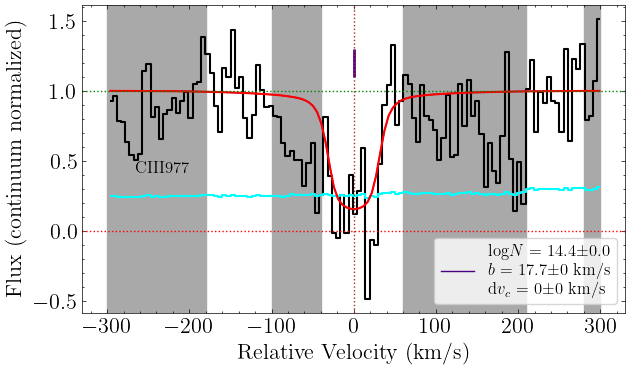

In [89]:
fig, axes = ciii.plot_ion_best_fit()

In [90]:
#ciii.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-16, n_walkers=200, n_steps=5000)
ciii.fit_ion_emcee(load=True, loaddir=rootdir)

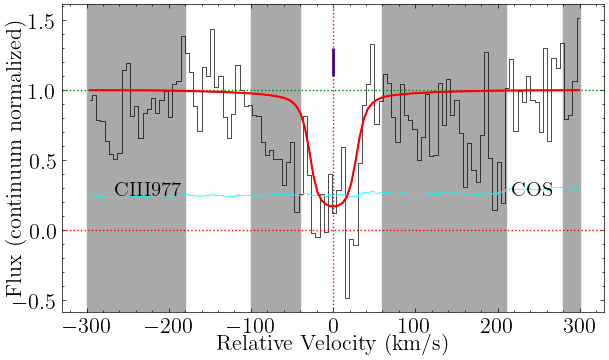

In [91]:
fig, axes = ciii.plot_samples()

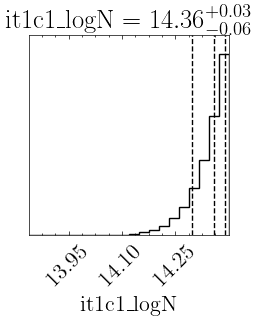

In [92]:
ciii.plot_corner()

In [93]:
np.percentile(ciii.result_emcee.flatchain['it1c1_logN'], 100*(1-cdf_3sig))

14.077800332400638

In [94]:
#np.percentile(ciii.result_emcee.flatchain['it1c1_b'], 100*cdf_3sig)

# CIV

## CIV 1548 (HIRES)

In [95]:
civ_1548_hires = ion_transition('CIV', 1548, 'C', z_sys, 'HIRES')

In [96]:
civ_1548_hires.grab_ion_transition_info()

In [97]:
civ_1548_hires.grab_ion_transition_spec(spec_fits_list)

In [98]:
civ_1548_hires.cont_norm_flux(v_abs_range=[-50,50], degree=1)

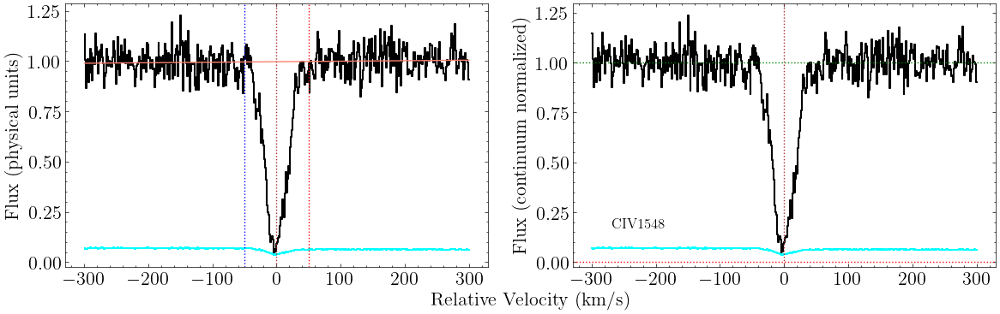

In [99]:
fig, ax = civ_1548_hires.plot_ion_transition_spec_cont()

In [100]:
civ_1548_hires.get_EW_total(-50,50)

Integration window: [-50, 50]
EW, 1sig: 199, 3
EW-3sig: 10.010


In [101]:
civ_1548_hires.grab_ion_transition_lsf(lsf_fits_list)

(-40.0, 40.0)

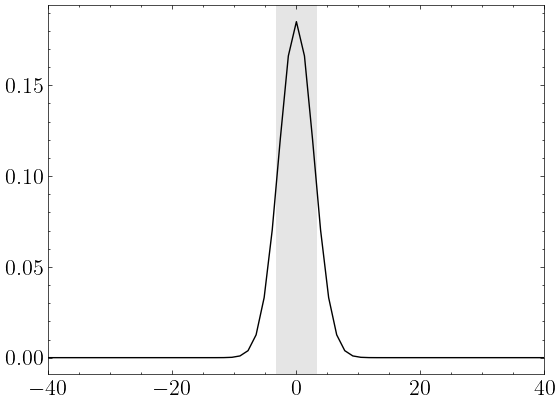

In [102]:
plt.plot(civ_1548_hires.v_lsf, civ_1548_hires.lsf)
plt.axvspan(-3.3,3.3, alpha=.1)
plt.xlim(-40,40)

In [103]:
civ_1548_hires.init_ion_transition(init_values = np.array([[12.5,3,0]]), 
                             lsf_convolve = True)

In [104]:
x = civ_1548_hires.init_total_flux

(-0.1, 1.1)

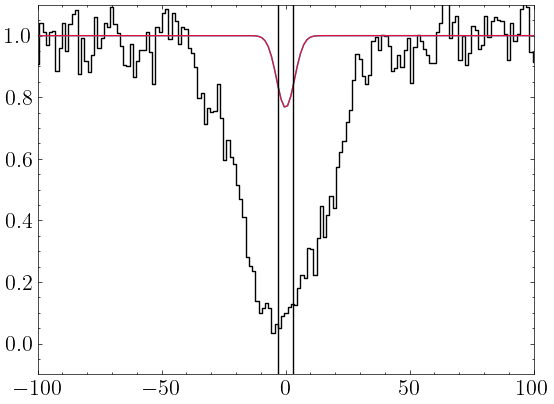

In [105]:
plt.step(civ_1548_hires.v, civ_1548_hires.flux_norm)

plt.plot(civ_1548_hires.v, civ_1548_hires.init_total_flux)
plt.plot(civ_1548_hires.v, x)

plt.axvline(-3)
plt.axvline(3)
plt.xlim(-100,100)

plt.ylim(-0.1,1.1)

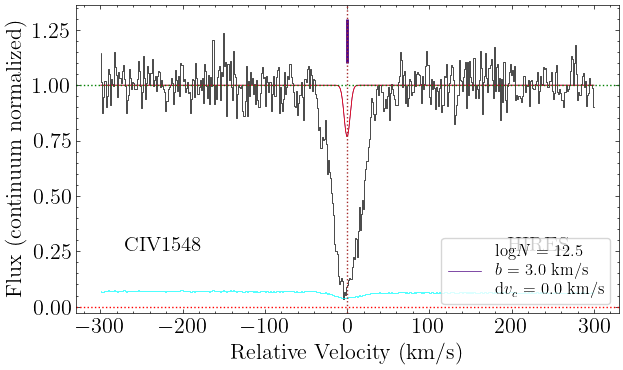

In [106]:
fig, ax = civ_1548_hires.plot_ion_transition_init_fit()

In [107]:
civ_1548_hires.fit_ion_transition()

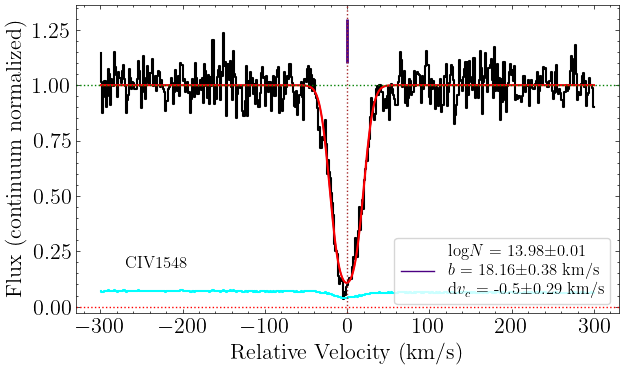

In [108]:
fig, ax = civ_1548_hires.plot_ion_transition_best_fit()

## CIV 1550 (HIRES)

In [109]:
civ_1550_hires = ion_transition('CIV', 1550, 'C', z_sys, 'HIRES')

In [110]:
civ_1550_hires.grab_ion_transition_info()

In [111]:
civ_1550_hires.grab_ion_transition_spec(spec_fits_list, v_range=[-300,300], masks=[[-300,-280]])

In [112]:
civ_1550_hires.cont_norm_flux(v_abs_range=[-40,55], degree=1)

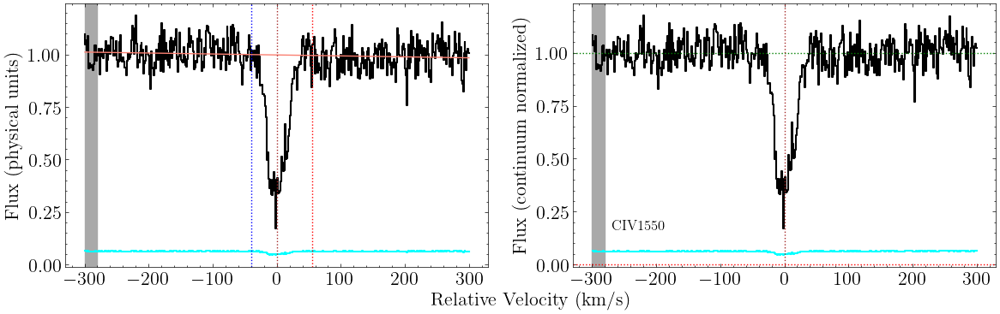

In [113]:
fig, ax = civ_1550_hires.plot_ion_transition_spec_cont()

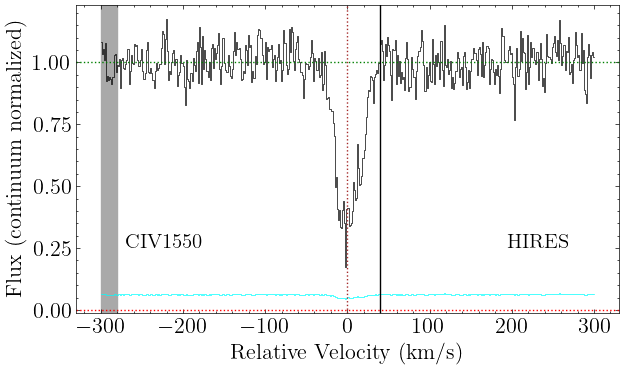

In [114]:
fig, ax = civ_1550_hires.plot_ion_transition_spec()
ax.axvline(40)

In [115]:
civ_1550_hires.get_EW_total(-40,40)

Integration window: [-40, 40]
EW, 1sig: 126, 3
EW-3sig: 8.884


In [116]:
civ_1550_hires.grab_ion_transition_lsf(lsf_fits_list)

In [117]:
civ_1550_hires.init_ion_transition(init_values = np.array([[13.90,17.7,0],[13.1,23,0]]), 
                             lsf_convolve = True)

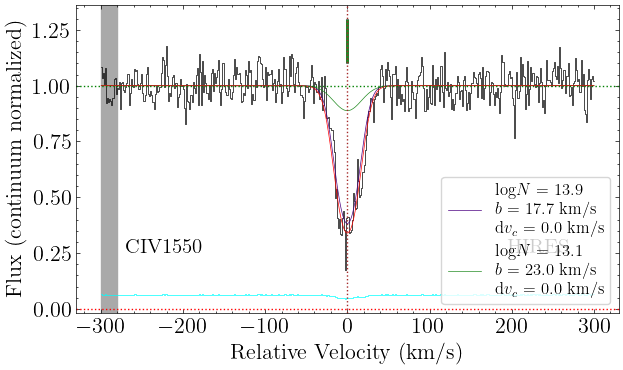

In [118]:
fig, ax = civ_1550_hires.plot_ion_transition_init_fit()

In [119]:
civ_1550_hires.fit_ion_transition()

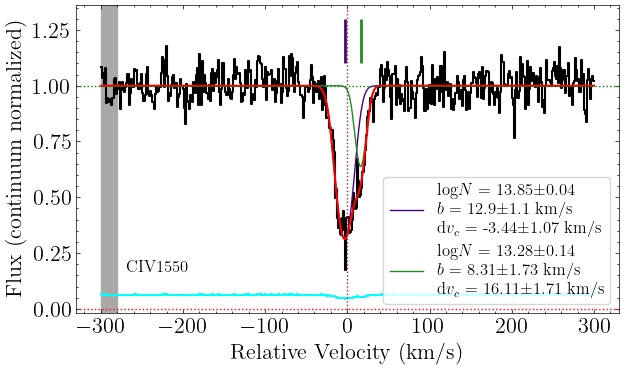

In [120]:
fig, ax = civ_1550_hires.plot_ion_transition_best_fit()

## CIV ion

In [121]:
civ = ion(z_sys, 'CIV', [civ_1548_hires, civ_1550_hires])

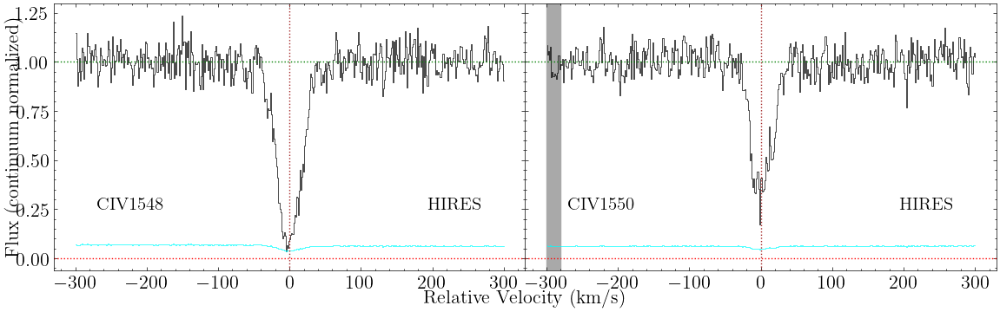

In [122]:
fig, axes = civ.plot_ion()

In [123]:
civ.init_ion([[[13.90,17.7,0]],
              [[13.90,17.7,0]]])

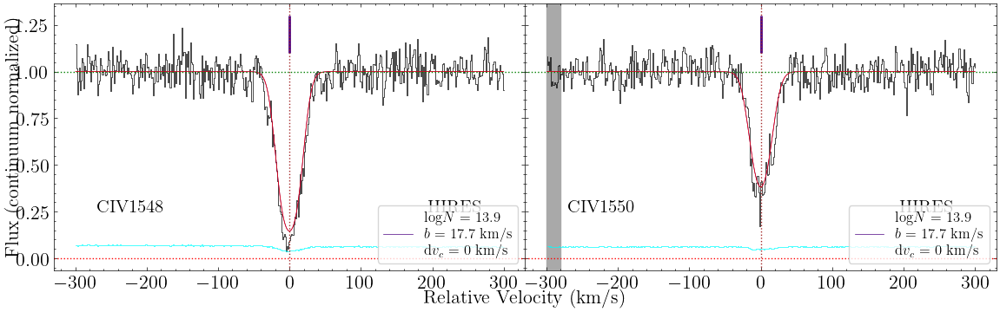

In [124]:
fig, axes = civ.plot_ion_init_fit()

In [125]:
civ.fit_ion(tie_params_list = [['it1c1_logN', 'it2c1_logN'],
                               ['it1c1_b', 'it2c1_b'],
                               ['it1c1_dv_c', 'it2c1_dv_c'],
                              ], fix_params_list=['it1c1_dv_c'])

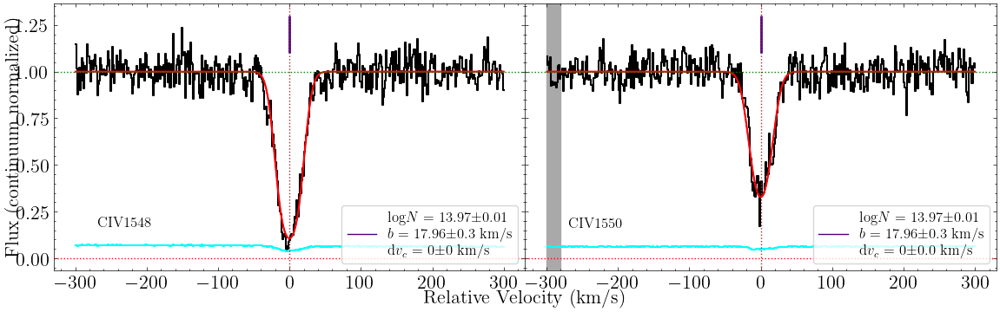

In [126]:
fig, axes = civ.plot_ion_best_fit()

In [127]:
#civ.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-7, n_walkers=100, n_steps=2500)
civ.fit_ion_emcee(load=True, loaddir=rootdir)

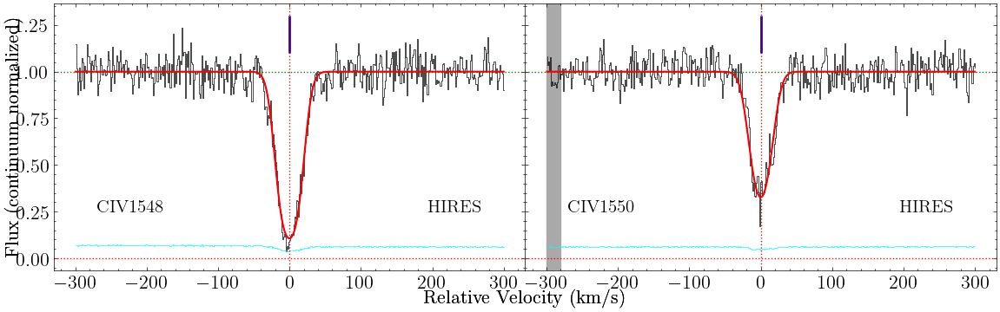

In [128]:
fig, axes = civ.plot_samples()

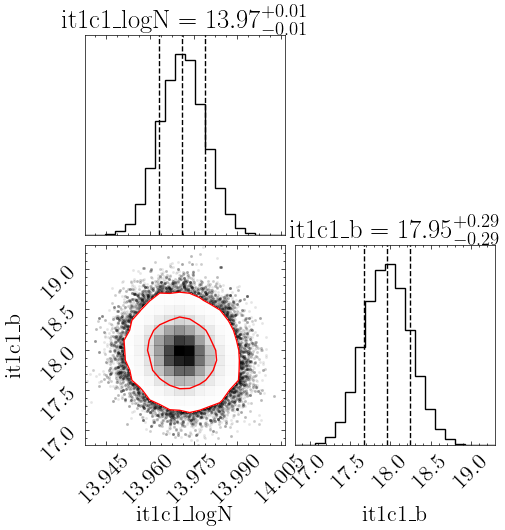

In [129]:
civ.plot_corner()

# NIV

## NIV 765
Get NIV 765 from COS FUV

In [130]:
niv_765_fuv = ion_transition('NIV', 765, 'N', z_sys, 'COS FUV')

In [131]:
niv_765_fuv.grab_ion_transition_info(delta_v=-5.3)

In [132]:
niv_765_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-195],[195,300]])

In [133]:
niv_765_fuv.cont_norm_flux(v_abs_range=[-60,60], degree=1)

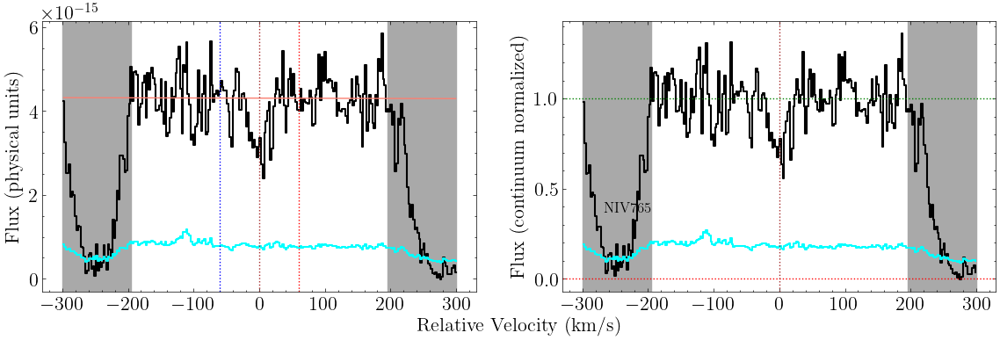

In [134]:
fig, ax = niv_765_fuv.plot_ion_transition_spec_cont()

In [135]:
niv_765_fuv.get_EW_total(-60,60)

Integration window: [-60, 60]
EW, 1sig: 21, 8
EW-3sig: 22.702


In [136]:
niv_765_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [137]:
niv_765_fuv.init_ion_transition(init_values = np.array([[13.1, 13, 0]]), 
                             lsf_convolve = True)

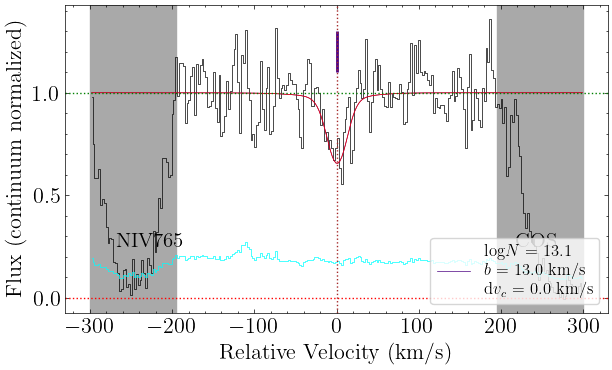

In [138]:
fig, ax = niv_765_fuv.plot_ion_transition_init_fit()

In [139]:
niv_765_fuv.fit_ion_transition()

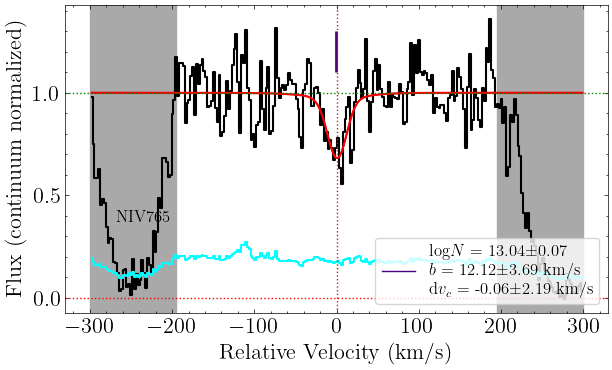

In [140]:
fig, ax = niv_765_fuv.plot_ion_transition_best_fit()

## NIV ion
Now compile the NIV ion

In [141]:
niv = ion(z_sys, 'NIV', [niv_765_fuv])

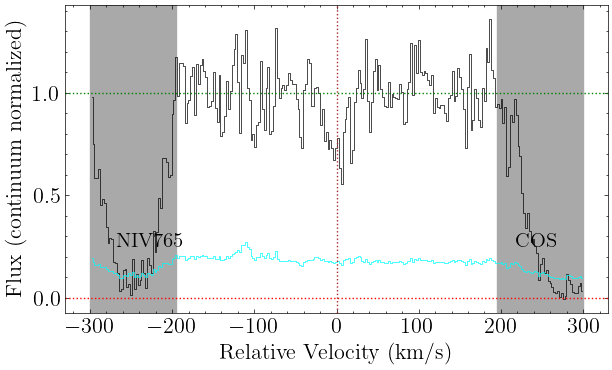

In [142]:
fig, axes = niv.plot_ion()

In [143]:
niv.init_ion([[[13.1, 18.3, 0]]])
#niv.init_ion(np.array([[13.03, 5, 0]]))

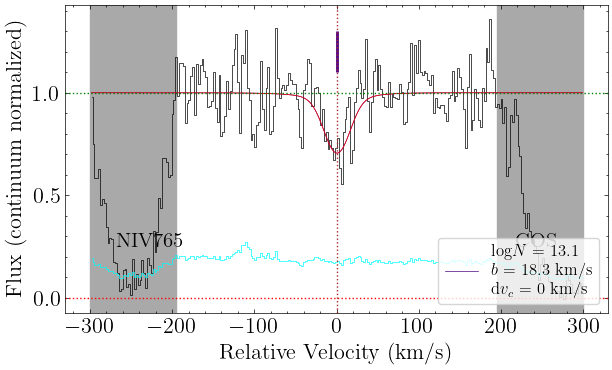

In [144]:
fig, axes = niv.plot_ion_init_fit()

In [145]:
niv.fit_ion(fix_params_list = ['it1c1_dv_c', 'it1c1_b'])

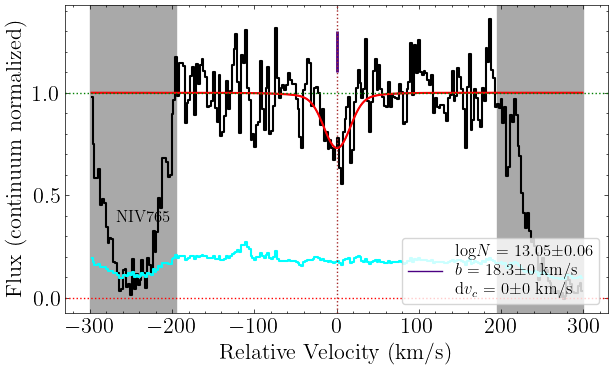

In [146]:
fig, axes = niv.plot_ion_best_fit()

In [147]:
#niv.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-8, n_walkers=100, n_steps=2500)
#niv.fit_ion_emcee(load=True, loaddir=rootdir)

In [148]:
#fig, axes = niv.plot_samples()

In [149]:
#niv.plot_corner()

# OIII

## OIII 702
Get OIII 702 from COS FUV

In [358]:
oiii_702_fuv = ion_transition('OIII', 702, 'O', z_sys, 'COS FUV')

In [359]:
oiii_702_fuv.grab_ion_transition_info(delta_v=2.1)

In [360]:
oiii_702_fuv.grab_ion_transition_spec(spec_fits_list)

In [361]:
oiii_702_fuv.cont_norm_flux(v_abs_range=[-55,55], degree=1)

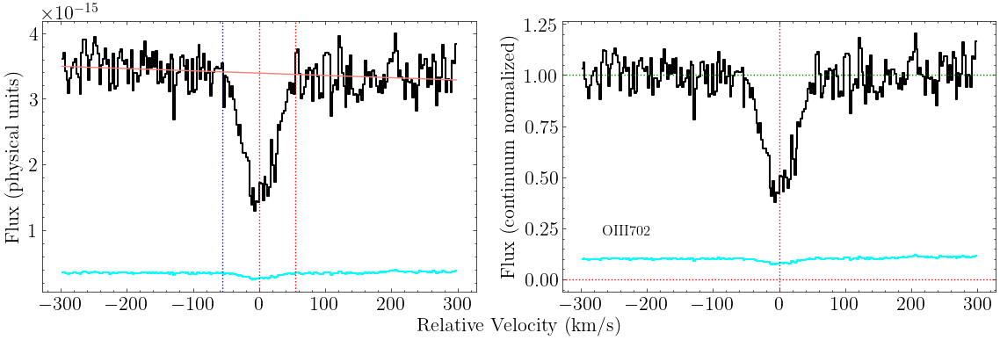

In [362]:
fig, ax = oiii_702_fuv.plot_ion_transition_spec_cont()

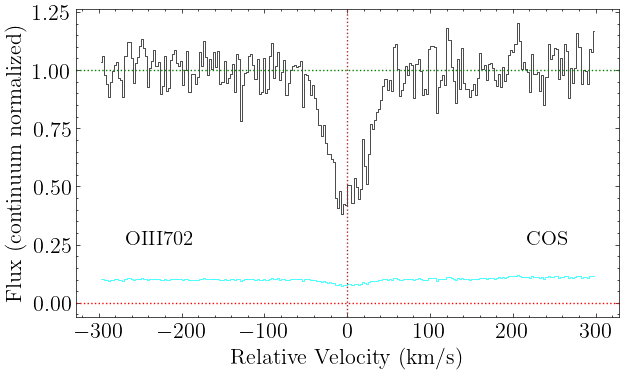

In [363]:
fig, ax = oiii_702_fuv.plot_ion_transition_spec()

In [364]:
oiii_702_fuv.get_EW_total(-55,55)

Integration window: [-55, 55]
EW, 1sig: 77, 3
EW-3sig: 10.265


In [365]:
oiii_702_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [366]:
oiii_702_fuv.init_ion_transition(init_values = np.array([[14.22,25,0]]), 
                             lsf_convolve = True)

#oiii_702_fuv.init_multi_voigt(init_values = np.array([[14.2, 12, 0]]), 
#                             lsf_convolve = True)

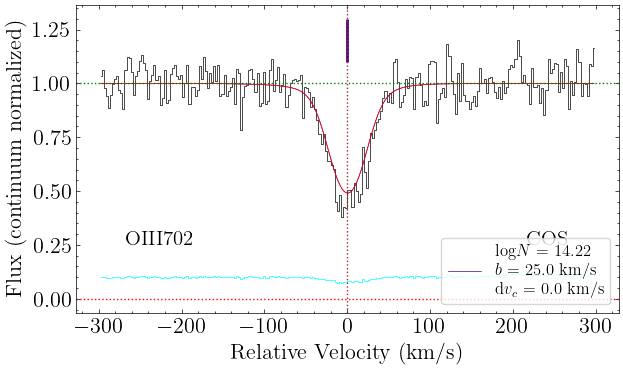

In [367]:
fig, ax = oiii_702_fuv.plot_ion_transition_init_fit()

In [160]:
oiii_702_fuv.fit_ion_transition()

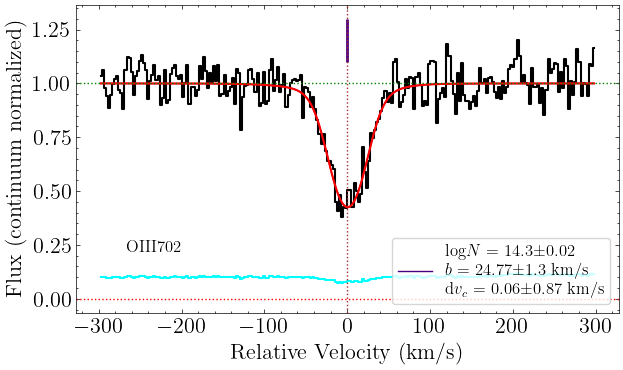

In [161]:
fig, ax = oiii_702_fuv.plot_ion_transition_best_fit()

## OIII 832
Get OIII 832 from COS FUV

In [162]:
oiii_832_fuv = ion_transition('OIII', 832, 'O', z_sys, 'COS FUV')

In [163]:
oiii_832_fuv.grab_ion_transition_info(delta_v=-4.3)

In [164]:
oiii_832_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-200],[220,300]])

In [165]:
oiii_832_fuv.cont_norm_flux(v_abs_range=[-65,65], degree=1)

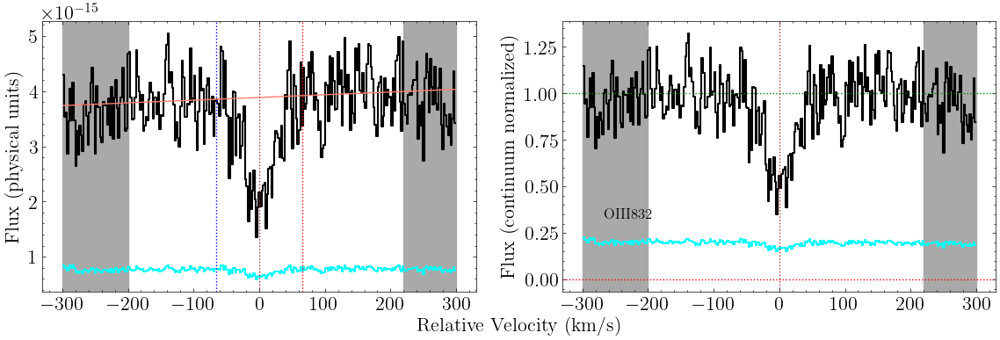

In [166]:
fig, ax = oiii_832_fuv.plot_ion_transition_spec_cont()

In [167]:
oiii_832_fuv.get_EW_total(-65,65)

Integration window: [-65, 65]
EW, 1sig: 75, 9
EW-3sig: 25.566


In [168]:
oiii_832_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [169]:
oiii_832_fuv.init_ion_transition(init_values = np.array([[14.2,18.3,0]]),
                             lsf_convolve = True)

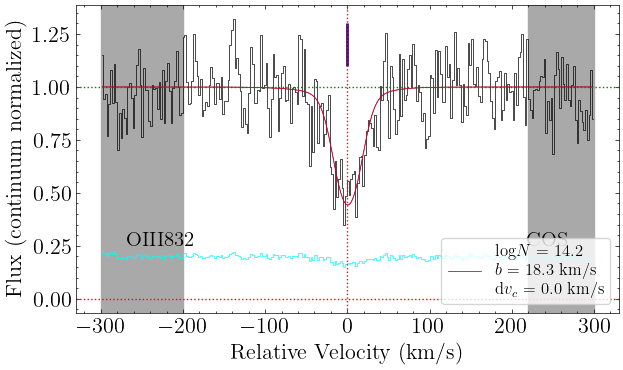

In [170]:
fig, ax = oiii_832_fuv.plot_ion_transition_init_fit()

In [171]:
oiii_832_fuv.fit_ion_transition(fix_params_list=['it1c1_dv_c'])

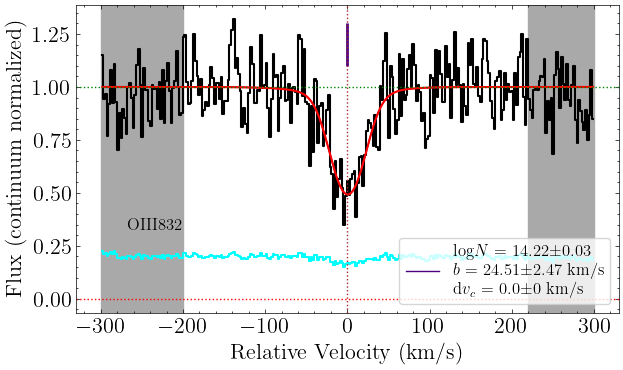

In [172]:
fig, ax = oiii_832_fuv.plot_ion_transition_best_fit()

## OIII ion

In [173]:
oiii = ion(z_sys, 'OIII', [oiii_832_fuv])

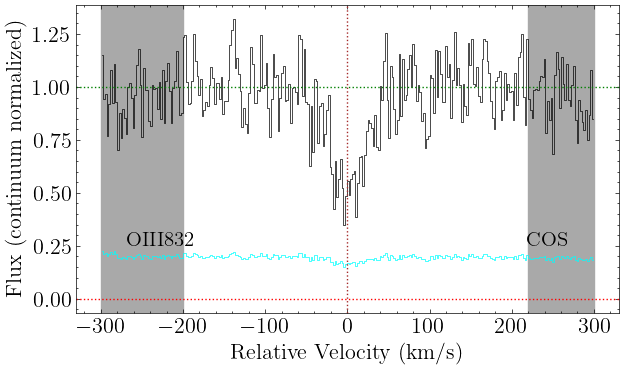

In [174]:
fig, axes = oiii.plot_ion()

In [175]:
oiii.init_ion([[[14.2,18.3, 0]]])

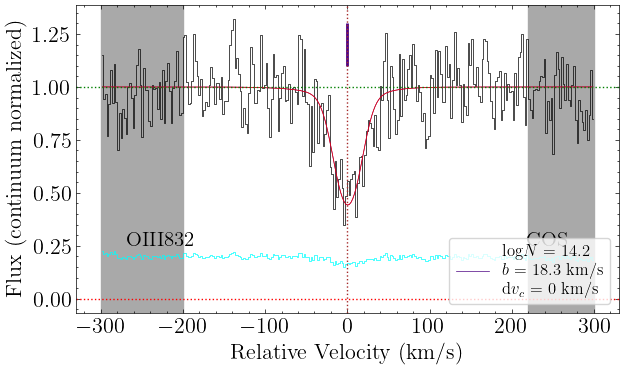

In [176]:
fig, axes = oiii.plot_ion_init_fit()

In [177]:
oiii.fit_ion(fix_params_list=['it1c1_dv_c'])

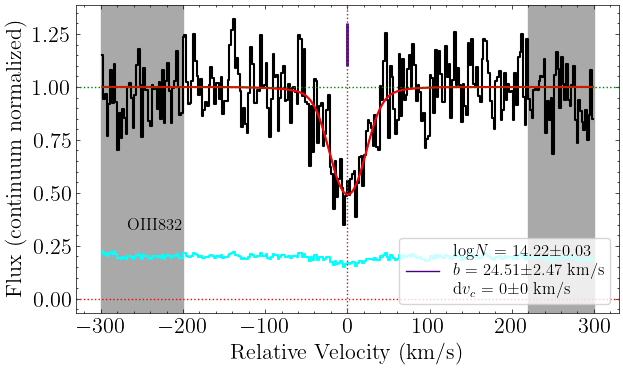

In [178]:
fig, axes = oiii.plot_ion_best_fit()

In [179]:
#oiii.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-15, n_walkers=100, n_steps=2500)
oiii.fit_ion_emcee(load=True, loaddir=rootdir)

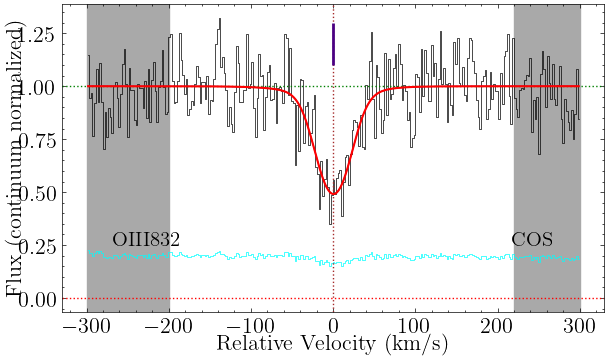

In [180]:
fig, axes = oiii.plot_samples()

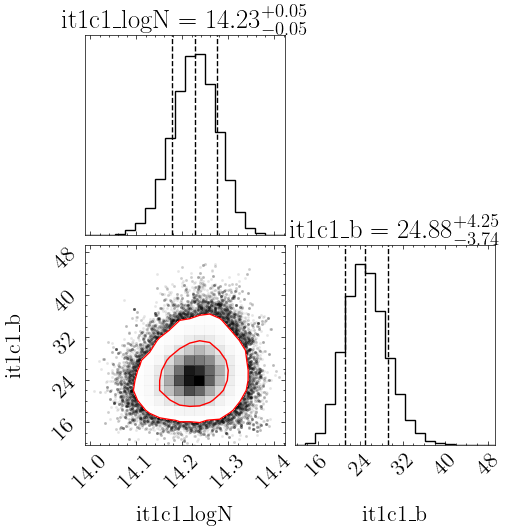

In [181]:
oiii.plot_corner()

# OIV

## OIV 553

Begin with OIV 553 in COS FUV

In [182]:
oiv_553_fuv = ion_transition('OIV', 553, 'O', z_sys, 'COS FUV')

In [183]:
oiv_553_fuv.grab_ion_transition_info()

In [184]:
oiv_553_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-150]])

In [185]:
oiv_553_fuv.cont_norm_flux(v_abs_range=[-60,60], degree=1)

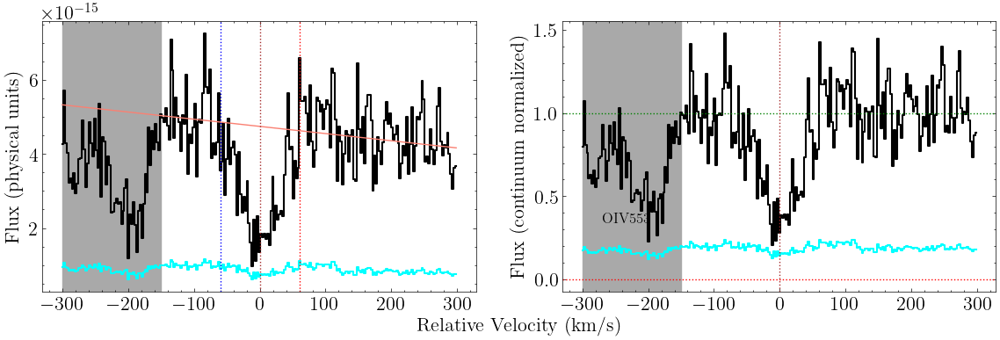

In [186]:
fig, ax = oiv_553_fuv.plot_ion_transition_spec_cont()

In [187]:
oiv_553_fuv.get_EW_total(-60,60)

Integration window: [-60, 60]
EW, 1sig: 83, 6
EW-3sig: 17.165


In [188]:
oiv_553_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [189]:
oiv_553_fuv.init_ion_transition(init_values = np.array([[14.67,23,0]]), 
                             lsf_convolve = True)

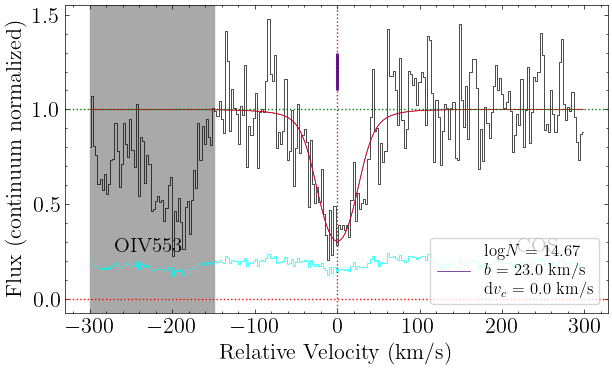

In [190]:
fig, ax = oiv_553_fuv.plot_ion_transition_init_fit()

In [191]:
oiv_553_fuv.fit_ion_transition()

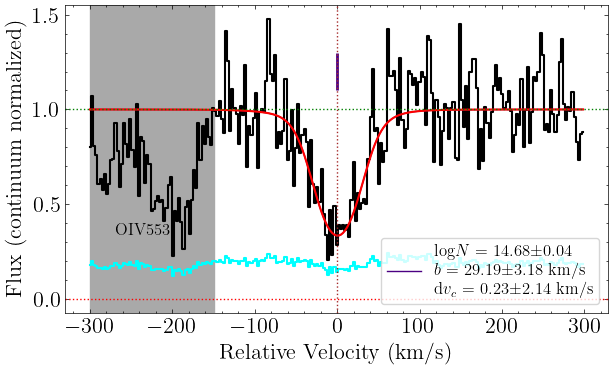

In [192]:
fig, ax = oiv_553_fuv.plot_ion_transition_best_fit()

## OIV 554

Next, do OIV 554 in COS FUV

In [193]:
oiv_554_fuv = ion_transition('OIV', 554, 'O', z_sys, 'COS FUV')

In [194]:
oiv_554_fuv.grab_ion_transition_info()

In [195]:
oiv_554_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[180,290],[-140,-40]])

In [196]:
oiv_554_fuv.cont_norm_flux(v_abs_range=[-40,55], degree=1)

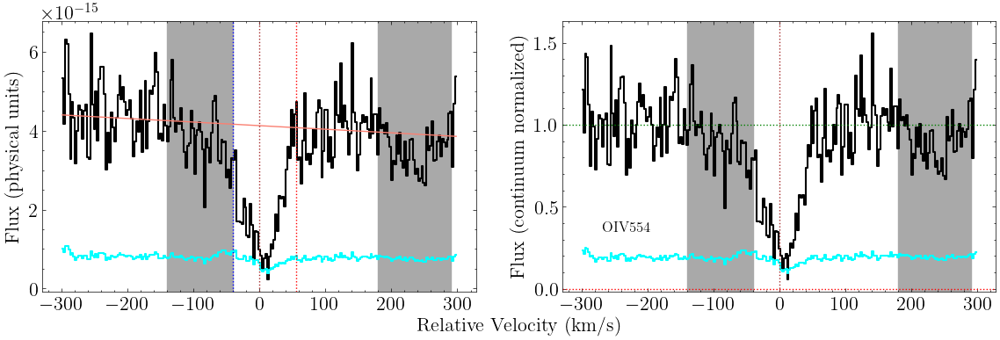

In [197]:
fig, ax = oiv_554_fuv.plot_ion_transition_spec_cont()

In [198]:
oiv_554_fuv.get_EW_total(-55,55)

Integration window: [-55, 55]
EW, 1sig: 101, 5
EW-3sig: 16.073


In [199]:
oiv_554_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [200]:
oiv_554_fuv.init_ion_transition(init_values = [[14.67,23,0]], 
                             lsf_convolve = True)

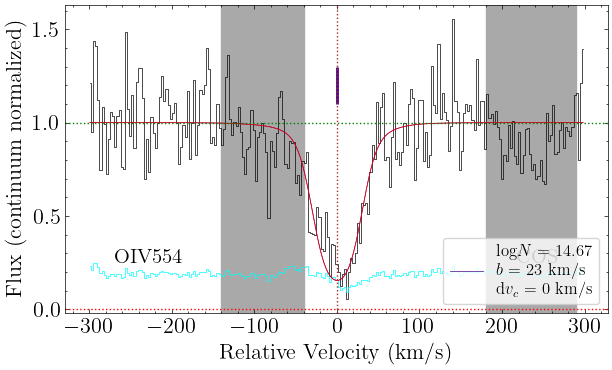

In [201]:
fig, ax = oiv_554_fuv.plot_ion_transition_init_fit()

In [202]:
oiv_554_fuv.fit_ion_transition()

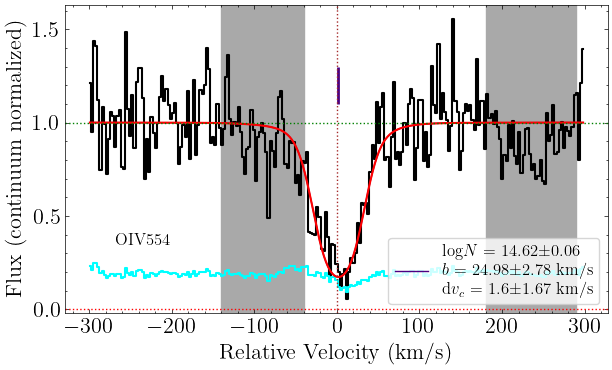

In [203]:
fig, ax = oiv_554_fuv.plot_ion_transition_best_fit()

## OIV 608

Next, OIV 608

In [204]:
oiv_608_fuv = ion_transition('OIV', 608, 'O', z_sys, 'COS FUV')

In [205]:
oiv_608_fuv.grab_ion_transition_info(delta_v=-4.3)

In [206]:
oiv_608_fuv.grab_ion_transition_spec(spec_fits_list)

In [207]:
oiv_608_fuv.cont_norm_flux(v_abs_range=[-50,50], degree=1)

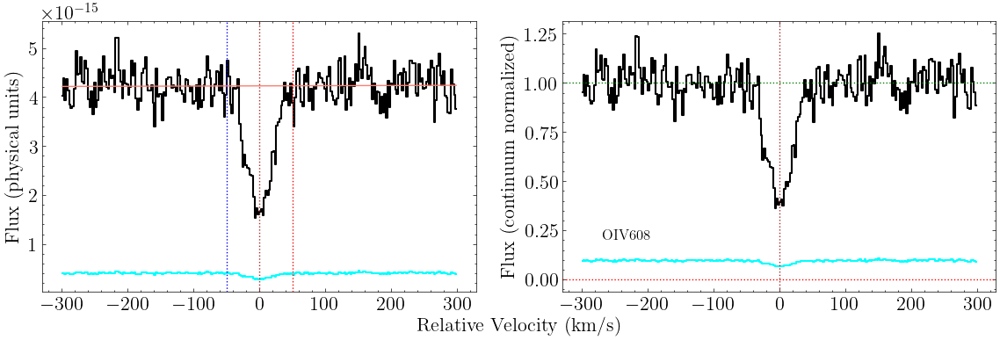

In [208]:
fig, ax = oiv_608_fuv.plot_ion_transition_spec_cont()

In [209]:
oiv_608_fuv.get_EW_total(-50,50)

Integration window: [-50, 50]
EW, 1sig: 57, 3
EW-3sig: 7.777


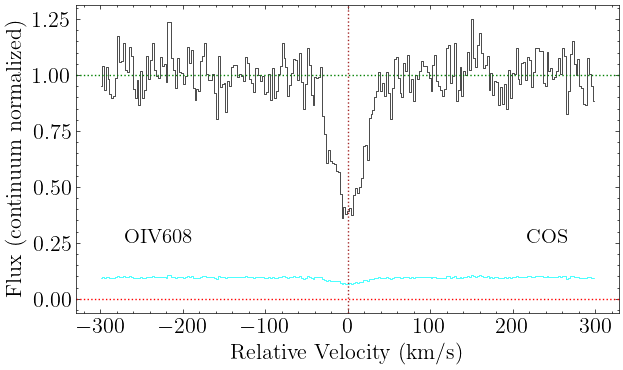

In [210]:
fig, ax = oiv_608_fuv.plot_ion_transition_spec()

In [211]:
oiv_608_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [212]:
oiv_608_fuv.init_ion_transition(init_values = [[14.67,23,0]],
                             lsf_convolve = True)

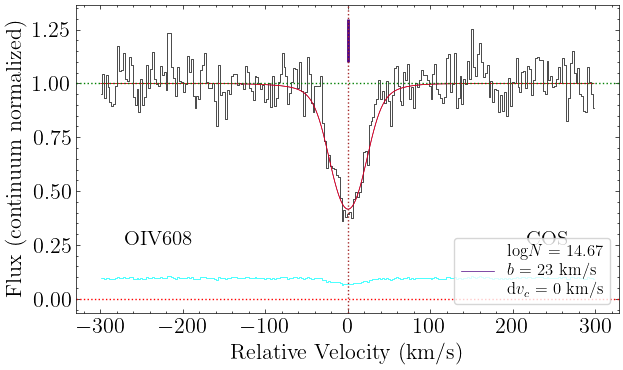

In [213]:
fig, ax = oiv_608_fuv.plot_ion_transition_init_fit()

In [214]:
oiv_608_fuv.fit_ion_transition()

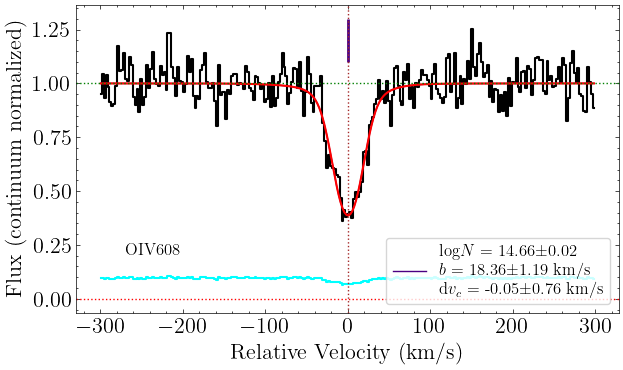

In [215]:
fig, ax = oiv_608_fuv.plot_ion_transition_best_fit()

## OIV 787

Finally, OIV 787

In [216]:
oiv_787_fuv = ion_transition('OIV', 787, 'O', z_sys, 'COS FUV')

In [217]:
oiv_787_fuv.grab_ion_transition_info()

In [218]:
oiv_787_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[40,100]])

In [219]:
oiv_787_fuv.cont_norm_flux(v_abs_range=[-55,80], degree=1)

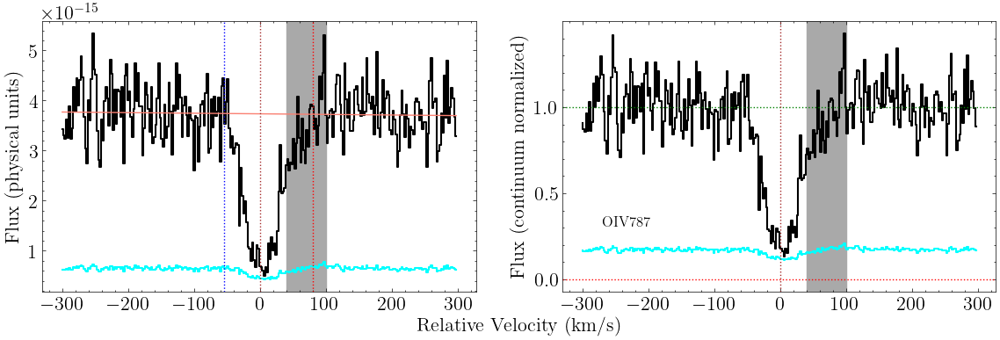

In [220]:
fig, ax = oiv_787_fuv.plot_ion_transition_spec_cont()

In [221]:
oiv_787_fuv.get_EW_total(-55,55)

Integration window: [-55, 55]
EW, 1sig: 134, 6
EW-3sig: 17.591


In [222]:
oiv_787_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [223]:
oiv_787_fuv.init_ion_transition(init_values = [[14.67,23,0]], 
                             lsf_convolve = True)

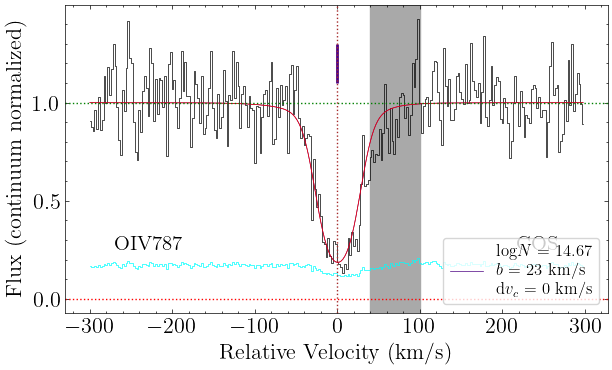

In [224]:
fig, ax = oiv_787_fuv.plot_ion_transition_init_fit()

In [225]:
oiv_787_fuv.fit_ion_transition()

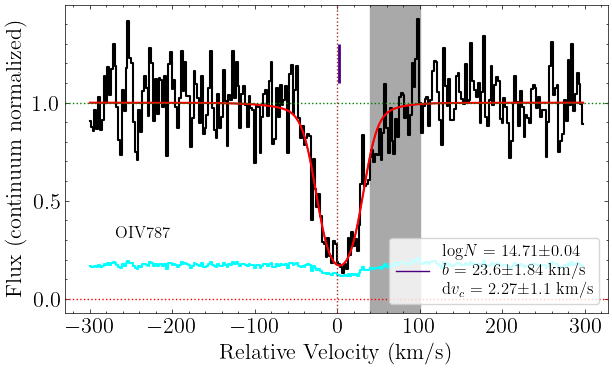

In [226]:
fig, ax = oiv_787_fuv.plot_ion_transition_best_fit()

## OIV ion

Compile the OIV ion

In [227]:
oiv = ion(z_sys, 'OIV', [oiv_553_fuv, oiv_554_fuv, oiv_608_fuv, oiv_787_fuv])

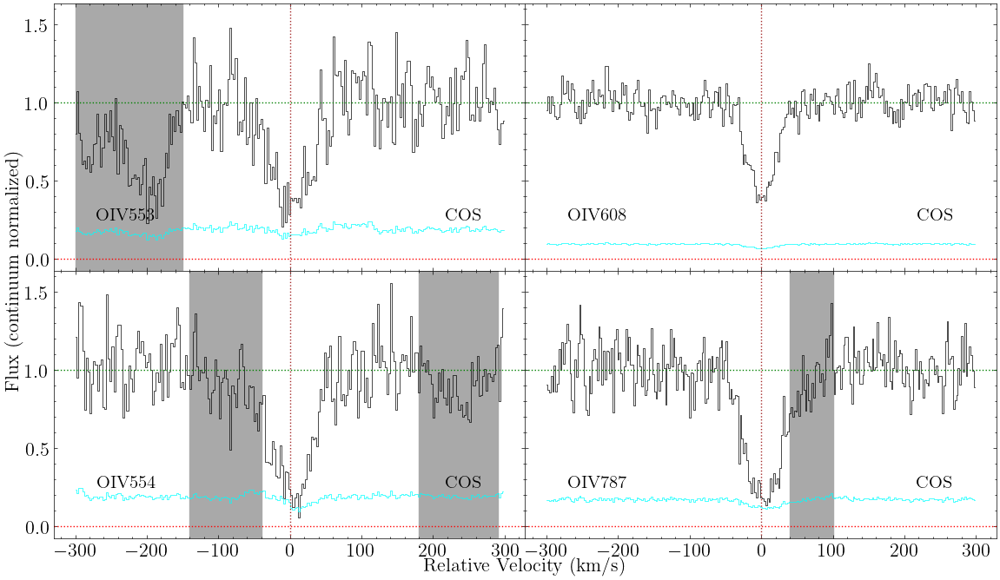

In [228]:
fig, axes = oiv.plot_ion()

In [229]:
oiv.init_ion([
    [[14.67,18.3,0]],
    [[14.67,18.3,0]],
    [[14.67,18.3,0]],
    [[14.67,18.3,0]]
             ],
            )

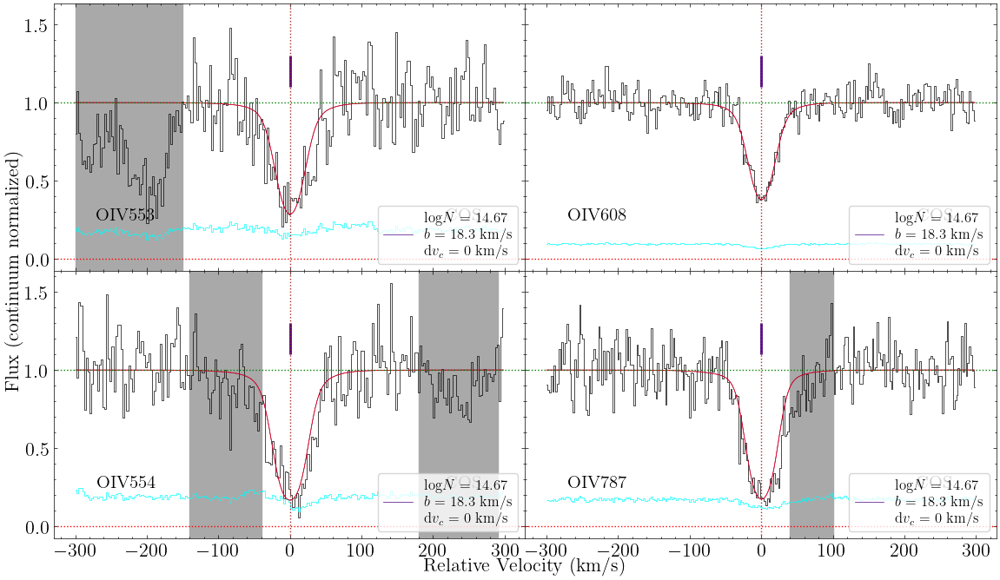

In [230]:
fig, axes = oiv.plot_ion_init_fit(n_cols=2)

In [231]:
#oiv.fit_ion(fix_params_list=['it1c1_dv_c', 'it1c2_dv_c'])

oiv.fit_ion(tie_params_list = [['it1c1_logN', 'it2c1_logN'],
                               ['it1c1_logN', 'it3c1_logN'],
                               ['it1c1_logN', 'it4c1_logN'],
                               ['it1c1_b', 'it2c1_b'],
                               ['it1c1_b', 'it3c1_b'],
                               ['it1c1_b', 'it4c1_b'],
                               ['it1c1_dv_c', 'it2c1_dv_c'],
                               ['it1c1_dv_c', 'it3c1_dv_c'],
                               ['it1c1_dv_c', 'it4c1_dv_c']],
           fix_params_list=['it1c1_dv_c'])

#oiv.fit_ion(lower_bounds_shared = {(0,0):13.5, (0,1):12, (0,2):-40,
#                                   (1,0):13.9, (1,1):5, (1,2):-10},
#           upper_bounds_shared = {(0,0):14.25, (0,1):37, (0,2):-15,
#                                   (1,0):14.5, (1,1):25, (1,2):10})#

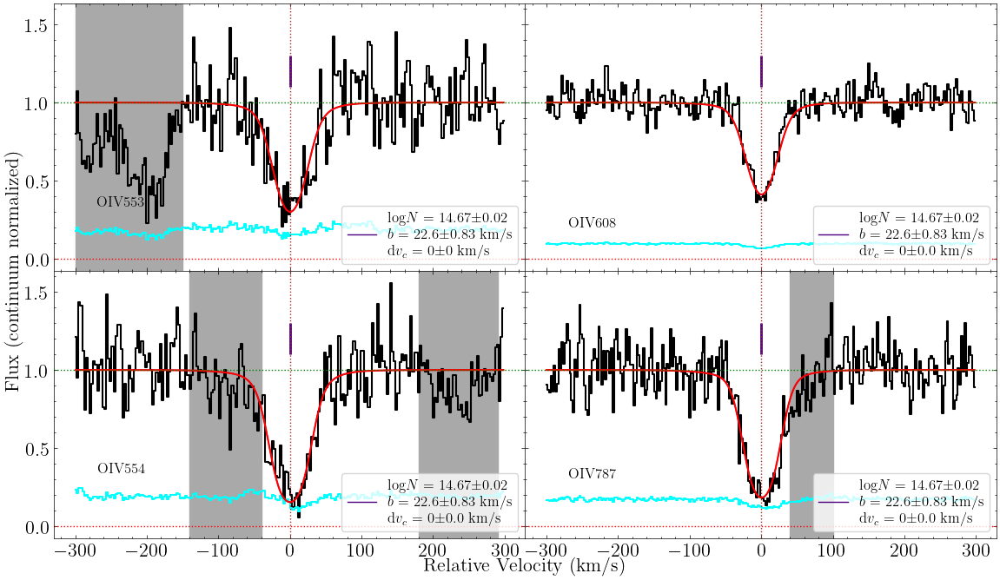

In [232]:
fig, axes = oiv.plot_ion_best_fit()

In [233]:
#oiv.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-8, n_walkers = 100, n_steps=2500)
#oiv.fit_ion_emcee(load=True, loaddir=rootdir)

In [234]:
#fig, axes = oiv.plot_samples()

In [235]:
#oiv.plot_corner()

# OV

## OV 629
Get OV 629 from COS FUV

In [236]:
ov_629_fuv = ion_transition('OV', 629, 'O', z_sys, 'COS FUV')

In [237]:
ov_629_fuv.grab_ion_transition_info(delta_v=6.7)

In [238]:
ov_629_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-240],[110,250]])

In [239]:
ov_629_fuv.cont_norm_flux(v_abs_range=[-80,80], degree=1)

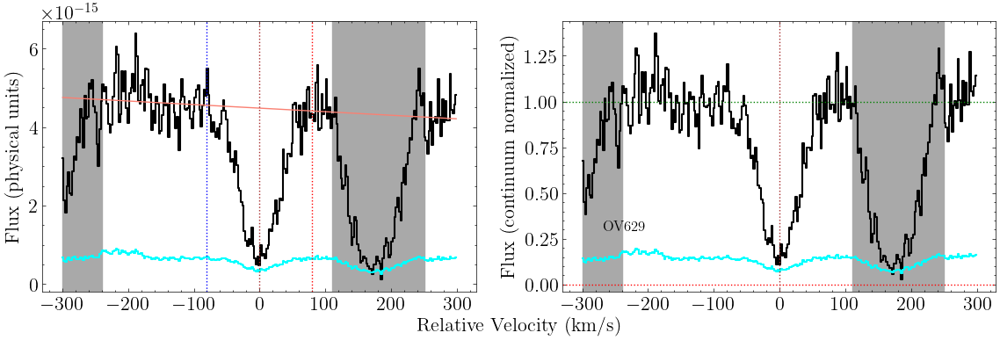

In [240]:
fig, ax = ov_629_fuv.plot_ion_transition_spec_cont()

In [241]:
ov_629_fuv.get_EW_total(-80,80)

Integration window: [-80, 80]
EW, 1sig: 124, 5
EW-3sig: 14.608


In [242]:
ov_629_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [243]:
ov_629_fuv.init_ion_transition(init_values = np.array([[14.20,26,0]]), 
                             lsf_convolve = True)

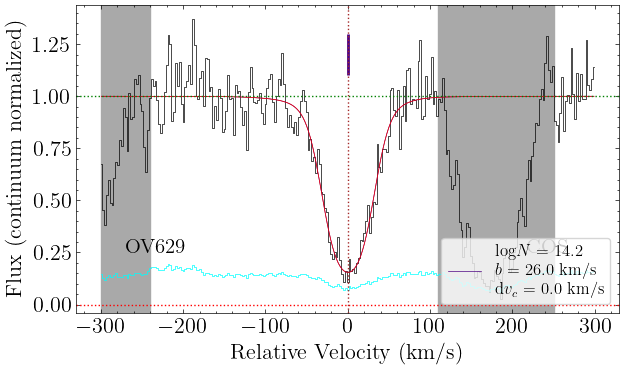

In [244]:
fig, ax = ov_629_fuv.plot_ion_transition_init_fit()

In [245]:
ov_629_fuv.fit_ion_transition()#fix_params_list=['it1c1_dv_c'])

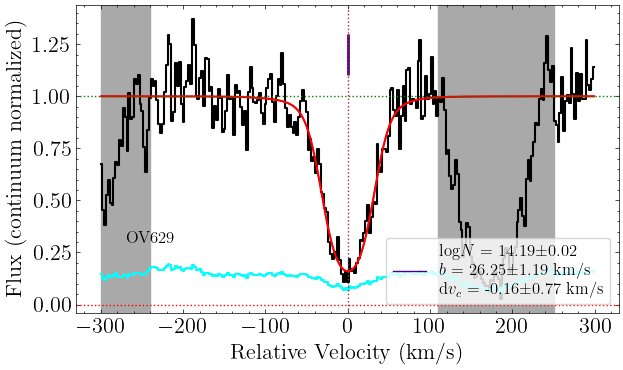

In [246]:
fig, ax = ov_629_fuv.plot_ion_transition_best_fit()

## OV ion

Make the OV ion

In [247]:
ov = ion(z_sys, 'OV', [ov_629_fuv])

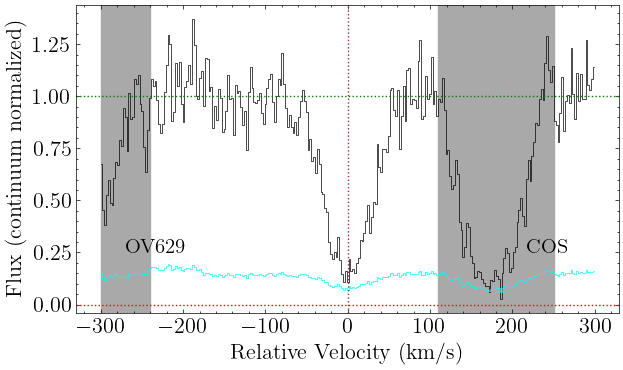

In [248]:
fig, axes = ov.plot_ion()

In [249]:
ov.init_ion([[[14.20,26,0]]])

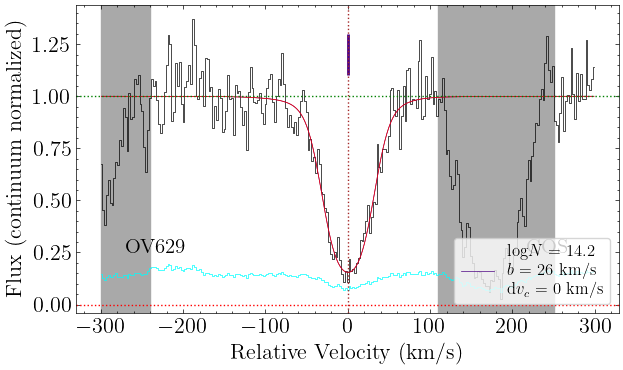

In [250]:
fig, axes = ov.plot_ion_init_fit()

In [251]:
ov.fit_ion(fix_params_list=['it1c1_dv_c'])

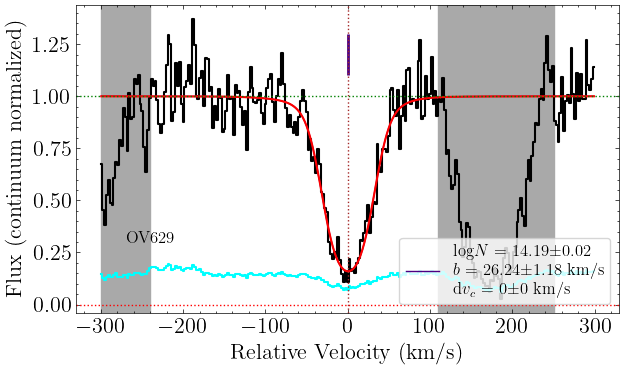

In [252]:
fig, axes = ov.plot_ion_best_fit()

In [253]:
#ov.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-6, n_walkers=100, n_steps=2500)
#ov.fit_ion_emcee(load=True, loaddir=rootdir)

In [254]:
#fig, axes = ov.plot_samples()

In [255]:
#ov.plot_corner()

# OVI

## OVI 1031 (STIS)
Get OVI 1031 from COS STIS

In [256]:
ovi_1031_stis = ion_transition('OVI', 1031, 'O', z_sys, 'STIS')

In [257]:
ovi_1031_stis.grab_ion_transition_info()

In [258]:
ovi_1031_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-260,-180],[210,300],[25,90]])

In [259]:
ovi_1031_stis.cont_norm_flux(v_abs_range=[-25,90], degree=1)

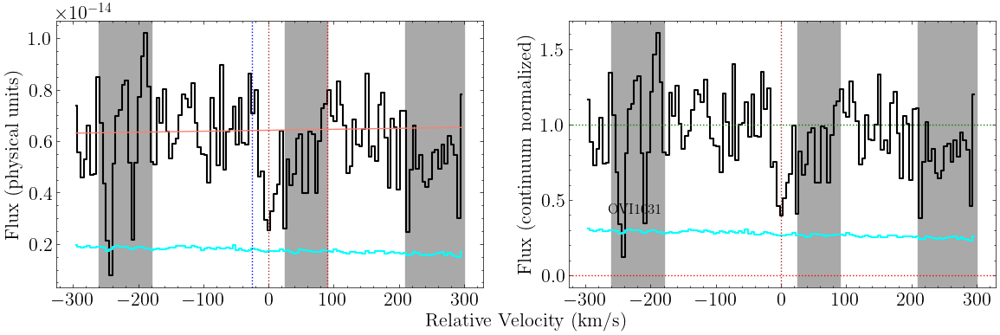

In [260]:
fig, ax = ovi_1031_stis.plot_ion_transition_spec_cont()

In [261]:
ovi_1031_stis.get_EW_total(-40,40)

Integration window: [-40, 40]
EW, 1sig: 58, 18
EW-3sig: 54.431


In [262]:
ovi_1031_stis.grab_ion_transition_lsf(lsf_fits_list)

(-40.0, 40.0)

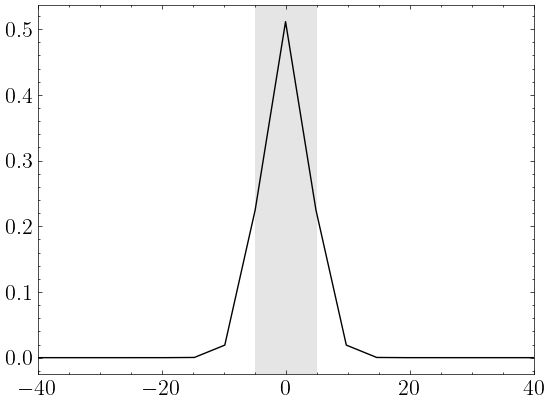

In [263]:
plt.plot(ovi_1031_stis.v_lsf, ovi_1031_stis.lsf)
plt.axvspan(-5,5, alpha=.1)
plt.xlim(-40,40)

In [264]:
ovi_1031_stis.init_ion_transition(init_values = np.array([[13.8, 5, 0]]), 
                             lsf_convolve = True)

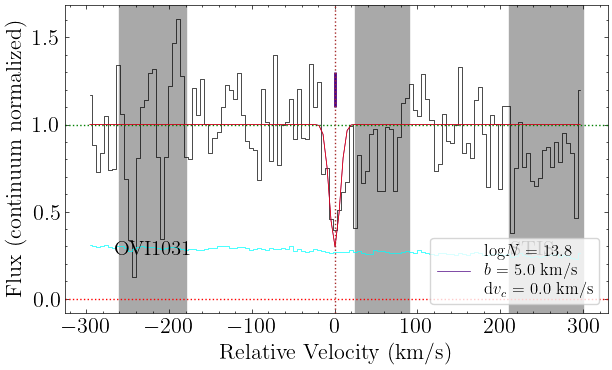

In [265]:
fig, ax = ovi_1031_stis.plot_ion_transition_init_fit()

In [266]:
ovi_1031_stis.fit_ion_transition(fix_params_list = ['it1c1_dv_c'])

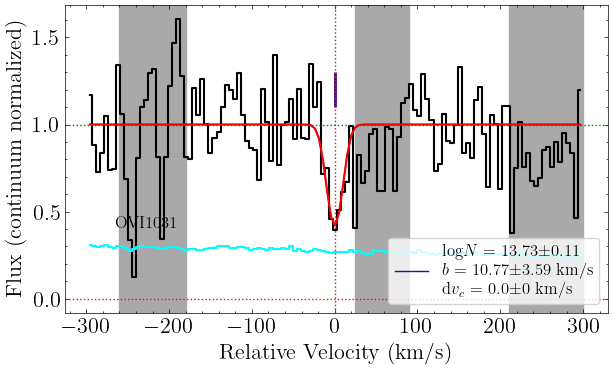

In [267]:
fig, ax = ovi_1031_stis.plot_ion_transition_best_fit()

## Interlude: HI 972 (z=1.23)

In [268]:
hi_972_stis = ion_transition('HI', 972, 'H', 1.234705, 'STIS')

In [269]:
hi_972_stis.grab_ion_transition_info()

In [270]:
hi_972_stis.grab_ion_transition_spec(spec_fits_list, masks=[[150,200]])

In [271]:
hi_972_stis.cont_norm_flux(v_abs_range=[-70,70], degree=1)

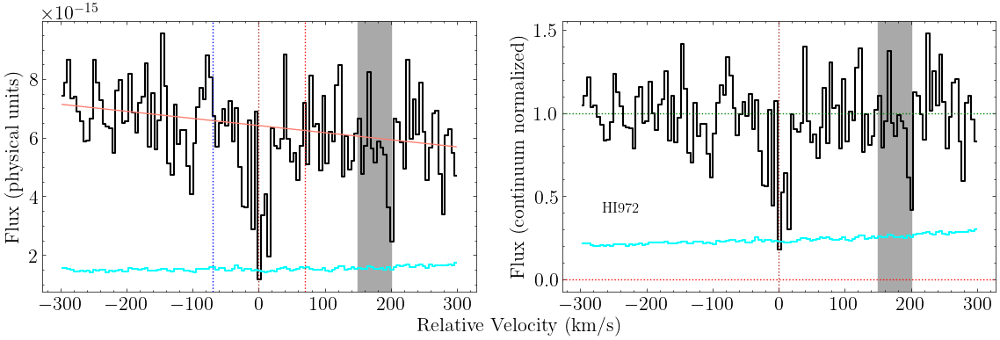

In [272]:
fig, ax = hi_972_stis.plot_ion_transition_spec_cont()

In [273]:
hi_972_stis.grab_ion_transition_lsf(lsf_fits_list)

In [274]:
hi_972_stis.init_ion_transition([[14.34, 24, 0]], 
                            lsf_convolve = True)

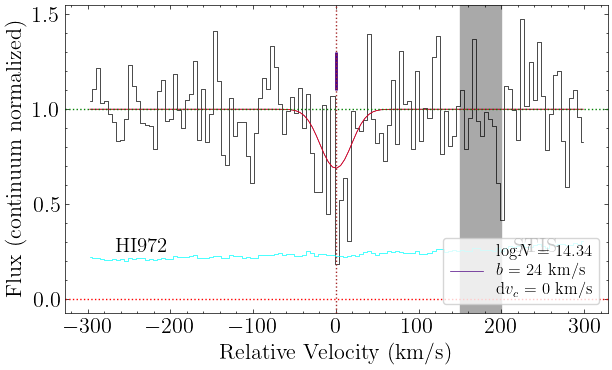

In [275]:
fig, ax = hi_972_stis.plot_ion_transition_init_fit()

## OVI 1037 (STIS)

In [276]:
ovi_1037_stis = ion_transition('OVI', 1037, 'O', z_sys, 'STIS')

In [277]:
ovi_1037_stis.grab_ion_transition_info()

In [278]:
ovi_1037_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-40,0]])

#ovi_1031_stis.grab_ion_transition_spec(spec_fits_list, v_range=[-200,200], masks=[[-200,-170],
#                                                                                  [-31,-17],
#                                                                                  [22,77]])

In [279]:
ovi_1037_stis.cont_norm_flux(v_abs_range=[-60,60], degree=1)

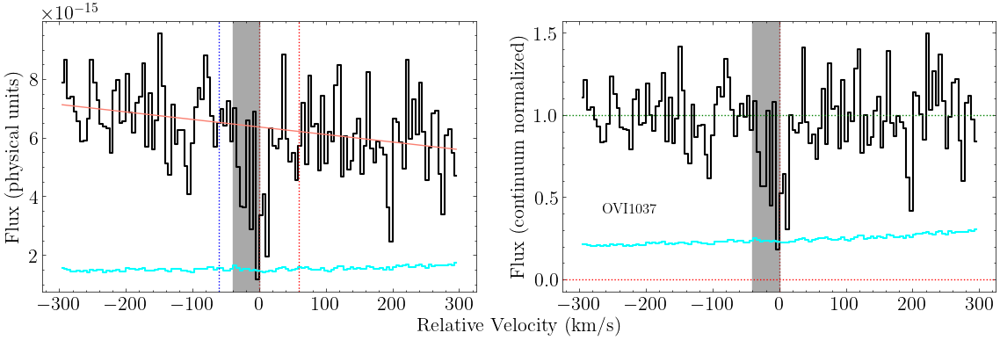

In [280]:
fig, ax = ovi_1037_stis.plot_ion_transition_spec_cont()

In [281]:
#ovi_1037_stis.flux_norm[(ovi_1037_stis.v>-60)&(ovi_1037_stis.v<60)]

In [282]:
dv_c_hi_972_stis = 3e+5*((hi_972_stis.wav0_obs-ovi_1037_stis.wav0_obs)/ovi_1037_stis.wav0_obs)

In [283]:
hi_flux_interp = np.interp(ovi_1037_stis.v, hi_972_stis.v+dv_c_hi_972_stis, hi_972_stis.init_total_flux)

In [284]:
ovi_1037_stis.flux_norm = ovi_1037_stis.flux_norm/hi_flux_interp

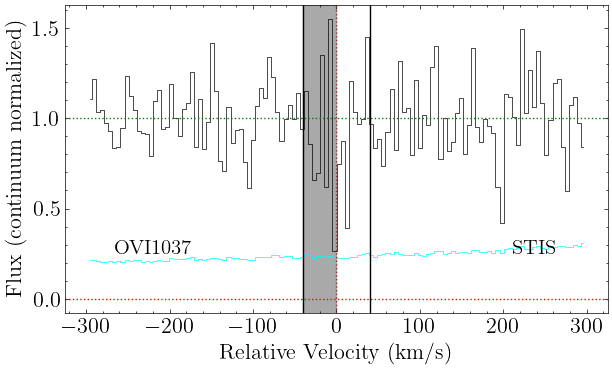

In [285]:
fig, ax = ovi_1037_stis.plot_ion_transition_spec()
ax.axvline(-40)
ax.axvline(40)

In [286]:
ovi_1037_stis.get_EW_total(-40,40)

Integration window: [-40, 40]
EW, 1sig: 28, 15
EW-3sig: 46.021


In [287]:
ovi_1037_stis.grab_ion_transition_lsf(lsf_fits_list)

In [288]:
ovi_1037_stis.init_ion_transition(init_values = np.array([[13.8, 13, 0]]), 
                             lsf_convolve = True)

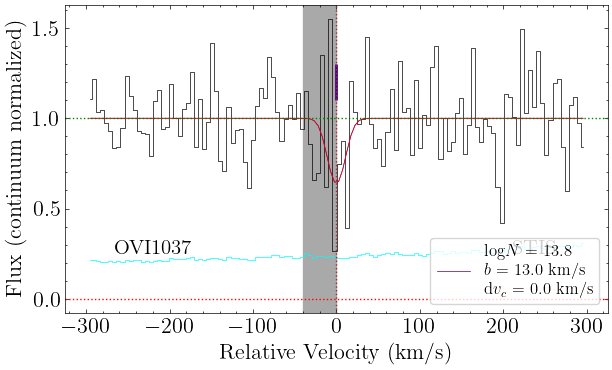

In [289]:
fig, ax = ovi_1037_stis.plot_ion_transition_init_fit()

In [290]:
ovi_1037_stis.fit_ion_transition()

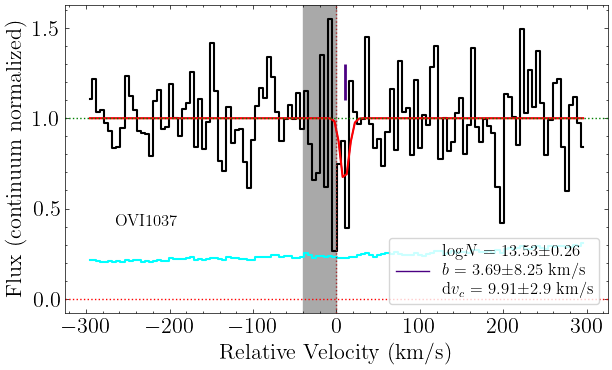

In [291]:
fig, ax = ovi_1037_stis.plot_ion_transition_best_fit()

## OVI ion
Now compile the OVI ion

In [292]:
ovi = ion(z_sys, 'OVI', [ovi_1031_stis, ovi_1037_stis])

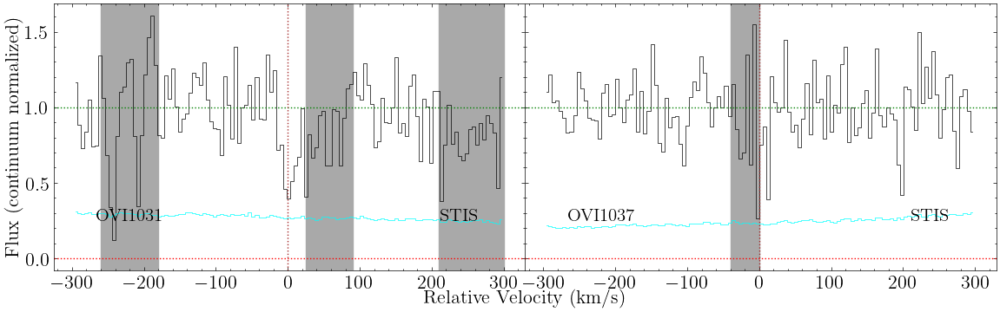

In [293]:
fig, axes = ovi.plot_ion()

In [294]:
ovi.init_ion([[[13.8, 13, 0]],
              [[13.8, 13, 0]]])

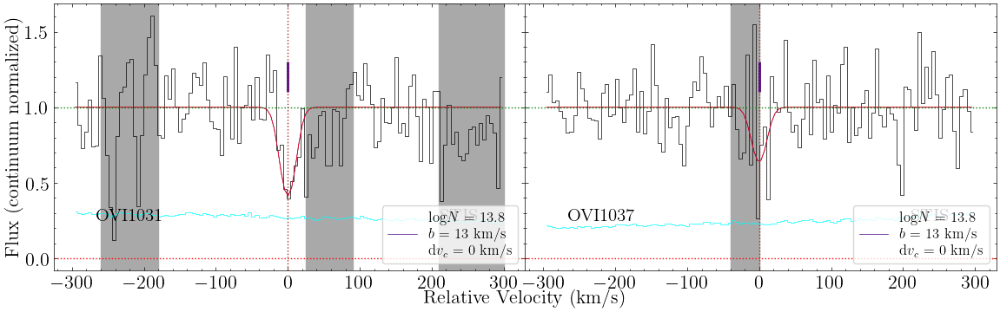

In [295]:
fig, axes = ovi.plot_ion_init_fit()

In [296]:
ovi.fit_ion(tie_params_list = [['it1c1_logN', 'it2c1_logN'],
                               ['it1c1_b', 'it2c1_b'],
                               ['it1c1_dv_c', 'it2c1_dv_c']],
           fix_params_list = ['it1c1_dv_c'],
           lower_bounds_dict = {'it1c1_b': 5},
           upper_bounds_dict = {'it1c1_b':45})

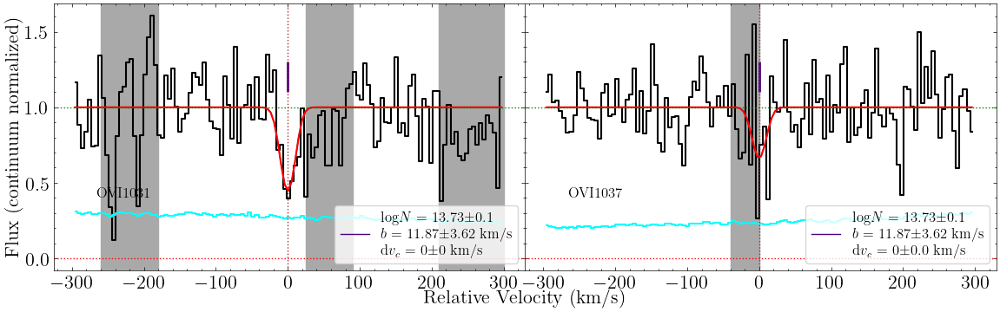

In [297]:
fig, axes = ovi.plot_ion_best_fit()

In [298]:
#ovi.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-8, n_walkers=100, n_steps=2500)
#ovi.fit_ion_emcee(load=True, loaddir=rootdir)

In [299]:
#ovi.plot_corner()

In [300]:
#fig, axes = ovi.plot_samples()

In [301]:
#np.percentile(ciii.result_emcee.flatchain['it1c1_logN'], 100*(1-cdf_3sig))

In [302]:
#np.percentile(ciii.result_emcee.flatchain['it1c1_b'], 100*cdf_3sig)

# SiIII

## SiIII 1206 (STIS)

In [303]:
siiii_1206_stis = ion_transition('SiIII', 1206, 'Si', z_sys, 'STIS')

In [304]:
siiii_1206_stis.grab_ion_transition_info()

In [305]:
siiii_1206_stis.grab_ion_transition_spec(spec_fits_list)

In [306]:
siiii_1206_stis.cont_norm_flux(v_abs_range=[-100,100], degree=1)

In [307]:
np.mean(siiii_1206_stis.v[1:]-siiii_1206_stis.v[:-1])

4.86302169763926

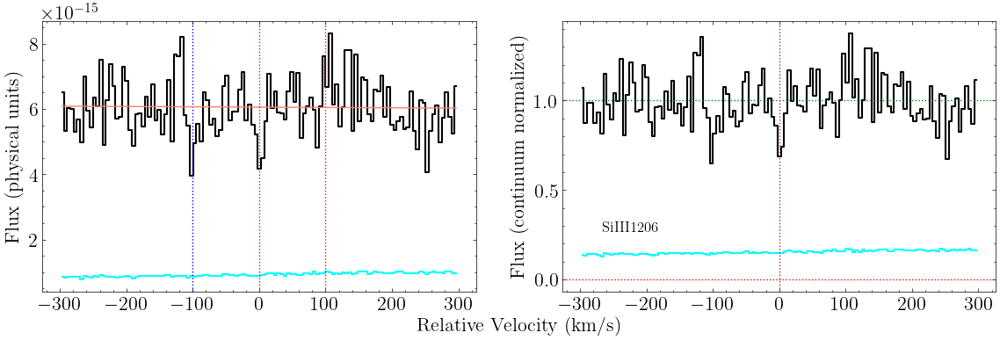

In [308]:
fig, ax = siiii_1206_stis.plot_ion_transition_spec_cont()

In [309]:
siiii_1206_stis.grab_ion_transition_lsf(lsf_fits_list)

In [310]:
siiii_1206_stis.get_upper_lim(20)

logN-1sig: 11.8
logN-2sig: 12.0
logN-3sig: 12.2


In [311]:
siiii_1206_stis.get_upper_lim_data(20, 0)

logN-1sig: 12.1
logN-2sig: 12.3
logN-3sig: 12.4


In [312]:
siiii_1206_stis.get_EW_total(-30,30)

Integration window: [-30, 30]
EW, 1sig: 8, 10
EW-3sig: 30.808


In [313]:
siiii_1206_stis.grab_ion_transition_lsf(lsf_fits_list)

In [314]:
siiii_1206_stis.init_ion_transition(init_values = np.array([[12.0, 16, 0]]), 
                             lsf_convolve = True)

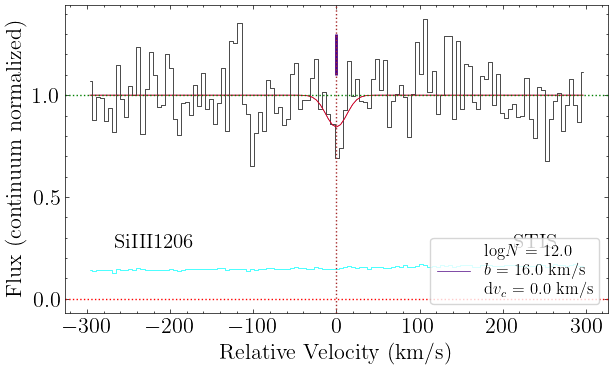

In [315]:
fig, ax = siiii_1206_stis.plot_ion_transition_init_fit()

In [316]:
siiii_1206_stis.fit_ion_transition()

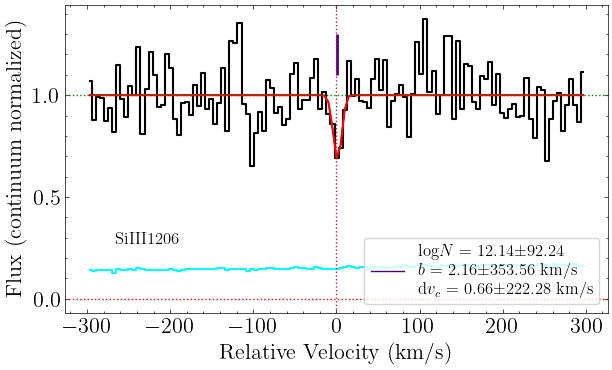

In [317]:
fig, ax = siiii_1206_stis.plot_ion_transition_best_fit()

## SiIII ion

In [318]:
siiii = ion(z_sys, 'SiIII', [siiii_1206_stis])

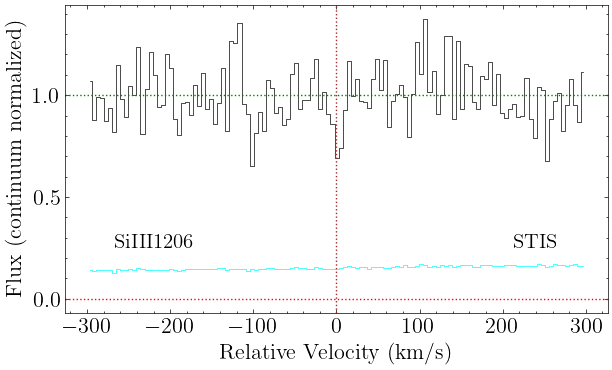

In [319]:
fig, axes = siiii.plot_ion()

In [320]:
siiii.init_ion([[[12.2, 8, 0]]])

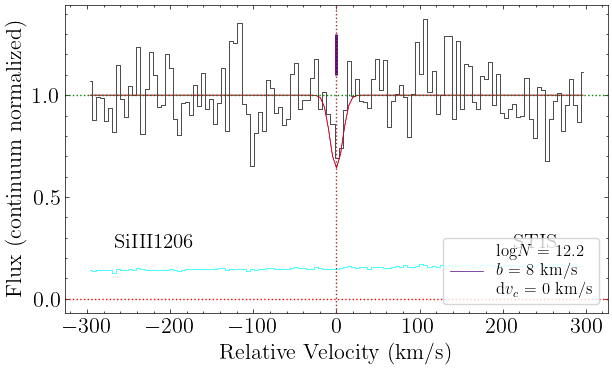

In [321]:
fig, axes = siiii.plot_ion_init_fit()

In [322]:
siiii.fit_ion(fix_params_list=['it1c1_dv_c'],
             lower_bounds_dict={'it1c1_b':2.4})

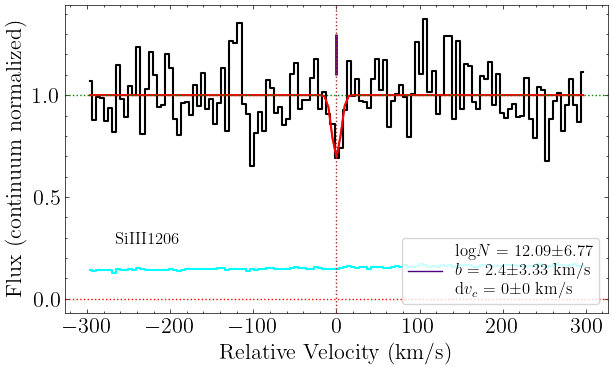

In [323]:
fig, axes = siiii.plot_ion_best_fit()

In [324]:
#siiii.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-16, n_walkers=200, n_steps=5000)
#siiii.fit_ion_emcee(load=True, loaddir=rootdir)

In [325]:
#fig, axes = siiii.plot_samples()

In [326]:
#siiii.plot_corner()

In [327]:
#np.percentile(siiii.result_emcee.flatchain['it1c1_logN'], 100*cdf_3sig)

In [328]:
#np.percentile(ciii.result_emcee.flatchain['it1c1_b'], 100*cdf_3sig)

# HI + CIII + CIV + NIV + OIII + OIV + OV + OVI - original

In [329]:
hi_ciii_civ_niv_oiii_oiv_ov_ovi = ion_suite(z_sys, 'HI+CIII+CIV+NIV+OIII+OIV+OV+OVI', [hi, ciii, civ, niv, oiii, oiv, ov, ovi])

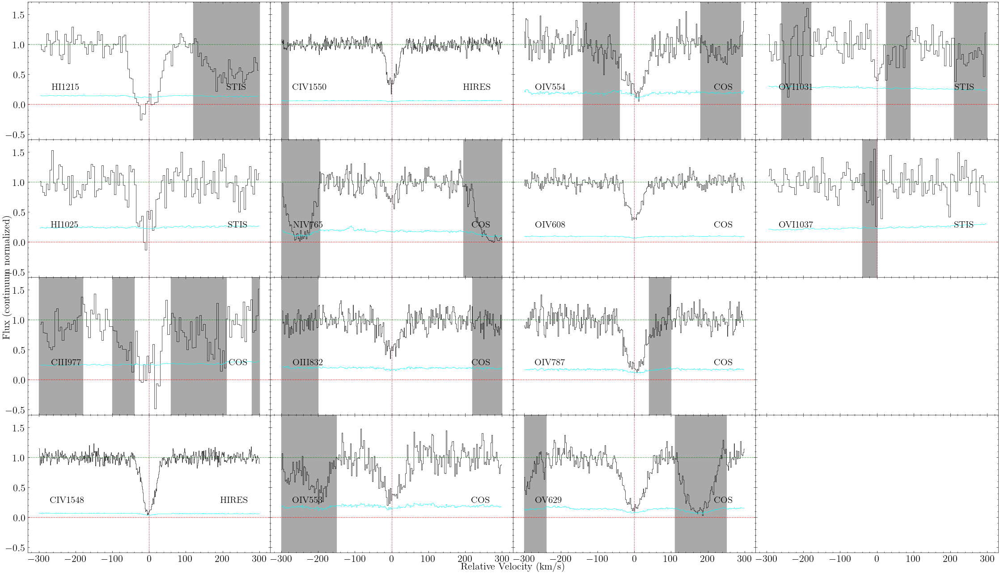

In [330]:
fig, axes = hi_ciii_civ_niv_oiii_oiv_ov_ovi.plot_ion_suite(n_cols=4)

In [368]:
hi_ciii_civ_niv_oiii_oiv_ov_ovi.init_ion_suite([
                                [[14.5,21,0],[14.1,22,-20]], # HI
                                [[14.5,21,0],[14.1,22,-20]],
                                [[14.4,18.0,0]], # CIII
                                [[13.97,18.0,0]], # CIV
                                [[13.97,18.0,0]], # CIV
                                [[13.1,13,0]], # NIV
                                [[14.22,25,0]], # OIII
                                [[14.67,23,0]],  # OIV
                                [[14.67,23,0]],
                                [[14.67,23,0]],
                                [[14.67,23,0]],
                                [[14.20,26,0]],  # OV
                                [[13.8,13,0]],  # OVI
                                [[13.8,13,0]],
                                   ])

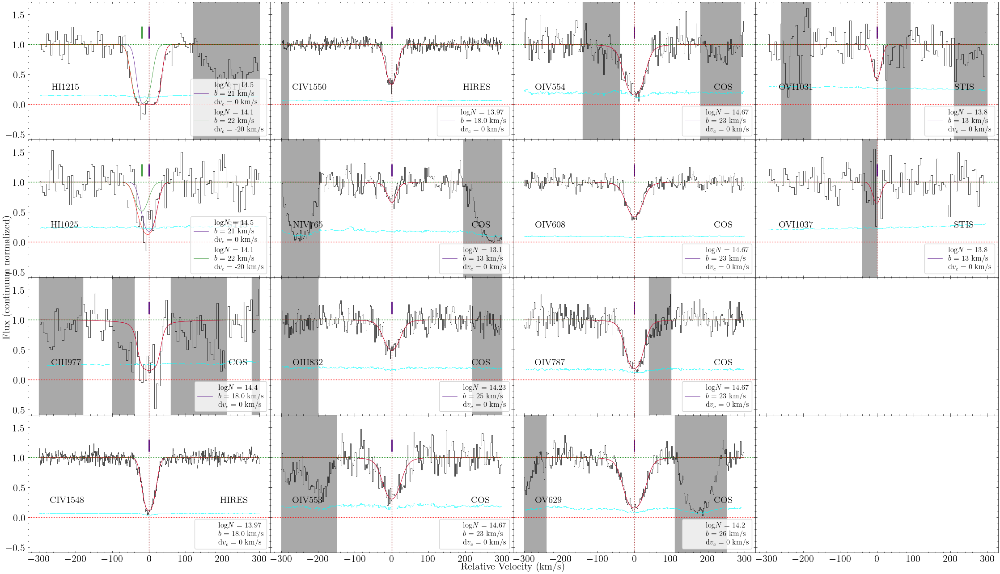

In [332]:
fig, axes = hi_ciii_civ_niv_oiii_oiv_ov_ovi.plot_ion_suite_init_fit(n_cols=4)

In [333]:
hi_ciii_civ_niv_oiii_oiv_ov_ovi.fit_ion_suite(tie_params_list=[
    ['it1c1_logN', 'it2c1_logN'], # Tie logN for HI c1
    ['it1c2_logN', 'it2c2_logN'], # Tie logN for HI c2
    ['it4c1_logN', 'it5c1_logN'], # Tie logN for CIV c1
    ['it8c1_logN', 'it9c1_logN'], # Tie logN for OIV c1
    ['it8c1_logN', 'it10c1_logN'], # Tie logN for OIV c1
    ['it8c1_logN', 'it11c1_logN'], # Tie logN for OIV c1
    ['it13c1_logN', 'it14c1_logN'], # Tie logN for OVI c1
    ['it1c1_b', 'it2c1_b'], # Tie b for HI c1
    ['it1c2_b', 'it2c2_b'], # Tie b for HI c2
    ['it3c1_b', 'it4c1_b'], # Tie b for CIII, CIV c1
    ['it3c1_b', 'it5c1_b'],
    ['it8c1_b', 'it9c1_b'], # Tie b for OIV, c1
    ['it8c1_b', 'it10c1_b'],
    ['it8c1_b', 'it11c1_b'],
    ['it13c1_b', 'it14c1_b'], # Tie b for OVI, c1
    ['it1c1_dv_c', 'it2c1_dv_c'], # Tie all dv_c together, c1 (HI, CIV, OIII, OIV, OV, OVI)
    ['it1c1_dv_c', 'it3c1_dv_c'],
    ['it1c1_dv_c', 'it4c1_dv_c'],
    ['it1c1_dv_c', 'it5c1_dv_c'],
    ['it1c1_dv_c', 'it6c1_dv_c'],
    ['it1c1_dv_c', 'it7c1_dv_c'],
    ['it1c1_dv_c', 'it8c1_dv_c'], 
    ['it1c1_dv_c', 'it9c1_dv_c'],
    ['it1c1_dv_c', 'it10c1_dv_c'],
    ['it1c1_dv_c', 'it11c1_dv_c'],
    ['it1c1_dv_c', 'it12c1_dv_c'],
    ['it1c1_dv_c', 'it13c1_dv_c'],
    ['it1c1_dv_c', 'it14c1_dv_c'],
    ['it1c2_dv_c', 'it2c2_dv_c']],
    lower_bounds_dict = {'it1c1_b': 15, # Avoid narrow HI
                         'it6c1_b':5, # Avoid narrow NIV
                         'it14c1_b':5}, # Avoid narrow OVI
    upper_bounds_dict = {'it6c1_b': 40, # Avoid too broad NIV
                         'it14c1_b': 45}, # Avoid too broad OVI
    exclude_models=['it1c1_logN < it1c2_logN', # Keep blue HI component weaker
                    'it3c1_logN > it1c1_logN', # Keep CIII weaker than associated HI
                   ]
                                              )

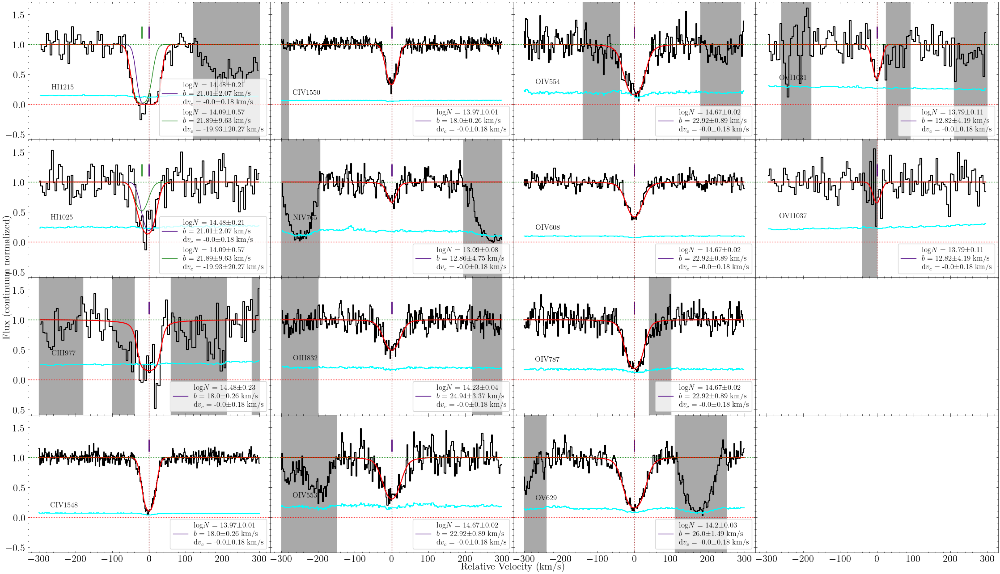

In [334]:
fig, axes = hi_ciii_civ_niv_oiii_oiv_ov_ovi.plot_ion_suite_best_fit(n_cols=4)

In [335]:
#hi_ciii_civ_niv_oiii_oiv_ov_ovi.result.var_names

In [336]:
hi_ciii_civ_niv_oiii_oiv_ov_ovi.fit_ion_suite_emcee(loaddir=rootdir, n_walkers=200, n_steps=5000, scale_covar=1e-21)
#hi_ciii_civ_niv_oiii_oiv_ov_ovi.fit_ion_suite_emcee(loaddir=rootdir, load=True)

100%|█████████████████████████████████████| 5000/5000 [1:21:43<00:00,  1.02it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 19 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 100;
tau: [233.11760274 257.69715201 218.90179064 242.95750674 248.11433277
 260.16464652 215.78635865 231.36942841 216.13540858 216.49565023
 241.99432841 229.72870325 213.10303117 211.19796032 231.26250229
 220.35315904 229.00484847 217.92353653 231.53054922]


In [337]:
df_slice = hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain[['it1c1_logN', 'it3c1_logN']]

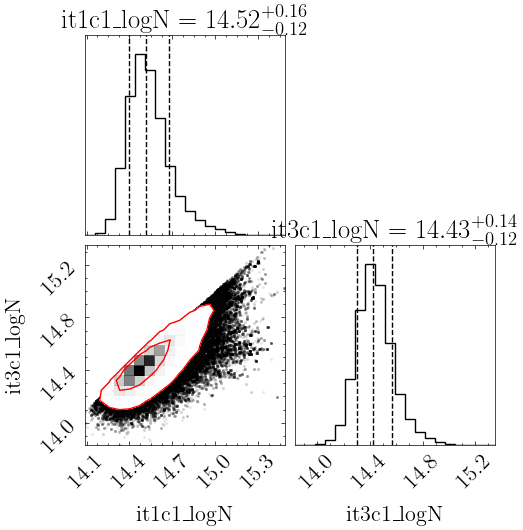

In [338]:
corner_plot = corner.corner(df_slice, 
              labels=list(df_slice.columns),
              quantiles=(1-cdf_1sig, 0.5, cdf_1sig),
              show_titles=True, plot_density=True, 
              levels=[2*cdf_1sig-1, 2*cdf_2sig-1], 
              contour_kwargs={'colors':'red'})

In [348]:
#hi_ciii_civ_niv_oiii_oiv_ov_ovi.plot_corner()

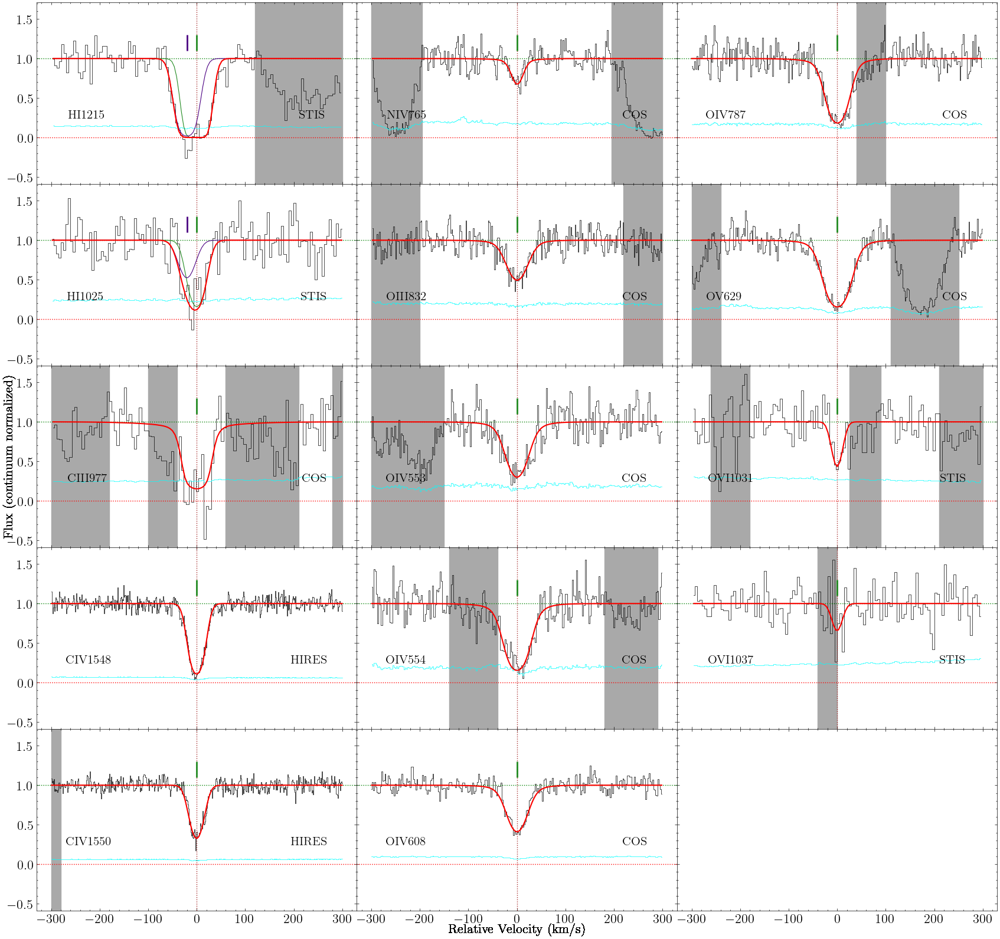

In [349]:
fig, axes = hi_ciii_civ_niv_oiii_oiv_ov_ovi.plot_samples(n_cols=3)

In [350]:
np.percentile(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it3c1_logN'], 100*cdf_1sig)-np.median(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it3c1_logN'])

0.14284401547454628

In [351]:
np.percentile(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it8c1_b'], 100*cdf_1sig)-np.median(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it8c1_b'])

0.9866150247612708

In [352]:
np.median(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it13c1_logN'])-np.percentile(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it13c1_logN'], 100*(1-cdf_1sig))

0.1448321733980631

# Summary List
Now compile a summary list

In [353]:
summary = ion_summary([hi_ciii_civ_niv_oiii_oiv_ov_ovi])

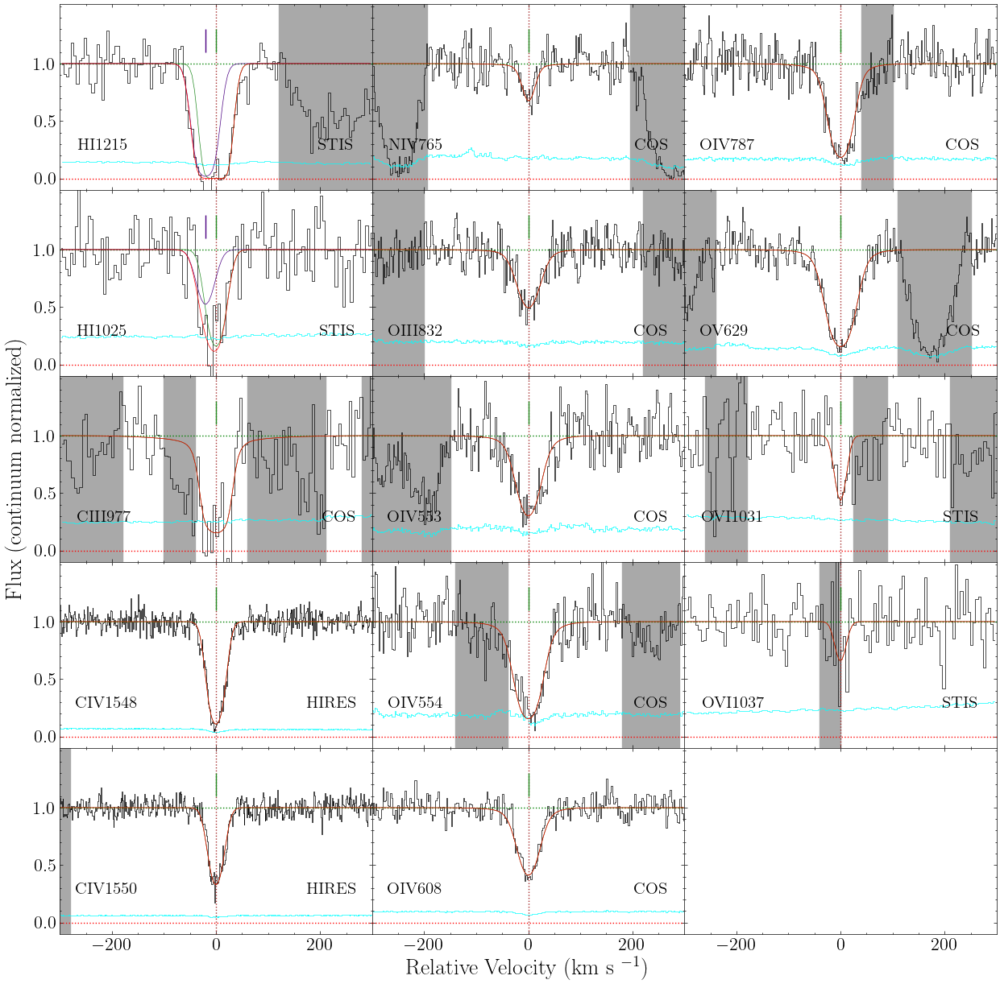

In [354]:
fig, axes = plt.subplots(5, 3, figsize=(5*3, 3*5), sharex=True, sharey=True)

summary.plot_samples(fig=fig, axes=axes, n_cols=3)

axes[0,0].set_ylim(-0.1,1.52)
axes[0,0].set_xlim(-299.9,299.9)
axes[0,0].set_yticks([0,0.5,1])

#plt.savefig(rootdir+'Ions/z={}/z={}_vp.pdf'.format(str(z_sys), str(z_sys).replace('.', '_')), dpi=300)

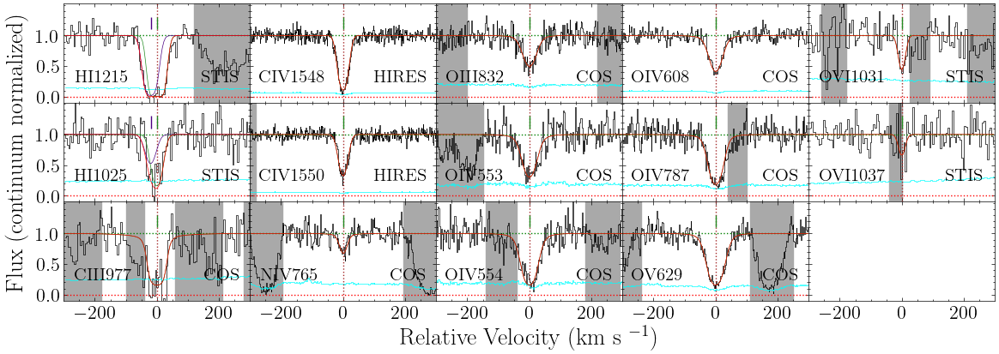

In [355]:
fig, axes = plt.subplots(3, 5, figsize=(5*2.8, 3*1.5), sharex=True, sharey=True)

summary.plot_samples(fig=fig, axes=axes, n_cols=5)

axes[0,0].set_ylim(-0.1,1.52)
axes[0,0].set_xlim(-299.9,299.9)
axes[0,0].set_yticks([0,0.5,1])

ax_label = fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axes
ax_label.set_xticks([])
ax_label.set_yticks([])

#ax_label.set_title('Voigt profile analysis to measure column densities', fontsize=22)

plt.savefig(rootdir+'Ions/z={}/z={}_vp_alt.pdf'.format(str(z_sys), str(z_sys).replace('.', '_')), dpi=300)

In [356]:
summary.print_summary()

HI1215
dv_c = -0.0 \pm 0.2, logN = 14.52 \pm 0.16, b = 20.6_{-2.7}^{+2.3}
dv_c = -20.1_{-7.1}^{+7.2}, logN = 14.08 \pm 0.24, b = 21.6_{-4.1}^{+4.7}
HI1025
dv_c = -0.0 \pm 0.2, logN = 14.52 \pm 0.16, b = 20.6_{-2.7}^{+2.3}
dv_c = -20.1_{-7.1}^{+7.2}, logN = 14.08 \pm 0.24, b = 21.6_{-4.1}^{+4.7}
CIII977
dv_c = -0.0 \pm 0.2, logN = 14.43 \pm 0.14, b = 18.0 \pm 0.3
CIV1548
dv_c = -0.0 \pm 0.2, logN = 13.97 \pm 0.01, b = 18.0 \pm 0.3
CIV1550
dv_c = -0.0 \pm 0.2, logN = 13.97 \pm 0.01, b = 18.0 \pm 0.3
NIV765
dv_c = -0.0 \pm 0.2, logN = 13.06 \pm 0.11, b = 12.9_{-5.0}^{+6.3}
OIII832
dv_c = -0.0 \pm 0.2, logN = 14.22 \pm 0.05, b = 24.9_{-3.9}^{+4.3}
OIV553
dv_c = -0.0 \pm 0.2, logN = 14.67 \pm 0.02, b = 22.6 \pm 1.0
OIV554
dv_c = -0.0 \pm 0.2, logN = 14.67 \pm 0.02, b = 22.6 \pm 1.0
OIV608
dv_c = -0.0 \pm 0.2, logN = 14.67 \pm 0.02, b = 22.6 \pm 1.0
OIV787
dv_c = -0.0 \pm 0.2, logN = 14.67 \pm 0.02, b = 22.6 \pm 1.0
OV629
dv_c = -0.0 \pm 0.2, logN = 14.20 \pm 0.04, b = 26.0 \pm 1.7
OVI1031
d

# Paper plot

In [369]:
oiii_832_fuv.init_values

[[14.22, 25, 0]]

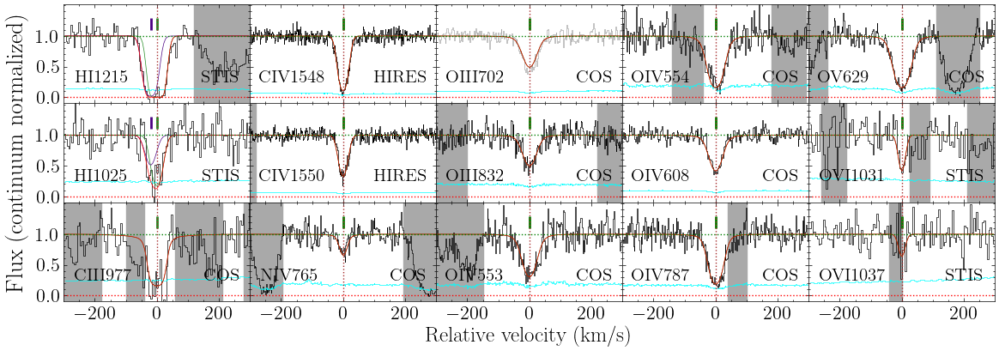

In [370]:
fig, axes = plt.subplots(3, 5, figsize=(5*2.8, 3*1.5), sharex=True, sharey=True)

#summary.plot_samples(fig=fig, axes=axes, n_cols=5)

hi_1215_stis.plot_ion_transition_init_fit(fig, axes[0,0], legend=False, label_axes=False, colors=['forestgreen','indigo'])
hi_1025_stis.plot_ion_transition_init_fit(fig, axes[1,0], legend=False, label_axes=False, colors=['forestgreen','indigo'])
ciii_977_nuv.plot_ion_transition_init_fit(fig, axes[2,0], legend=False, label_axes=False, colors=['forestgreen'])

civ_1548_hires.plot_ion_transition_init_fit(fig, axes[0,1], legend=False, label_axes=False, 
                                            colors=['green','green'], linestyles=['-','--'])
civ_1550_hires.plot_ion_transition_init_fit(fig, axes[1,1], legend=False, label_axes=False, 
                                            colors=['green','green'], linestyles=['-','--'])
niv_765_fuv.plot_ion_transition_init_fit(fig, axes[2,1], legend=False, label_axes=False, colors=['green'])


oiii_702_fuv.plot_ion_transition_init_fit(fig, axes[0,2], legend=False, label_axes=False, 
                                            colors=['green','green'], linestyles=['-','--'], flux_color='darkgrey')
oiii_832_fuv.plot_ion_transition_init_fit(fig, axes[1,2], legend=False, label_axes=False, 
                                            colors=['green','green'], linestyles=['-','--'])
oiv_553_fuv.plot_ion_transition_init_fit(fig, axes[2,2], legend=False, label_axes=False, colors=['green'])

oiv_554_fuv.plot_ion_transition_init_fit(fig, axes[0,3], legend=False, label_axes=False, colors=['green'])
oiv_608_fuv.plot_ion_transition_init_fit(fig, axes[1,3], legend=False, label_axes=False, colors=['green'])
oiv_787_fuv.plot_ion_transition_init_fit(fig, axes[2,3], legend=False, label_axes=False, colors=['green'])

ov_629_fuv.plot_ion_transition_init_fit(fig, axes[0,4], legend=False, label_axes=False, colors=['green'])
ovi_1031_stis.plot_ion_transition_init_fit(fig, axes[1,4], legend=False, label_axes=False, colors=['green'])
ovi_1037_stis.plot_ion_transition_init_fit(fig, axes[2,4], legend=False, label_axes=False, colors=['green'])

axes[0,0].set_ylim(-0.1,1.52)
axes[0,0].set_xlim(-299.9,299.9)
axes[0,0].set_yticks([0,0.5,1])

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

plt.subplots_adjust(wspace=0, hspace=0)

ax_label.set_xlabel('Relative velocity (km/s)', labelpad=20, fontsize=18)
ax_label.set_ylabel('Flux (continuum normalized)', labelpad=30, fontsize=20)

#ax_label.set_title('Two-phase PIE model for a warm-hot absorber', y=1.07, fontsize=19)

plt.savefig(rootdir+'Ions/z={}/z={}_vp_alt.pdf'.format(str(z_sys), str(z_sys).replace('.', '_')), dpi=300)

# OII

## OII 834

In [341]:
oii_834_fuv = ion_transition('OII', 834, 'O', z_sys, 'COS FUV')

In [342]:
oii_834_fuv.grab_ion_transition_info()

In [343]:
oii_834_fuv.grab_ion_transition_spec(spec_fits_list)

In [344]:
oii_834_fuv.cont_norm_flux(v_abs_range=[-100,100], degree=1)

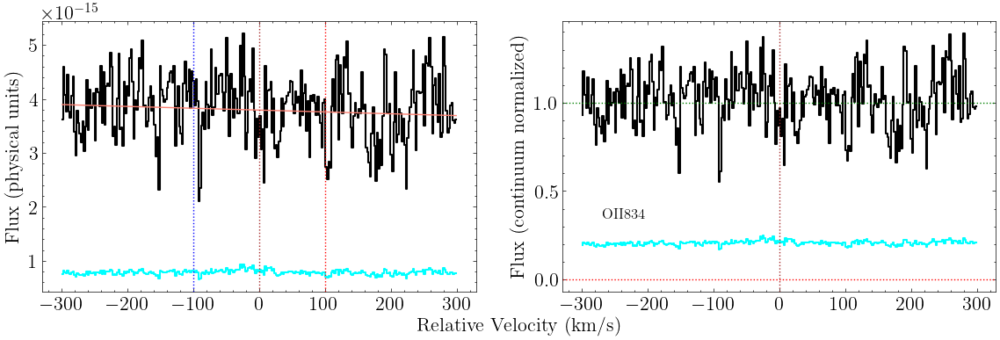

In [345]:
fig, ax = oii_834_fuv.plot_ion_transition_spec_cont()

In [346]:
oii_834_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [347]:
oii_834_fuv.get_upper_lim(20)

logN-1sig: 13.1
logN-2sig: 13.3
logN-3sig: 13.5


In [348]:
oii_834_fuv.get_upper_lim_data(20,0)

logN-1sig: 13.2
logN-2sig: 13.4
logN-3sig: 13.6


# Proposal plot

In [349]:
import matplotlib

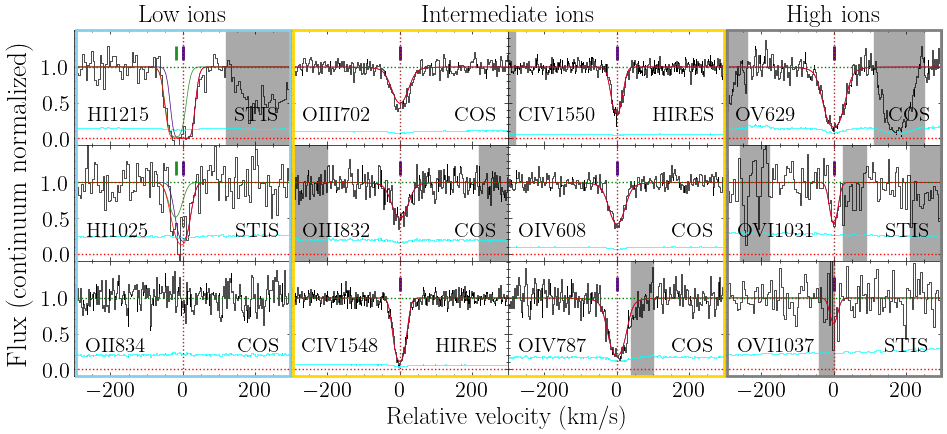

In [350]:
fig, axes = plt.subplots(3, 4, figsize=(4*2.8, 3*1.5), sharex=True, sharey=True)

#summary.plot_samples(fig=fig, axes=axes, n_cols=5)

# Low ions
hi_1215_stis.plot_ion_transition_init_fit(fig, axes[0,0], legend=False, label_axes=False)
hi_1025_stis.plot_ion_transition_init_fit(fig, axes[1,0], legend=False, label_axes=False)
oii_834_fuv.plot_ion_transition_spec(fig, axes[2,0], label_axes=False)

xmin, xmax = hi_1215_stis.v[0],hi_1215_stis.v[-1]

# Add subtitle
axes[0,0].set_title('Low ions', fontsize=18)

# Add border
_,top = fig.transFigure.inverted().transform(axes[0,0].transAxes.transform([0,1]))
_,bottom = fig.transFigure.inverted().transform(axes[2,0].transAxes.transform([0,0]))
trans = matplotlib.transforms.blended_transform_factory(axes[2,0].transData, fig.transFigure)
r = matplotlib.patches.Rectangle(xy=(xmin,bottom), width=xmax-xmin, height=top-bottom, transform=trans,
                                 fc='none', ec='skyblue', lw=2)
fig.add_artist(r)

# Intermediate ions
oiii_702_fuv.plot_ion_transition_init_fit(fig, axes[0,1], legend=False, label_axes=False)
oiii_832_fuv.plot_ion_transition_init_fit(fig, axes[1,1], legend=False, label_axes=False)
civ_1548_hires.plot_ion_transition_init_fit(fig, axes[2,1], legend=False, label_axes=False)

civ_1550_hires.plot_ion_transition_init_fit(fig, axes[0,2], legend=False, label_axes=False)
oiv_608_fuv.plot_ion_transition_init_fit(fig, axes[1,2], legend=False, label_axes=False)
oiv_787_fuv.plot_ion_transition_init_fit(fig, axes[2,2], legend=False, label_axes=False)

# Add border
_,top = fig.transFigure.inverted().transform(axes[0,0].transAxes.transform([0,1]))
_,bottom = fig.transFigure.inverted().transform(axes[2,0].transAxes.transform([0,0]))
trans = matplotlib.transforms.blended_transform_factory(axes[2,1].transData, fig.transFigure)
r = matplotlib.patches.Rectangle(xy=(xmin,bottom), width=2.015*(xmax-xmin), height=top-bottom, transform=trans,
                                 fc='none', ec='gold', lw=2)
fig.add_artist(r)

# Add subtitle

axes[0,1].set_title(r'Intermediate ions', fontsize=18, x=1)
#axes[0,2].set_title('\ \ ions', fontsize=14, loc='left')

# High ions
ov_629_fuv.plot_ion_transition_init_fit(fig, axes[0,3], legend=False, label_axes=False)
ovi_1031_stis.plot_ion_transition_init_fit(fig, axes[1,3], legend=False, label_axes=False)
ovi_1037_stis.plot_ion_transition_init_fit(fig, axes[2,3], legend=False, label_axes=False)

# Add subtitle
axes[0,3].set_title('High ions', fontsize=18)

axes[0,0].set_ylim(-0.1,1.52)
axes[0,0].set_xlim(-299.9,299.9)
axes[0,0].set_yticks([0,0.5,1])


# Add border
_,top = fig.transFigure.inverted().transform(axes[0,0].transAxes.transform([0,1]))
_,bottom = fig.transFigure.inverted().transform(axes[2,0].transAxes.transform([0,0]))
trans = matplotlib.transforms.blended_transform_factory(axes[2,3].transData, fig.transFigure)
r = matplotlib.patches.Rectangle(xy=(xmin,bottom), width=xmax-xmin, height=top-bottom, transform=trans,
                                 fc='none', ec='gray', lw=2)
fig.add_artist(r)

ax_label = fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axes
ax_label.set_xticks([])
ax_label.set_yticks([])

plt.subplots_adjust(wspace=0, hspace=0)

ax_label.set_xlabel('Relative velocity (km/s)', labelpad=20, fontsize=18)
ax_label.set_ylabel('Flux (continuum normalized)', labelpad=30, fontsize=20)

#ax_label.set_title('Two-phase PIE model for a warm-hot absorber', y=1.07, fontsize=19)

plt.savefig(rootdir+'Ions/z={}/z={}_vp_prop.pdf'.format(str(z_sys), str(z_sys).replace('.', '_')), dpi=300)
plt.savefig(rootdir+'Ions/z={}/z={}_vp_prop.png'.format(str(z_sys), str(z_sys).replace('.', '_')), dpi=300)

# HeI

## HeI 584

In [351]:
hei_584_fuv = ion_transition('HeI', 584, 'He', z_sys, 'COS FUV')

In [352]:
hei_584_fuv.grab_ion_transition_info()

In [353]:
hei_584_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[100,300]])

In [354]:
hei_584_fuv.cont_norm_flux(v_abs_range=[-80,80], degree=1)

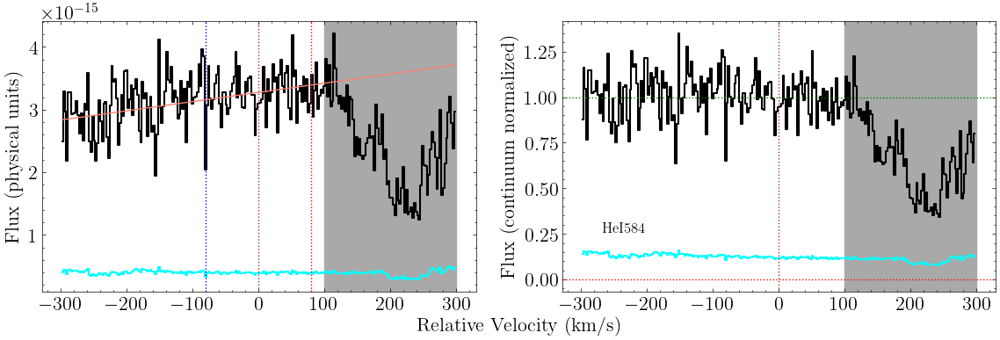

In [355]:
fig, ax = hei_584_fuv.plot_ion_transition_spec_cont()

In [356]:
hei_584_fuv.grab_ion_transition_lsf(lsf_fits_list)

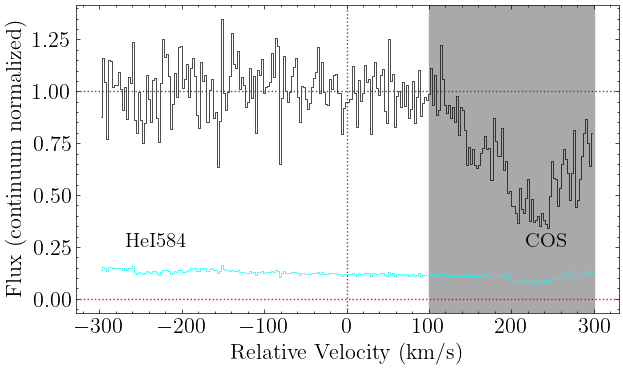

In [357]:
fig, ax = hei_584_fuv.plot_ion_transition_spec()

In [358]:
hei_584_fuv.get_upper_lim(20)

logN-1sig: 12.7
logN-2sig: 12.9
logN-3sig: 13.1


In [359]:
hei_584_fuv.get_upper_lim_data(20,0)

logN-1sig: 12.8
logN-2sig: 13.0
logN-3sig: 13.2


In [360]:
hei_584_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [361]:
hei_584_fuv.init_ion_transition(init_values = np.array([[13.4, 20, 0]]), 
                             lsf_convolve = True)

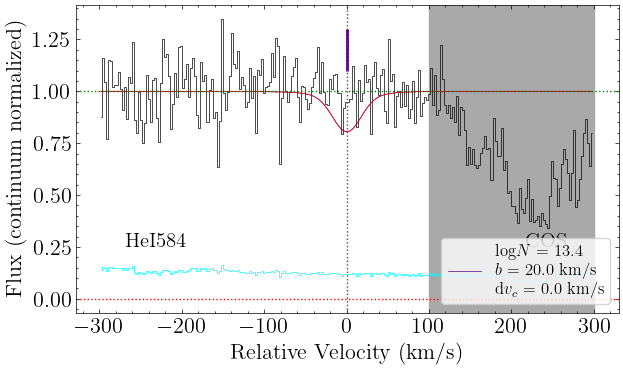

In [362]:
fig, ax = hei_584_fuv.plot_ion_transition_init_fit()

In [363]:
siiii_1206_stis.fit_ion_transition()

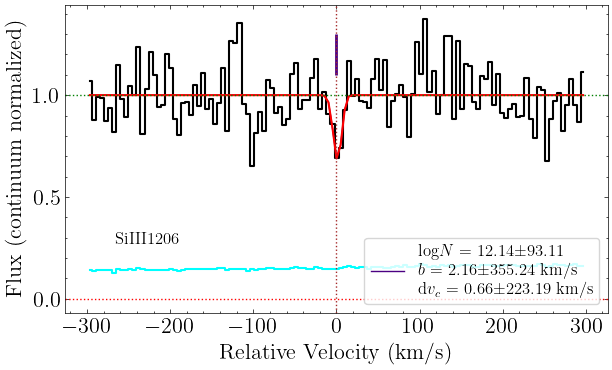

In [364]:
fig, ax = siiii_1206_stis.plot_ion_transition_best_fit()

## NIV ion
Now compile the NIV ion

In [365]:
niv = ion(z_sys, 'NIV', [niv_765_fuv])

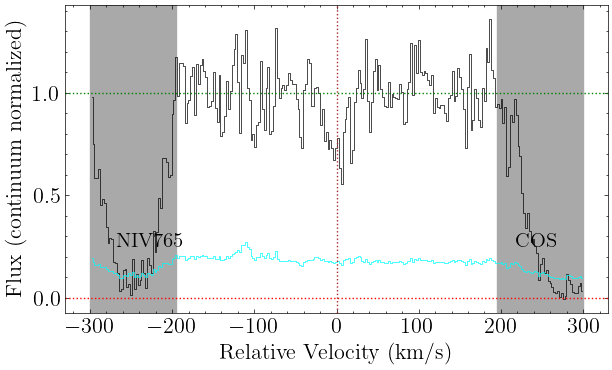

In [366]:
fig, axes = niv.plot_ion()

In [367]:
niv.init_ion([[[13.1, 18.3, 0]]])
#niv.init_ion(np.array([[13.03, 5, 0]]))

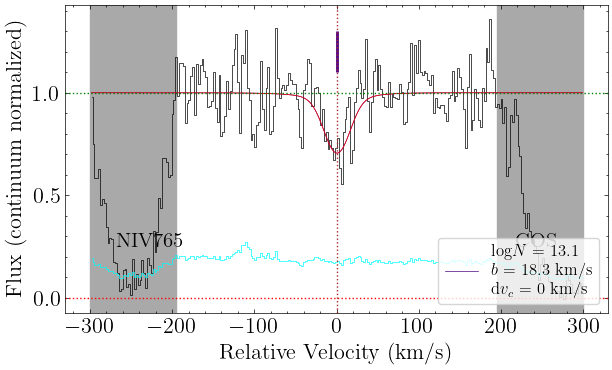

In [368]:
fig, axes = niv.plot_ion_init_fit()

In [369]:
niv.fit_ion(fix_params_list = ['it1c1_dv_c', 'it1c1_b'])

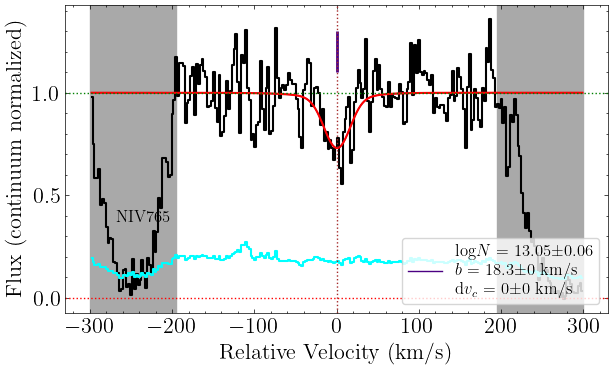

In [370]:
fig, axes = niv.plot_ion_best_fit()

In [371]:
#niv.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-8, n_walkers=100, n_steps=2500)
#niv.fit_ion_emcee(load=True, loaddir=rootdir)

In [372]:
#fig, axes = niv.plot_samples()

In [373]:
#niv.plot_corner()

# CII

## CII 903.9 (NUV)

In [374]:
cii_904_nuv = ion_transition('CII', 903.9, 'C', z_sys, 'COS NUV')

In [375]:
cii_904_nuv.grab_ion_transition_info()

In [376]:
cii_904_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300, -180]])

In [377]:
cii_904_nuv.cont_norm_flux(v_abs_range=[-100,100], degree=1)

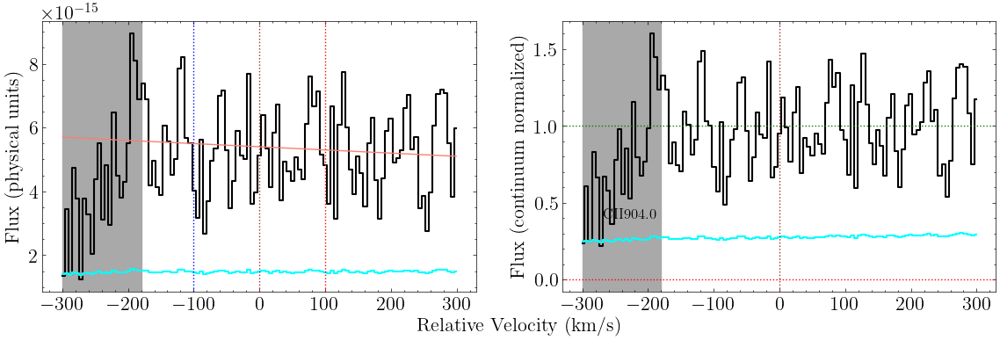

In [378]:
fig, ax = cii_904_nuv.plot_ion_transition_spec_cont()

In [379]:
cii_904_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [380]:
cii_904_nuv.get_upper_lim(20)

logN-1sig: 13.0
logN-2sig: 13.3
logN-3sig: 13.5


## CII 903.6 (NUV)

In [381]:
cii_903_nuv = ion_transition('CII', 903.6, 'C', z_sys, 'COS NUV')

In [382]:
cii_903_nuv.grab_ion_transition_info()

In [383]:
cii_903_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300, -90]])

In [384]:
cii_903_nuv.cont_norm_flux(v_abs_range=[-100,100], degree=1)

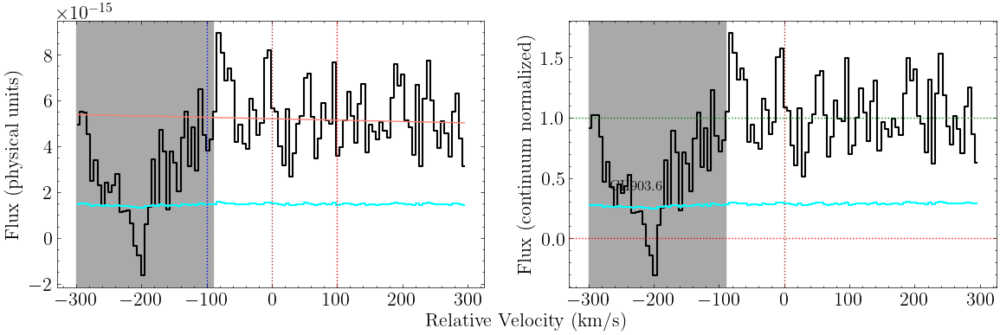

In [385]:
fig, ax = cii_903_nuv.plot_ion_transition_spec_cont()

In [386]:
cii_903_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [387]:
cii_903_nuv.get_upper_lim(20)

logN-1sig: 13.4
logN-2sig: 13.6
logN-3sig: 13.8


## CII 1036 (STIS)

In [388]:
cii_1036_stis = ion_transition('CII', 1036, 'C', z_sys, 'STIS')

In [389]:
cii_1036_stis.grab_ion_transition_info()

In [390]:
cii_1036_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-270],[250,300]])

In [391]:
cii_1036_stis.cont_norm_flux(v_abs_range=[-100,100], degree=1)

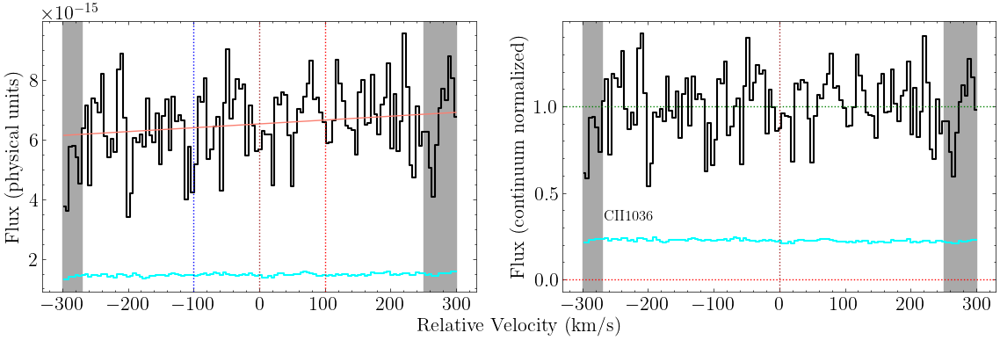

In [392]:
fig, ax = cii_1036_stis.plot_ion_transition_spec_cont()

In [393]:
cii_1036_stis.grab_ion_transition_lsf(lsf_fits_list)

In [394]:
cii_1036_stis.get_upper_lim(20)

logN-1sig: 13.2
logN-2sig: 13.4
logN-3sig: 13.6


# NII

## NII 1083 (STIS)

In [395]:
nii_1083_stis = ion_transition('NII', 1083, 'N', z_sys, 'STIS')

In [396]:
nii_1083_stis.grab_ion_transition_info()

In [397]:
nii_1083_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-270,-85]])

In [398]:
nii_1083_stis.cont_norm_flux(v_abs_range=[-100,100], degree=1)

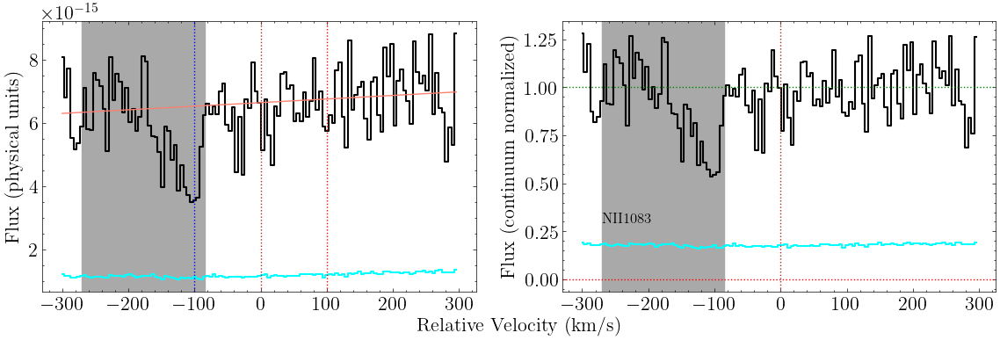

In [399]:
fig, ax = nii_1083_stis.plot_ion_transition_spec_cont()

In [400]:
nii_1083_stis.grab_ion_transition_lsf(lsf_fits_list)

In [401]:
nii_1083_stis.get_upper_lim(20)

logN-1sig: 13.1
logN-2sig: 13.3
logN-3sig: 13.5


# NV

## NV 1242 (STIS)

In [402]:
nv_1242_stis = ion_transition('NV', 1242, 'N', z_sys, 'STIS')

In [403]:
nv_1242_stis.grab_ion_transition_info()

In [404]:
nv_1242_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-280]])

In [405]:
nv_1242_stis.cont_norm_flux(v_abs_range=[-100,100], degree=1)

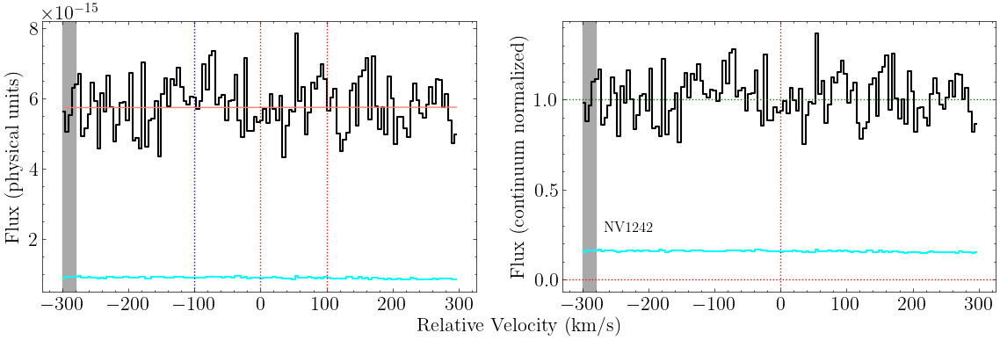

In [406]:
fig, ax = nv_1242_stis.plot_ion_transition_spec_cont()

In [407]:
nv_1242_stis.grab_ion_transition_lsf(lsf_fits_list)

In [408]:
nv_1242_stis.get_upper_lim(20)

logN-1sig: 13.1
logN-2sig: 13.3
logN-3sig: 13.5


# NeVI

## NeVI 558

In [409]:
nevi_558_fuv = ion_transition('NeVI', 558, 'Ne', z_sys, 'COS FUV')

In [410]:
nevi_558_fuv.grab_ion_transition_info()

In [411]:
nevi_558_fuv.grab_ion_transition_spec(spec_fits_list)

In [412]:
nevi_558_fuv.cont_norm_flux(v_abs_range=[-100,100], degree=1)

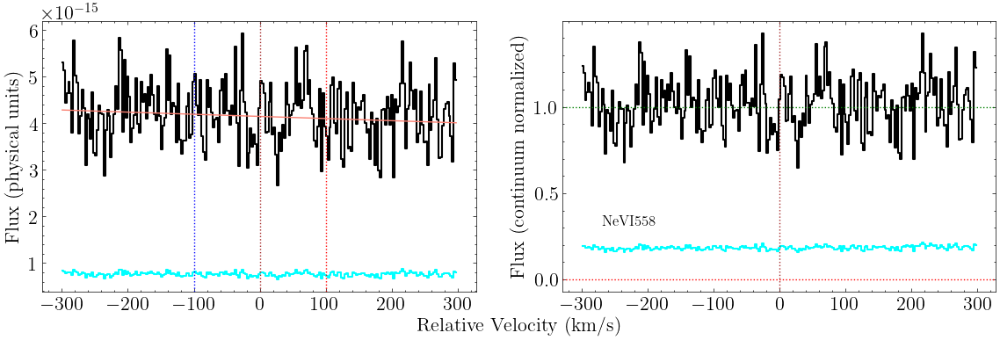

In [413]:
fig, ax = nevi_558_fuv.plot_ion_transition_spec_cont()

In [414]:
nevi_558_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [415]:
nevi_558_fuv.get_upper_lim(20,logN_max=20)

logN-1sig: 13.4
logN-2sig: 13.6
logN-3sig: 13.8


In [416]:
nevi_558_fuv.get_upper_lim_data(20,0, logN_max=20)

logN-1sig: 13.6
logN-2sig: 13.8
logN-3sig: 13.9


# NeVIII

## NeVIII 780

In [417]:
neviii_780_fuv = ion_transition('NeVIII', 780, 'Ne', z_sys, 'COS FUV')

In [418]:
neviii_780_fuv.grab_ion_transition_info()

In [419]:
neviii_780_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-200,-50]])

In [420]:
neviii_780_fuv.cont_norm_flux(v_abs_range=[-100,100], degree=1)

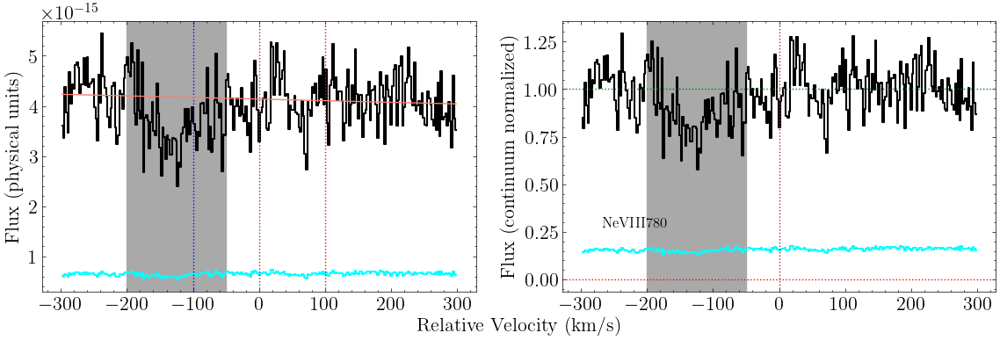

In [421]:
fig, ax = neviii_780_fuv.plot_ion_transition_spec_cont()

In [422]:
neviii_780_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [423]:
neviii_780_fuv.get_upper_lim(20, logN_max=20)

logN-1sig: 13.4
logN-2sig: 13.6
logN-3sig: 13.8


# MgII

## MgII 2796 (HIRES)

In [424]:
mgii_2796_hires = ion_transition('MgII', 2796, 'Mg', z_sys, 'HIRES')

In [425]:
mgii_2796_hires.grab_ion_transition_info()

In [426]:
mgii_2796_hires.grab_ion_transition_spec(spec_fits_list)

In [427]:
mgii_2796_hires.cont_norm_flux(v_abs_range=[-100,100], degree=1)

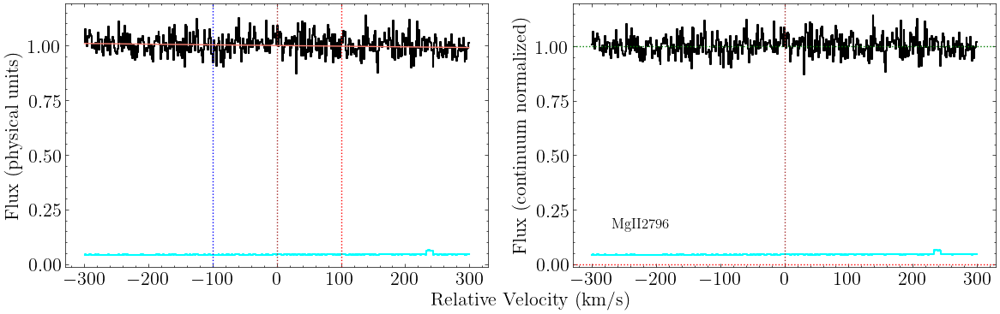

In [428]:
fig, ax = mgii_2796_hires.plot_ion_transition_spec_cont()

In [429]:
mgii_2796_hires.grab_ion_transition_lsf(lsf_fits_list)

In [430]:
mgii_2796_hires.get_upper_lim(20)

logN-1sig: 11.0
logN-2sig: 11.2
logN-3sig: 11.4


# MgX

## MgX 624

In [431]:
mgx_624_fuv = ion_transition('MgX', 624, 'Mg', z_sys, 'COS FUV')

In [432]:
mgx_624_fuv.grab_ion_transition_info()

In [433]:
mgx_624_fuv.grab_ion_transition_spec(spec_fits_list)

In [434]:
mgx_624_fuv.cont_norm_flux(v_abs_range=[-100,100], degree=1)

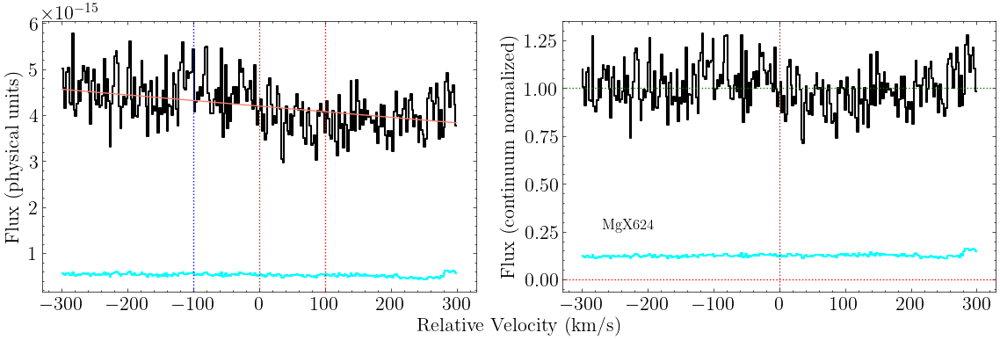

In [435]:
fig, ax = mgx_624_fuv.plot_ion_transition_spec_cont()

In [436]:
mgx_624_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [437]:
mgx_624_fuv.get_upper_lim(20)

logN-1sig: 13.5
logN-2sig: 13.7
logN-3sig: 13.9


# AlII

## AlII 1670 (HIRES)

In [438]:
alii_1670_hires = ion_transition('AlII', 1670, 'Al', z_sys, 'HIRES')

In [439]:
alii_1670_hires.grab_ion_transition_info()

In [440]:
alii_1670_hires.grab_ion_transition_spec(spec_fits_list, masks=[[-150, -120]])

In [441]:
alii_1670_hires.cont_norm_flux(v_abs_range=[-100,100], degree=1)

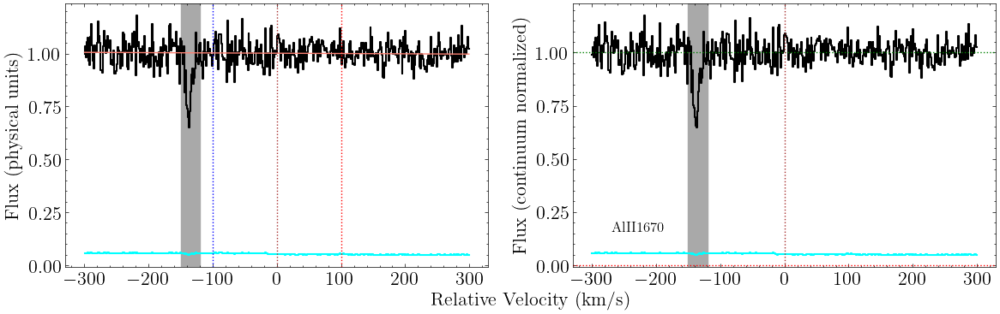

In [442]:
fig, ax = alii_1670_hires.plot_ion_transition_spec_cont()

In [443]:
alii_1670_hires.grab_ion_transition_lsf(lsf_fits_list)

In [444]:
alii_1670_hires.get_upper_lim(20)

logN-1sig: 10.8
logN-2sig: 11.1
logN-3sig: 11.2


# AlIII

## AlIII 1862 (HIRES)

In [445]:
aliii_1862_hires = ion_transition('AlIII', 1862, 'Al', z_sys, 'HIRES')

In [446]:
aliii_1862_hires.grab_ion_transition_info()

In [447]:
aliii_1862_hires.grab_ion_transition_spec(spec_fits_list)

In [448]:
aliii_1862_hires.cont_norm_flux(v_abs_range=[-100,100], degree=1)

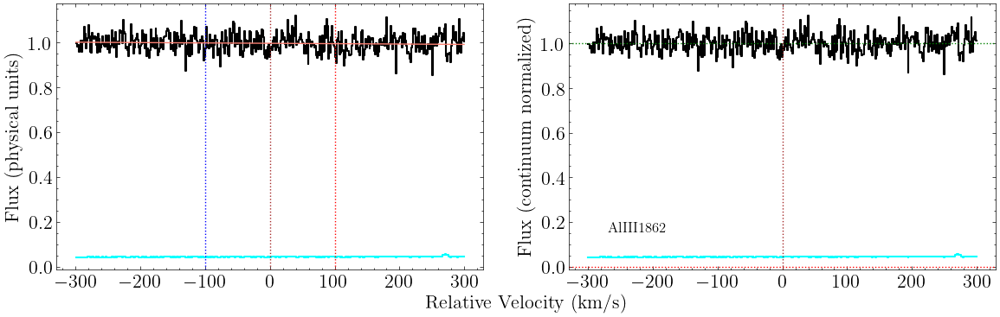

In [449]:
fig, ax = aliii_1862_hires.plot_ion_transition_spec_cont()

In [450]:
aliii_1862_hires.grab_ion_transition_lsf(lsf_fits_list)

In [451]:
aliii_1862_hires.get_upper_lim(20)

logN-1sig: 11.5
logN-2sig: 11.7
logN-3sig: 11.9


## AlIII 1854 (HIRES)

In [452]:
aliii_1854_hires = ion_transition('AlIII', 1854, 'Al', z_sys, 'HIRES')

In [453]:
aliii_1854_hires.grab_ion_transition_info()

In [454]:
aliii_1854_hires.grab_ion_transition_spec(spec_fits_list)

In [455]:
aliii_1854_hires.cont_norm_flux(v_abs_range=[-100,100], degree=1)

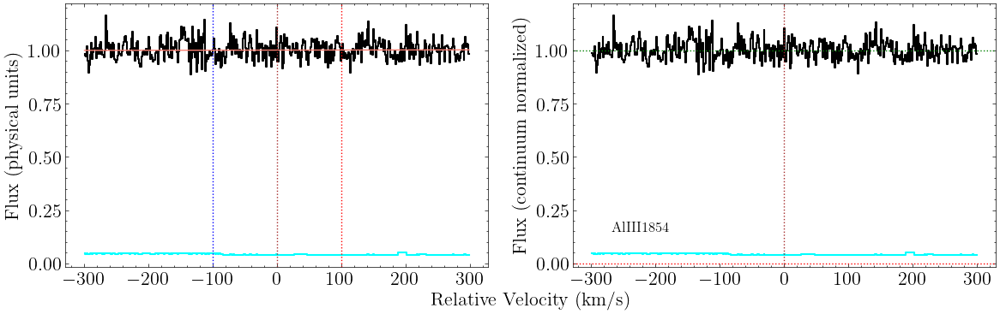

In [456]:
fig, ax = aliii_1854_hires.plot_ion_transition_spec_cont()

In [457]:
aliii_1854_hires.grab_ion_transition_lsf(lsf_fits_list)

In [458]:
aliii_1854_hires.get_upper_lim(20)

logN-1sig: 11.2
logN-2sig: 11.4
logN-3sig: 11.6


# SiII

## SiII 1260 (STIS)

In [459]:
siii_1260_stis = ion_transition('SiII', 1260, 'Si', z_sys, 'STIS')

In [460]:
siii_1260_stis.grab_ion_transition_info()

In [461]:
siii_1260_stis.grab_ion_transition_spec(spec_fits_list)

In [462]:
siii_1260_stis.cont_norm_flux(v_abs_range=[-100,100], degree=1)

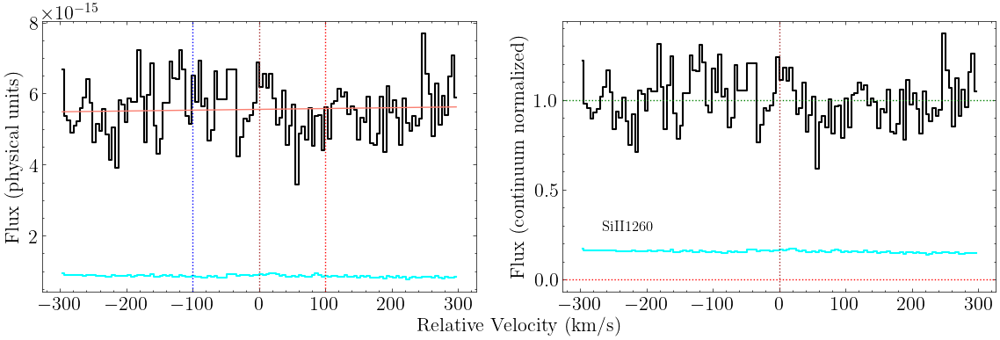

In [463]:
fig, ax = siii_1260_stis.plot_ion_transition_spec_cont()

In [464]:
siii_1260_stis.grab_ion_transition_lsf(lsf_fits_list)

In [465]:
siii_1260_stis.get_upper_lim(20)

logN-1sig: 11.9
logN-2sig: 12.2
logN-3sig: 12.3





## SiII 1193 (STIS)

In [466]:
siii_1193_stis = ion_transition('SiII', 1193, 'Si', z_sys, 'STIS')

In [467]:
siii_1193_stis.grab_ion_transition_info()

In [468]:
siii_1193_stis.grab_ion_transition_spec(spec_fits_list, masks=[[260,300]])

In [469]:
siii_1193_stis.cont_norm_flux(v_abs_range=[-100,100], degree=1)

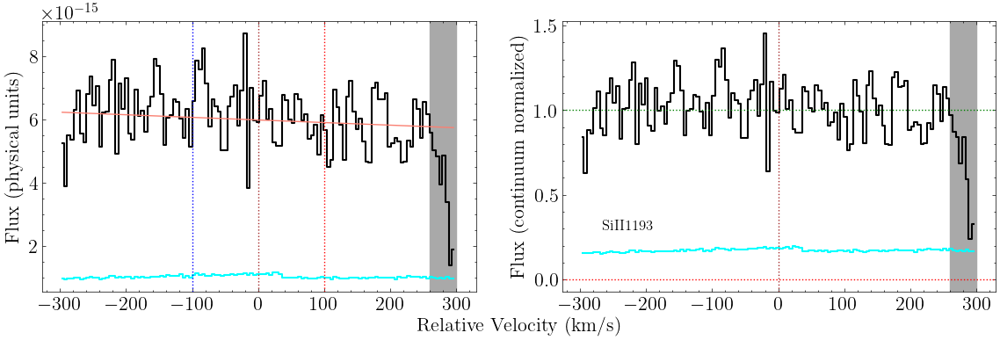

In [470]:
fig, ax = siii_1193_stis.plot_ion_transition_spec_cont()

In [471]:
siii_1193_stis.grab_ion_transition_lsf(lsf_fits_list)

In [472]:
siii_1193_stis.get_upper_lim(20)

logN-1sig: 12.3
logN-2sig: 12.6
logN-3sig: 12.7


## SiII 1190 (STIS)

In [473]:
siii_1190_stis = ion_transition('SiII', 1190, 'Si', z_sys, 'STIS')

In [474]:
siii_1190_stis.grab_ion_transition_info()

In [475]:
siii_1190_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-220]])

In [476]:
siii_1190_stis.cont_norm_flux(v_abs_range=[-100,100], degree=1)

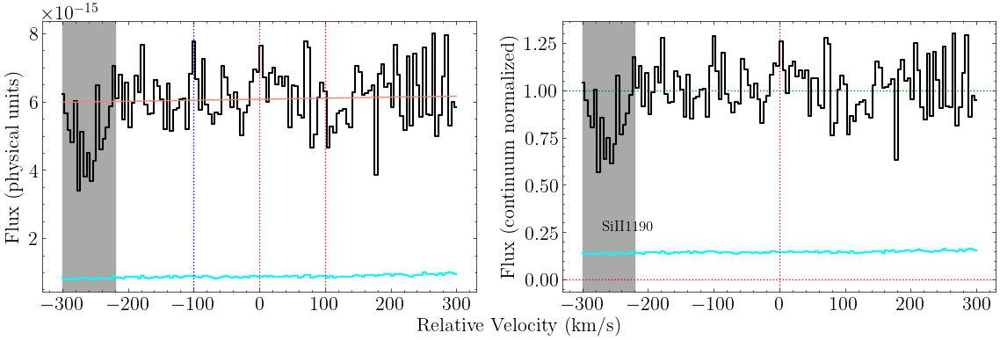

In [477]:
fig, ax = siii_1190_stis.plot_ion_transition_spec_cont()

In [478]:
siii_1190_stis.grab_ion_transition_lsf(lsf_fits_list)

In [479]:
siii_1190_stis.get_upper_lim(20)

logN-1sig: 12.5
logN-2sig: 12.8
logN-3sig: 12.9


# SIV

## SIV 748

In [480]:
siv_748_fuv = ion_transition('SIV', 748, 'S', z_sys, 'COS FUV')

In [481]:
siv_748_fuv.grab_ion_transition_info()

In [482]:
siv_748_fuv.grab_ion_transition_spec(spec_fits_list)

In [483]:
siv_748_fuv.cont_norm_flux(v_abs_range=[-100,100], degree=1)

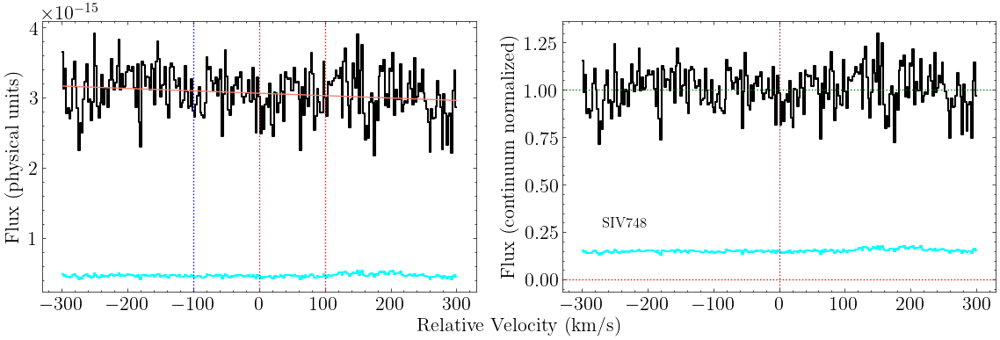

In [484]:
fig, ax = siv_748_fuv.plot_ion_transition_spec_cont()

In [485]:
siv_748_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [486]:
siv_748_fuv.get_upper_lim(20)

logN-1sig: 12.4
logN-2sig: 12.7
logN-3sig: 12.8


In [487]:
siv_748_fuv.get_upper_lim_data(20,0)

logN-1sig: 12.7
logN-2sig: 12.9
logN-3sig: 13.0


# SV

## SV 786

In [488]:
sv_786_fuv = ion_transition('SV', 786, 'S', z_sys, 'COS FUV')

In [489]:
sv_786_fuv.grab_ion_transition_info()

In [490]:
sv_786_fuv.grab_ion_transition_spec(spec_fits_list)

In [491]:
sv_786_fuv.cont_norm_flux(v_abs_range=[-100,100], degree=1)

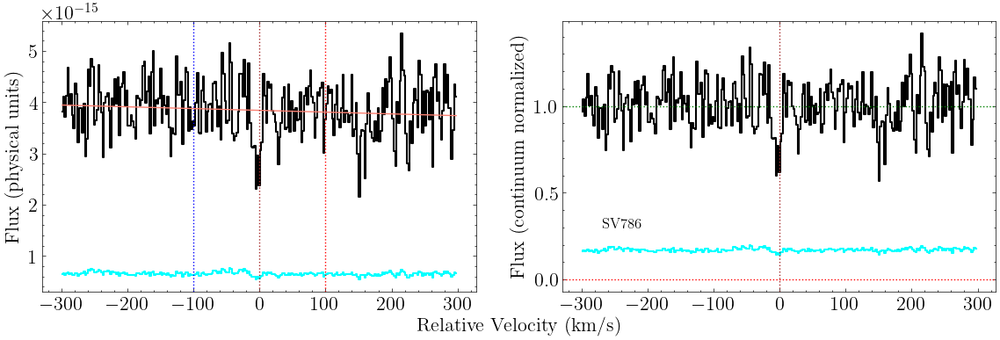

In [492]:
fig, ax = sv_786_fuv.plot_ion_transition_spec_cont()

In [493]:
sv_786_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [494]:
sv_786_fuv.get_upper_lim(20)

logN-1sig: 12.0
logN-2sig: 12.2
logN-3sig: 12.4


In [495]:
sv_786_fuv.get_upper_lim_data(20,0)

logN-1sig: 12.4
logN-2sig: 12.6
logN-3sig: 12.7


# SVI

## SVI 944 (NUV)

In [496]:
svi_944_nuv = ion_transition('SVI', 944, 'S', z_sys, 'COS NUV')

In [497]:
svi_944_nuv.grab_ion_transition_info()

In [498]:
svi_944_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-260]])

In [499]:
svi_944_nuv.cont_norm_flux(v_abs_range=[-100,100], degree=1)

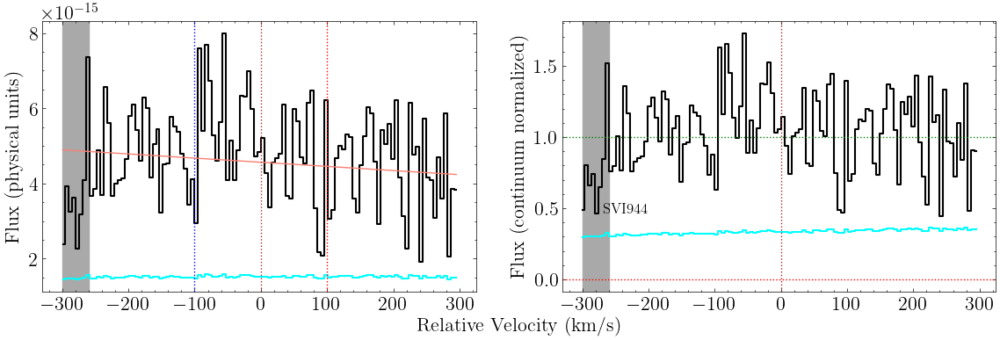

In [500]:
fig, ax = svi_944_nuv.plot_ion_transition_spec_cont()

In [501]:
svi_944_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [502]:
svi_944_nuv.get_upper_lim(20)

logN-1sig: 13.3
logN-2sig: 13.5
logN-3sig: 13.7


In [503]:
svi_944_nuv.get_upper_lim_data(20, 50, 0, 100)

logN-1sig: 13.2
logN-2sig: 13.4
logN-3sig: 13.7


# FeII

## FeII 2600 (HIRES)

In [504]:
feii_2600_hires = ion_transition('FeII', 2600, 'Fe', z_sys, 'HIRES')

In [505]:
feii_2600_hires.grab_ion_transition_info()

In [506]:
feii_2600_hires.grab_ion_transition_spec(spec_fits_list)

In [507]:
feii_2600_hires.cont_norm_flux(v_abs_range=[-100,100], degree=1)

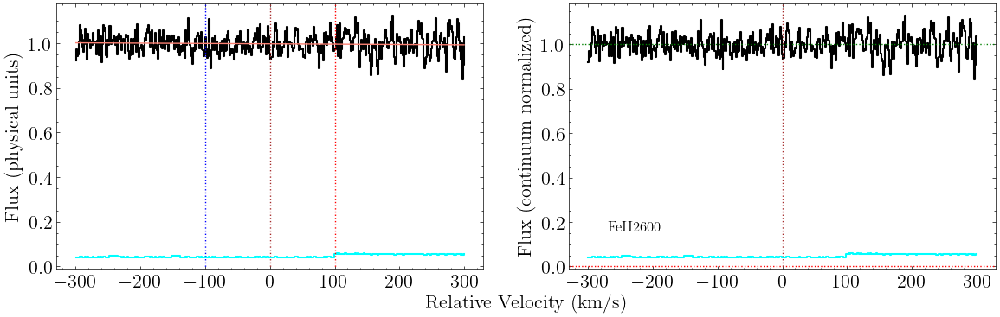

In [508]:
fig, ax = feii_2600_hires.plot_ion_transition_spec_cont()

In [509]:
feii_2600_hires.grab_ion_transition_lsf(lsf_fits_list)

In [510]:
feii_2600_hires.get_upper_lim(20)

logN-1sig: 11.4
logN-2sig: 11.6
logN-3sig: 11.8


## FeII 2382 (HIRES)

In [511]:
feii_2382_hires = ion_transition('FeII', 2382, 'Fe', z_sys, 'HIRES')

In [512]:
feii_2382_hires.grab_ion_transition_info()

In [513]:
feii_2382_hires.grab_ion_transition_spec(spec_fits_list)

In [514]:
feii_2382_hires.cont_norm_flux(v_abs_range=[-100,100], degree=1)

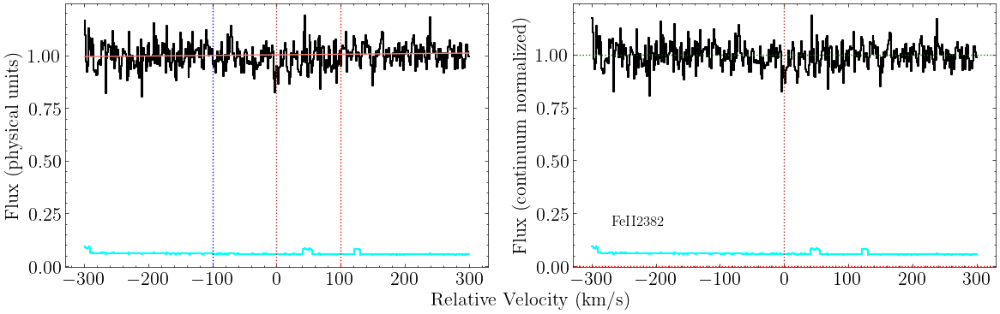

In [515]:
fig, ax = feii_2382_hires.plot_ion_transition_spec_cont()

In [516]:
feii_2382_hires.grab_ion_transition_lsf(lsf_fits_list)

In [517]:
feii_2382_hires.get_upper_lim(20)

logN-1sig: 11.5
logN-2sig: 11.7
logN-3sig: 11.8


## FeII 2344 (HIRES)

In [518]:
feii_2344_hires = ion_transition('FeII', 2344, 'Fe', z_sys, 'HIRES')

In [519]:
feii_2344_hires.grab_ion_transition_info()

In [520]:
feii_2344_hires.grab_ion_transition_spec(spec_fits_list)

In [521]:
feii_2344_hires.cont_norm_flux(v_abs_range=[-100,100], degree=1)

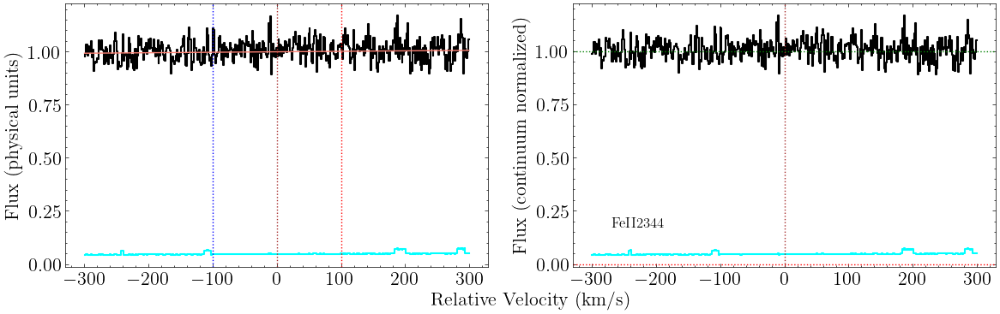

In [522]:
fig, ax = feii_2344_hires.plot_ion_transition_spec_cont()

In [523]:
feii_2344_hires.grab_ion_transition_lsf(lsf_fits_list)

In [524]:
feii_2344_hires.get_upper_lim(20)

logN-1sig: 11.8
logN-2sig: 12.0
logN-3sig: 12.2


# Paper plot

In [371]:
oiii_832_fuv.init_values

[[14.23, 25, 0]]

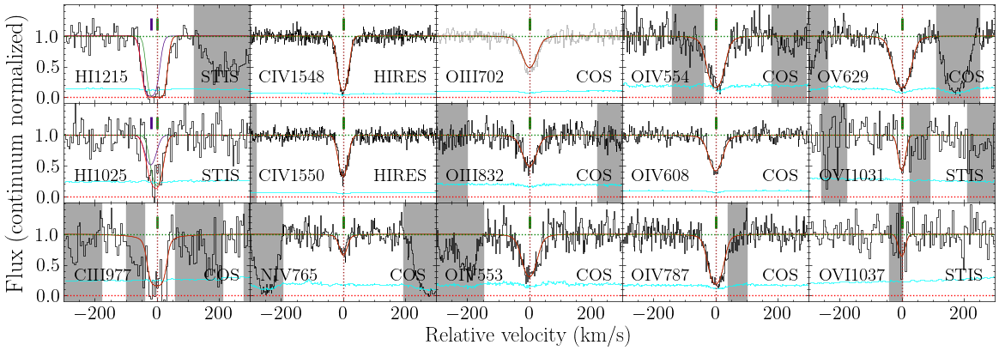

In [372]:
fig, axes = plt.subplots(3, 5, figsize=(5*2.8, 3*1.5), sharex=True, sharey=True)

#summary.plot_samples(fig=fig, axes=axes, n_cols=5)

hi_1215_stis.plot_ion_transition_init_fit(fig, axes[0,0], legend=False, label_axes=False, colors=['forestgreen','indigo'])
hi_1025_stis.plot_ion_transition_init_fit(fig, axes[1,0], legend=False, label_axes=False, colors=['forestgreen','indigo'])
ciii_977_nuv.plot_ion_transition_init_fit(fig, axes[2,0], legend=False, label_axes=False, colors=['forestgreen'])

civ_1548_hires.plot_ion_transition_init_fit(fig, axes[0,1], legend=False, label_axes=False, 
                                            colors=['green','green'], linestyles=['-','--'])
civ_1550_hires.plot_ion_transition_init_fit(fig, axes[1,1], legend=False, label_axes=False, 
                                            colors=['green','green'], linestyles=['-','--'])
niv_765_fuv.plot_ion_transition_init_fit(fig, axes[2,1], legend=False, label_axes=False, colors=['green'])


oiii_702_fuv.plot_ion_transition_init_fit(fig, axes[0,2], legend=False, label_axes=False, 
                                            colors=['green','green'], linestyles=['-','--'], flux_color='darkgrey')
oiii_832_fuv.plot_ion_transition_init_fit(fig, axes[1,2], legend=False, label_axes=False, 
                                            colors=['green','green'], linestyles=['-','--'])
oiv_553_fuv.plot_ion_transition_init_fit(fig, axes[2,2], legend=False, label_axes=False, colors=['green'])

oiv_554_fuv.plot_ion_transition_init_fit(fig, axes[0,3], legend=False, label_axes=False, colors=['green'])
oiv_608_fuv.plot_ion_transition_init_fit(fig, axes[1,3], legend=False, label_axes=False, colors=['green'])
oiv_787_fuv.plot_ion_transition_init_fit(fig, axes[2,3], legend=False, label_axes=False, colors=['green'])

ov_629_fuv.plot_ion_transition_init_fit(fig, axes[0,4], legend=False, label_axes=False, colors=['green'])
ovi_1031_stis.plot_ion_transition_init_fit(fig, axes[1,4], legend=False, label_axes=False, colors=['green'])
ovi_1037_stis.plot_ion_transition_init_fit(fig, axes[2,4], legend=False, label_axes=False, colors=['green'])

axes[0,0].set_ylim(-0.1,1.52)
axes[0,0].set_xlim(-299.9,299.9)
axes[0,0].set_yticks([0,0.5,1])

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

plt.subplots_adjust(wspace=0, hspace=0)

ax_label.set_xlabel('Relative velocity (km/s)', labelpad=20, fontsize=18)
ax_label.set_ylabel('Flux (continuum normalized)', labelpad=30, fontsize=20)

#ax_label.set_title('Two-phase PIE model for a warm-hot absorber', y=1.07, fontsize=19)

plt.savefig(rootdir+'Ions/z={}/z={}_vp_alt.pdf'.format(str(z_sys), str(z_sys).replace('.', '_')), dpi=300)

Text(0, 0.5, 'Flux (continuum normalized)')

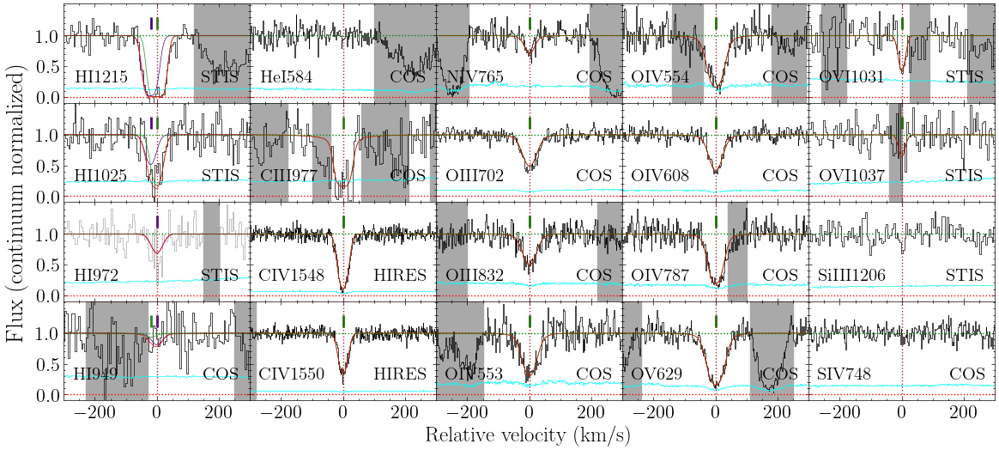

In [527]:
fig, axes = plt.subplots(4, 5, figsize=(5*2.8, 4*1.5), sharex=True, sharey=True)

#summary.plot_samples(fig=fig, axes=axes, n_cols=5)

hi_1215_stis.plot_ion_transition_init_fit(fig, axes[0,0], legend=False, label_axes=False, colors=['forestgreen','indigo'])
hi_1025_stis.plot_ion_transition_init_fit(fig, axes[1,0], legend=False, label_axes=False, colors=['forestgreen','indigo'])
hi_972_stis.plot_ion_transition_init_fit(fig, axes[2,0], legend=False, label_axes=False, flux_color='darkgrey')
hi_949_nuv.plot_ion_transition_init_fit(fig, axes[3,0], legend=False, label_axes=False)

hei_584_fuv.plot_ion_transition_spec(fig, axes[0,1], label_axes=False)
ciii_977_nuv.plot_ion_transition_init_fit(fig, axes[1,1], legend=False, label_axes=False, colors=['forestgreen'])
civ_1548_hires.plot_ion_transition_init_fit(fig, axes[2,1], legend=False, label_axes=False, 
                                            colors=['green','green'], linestyles=['-','--'])
civ_1550_hires.plot_ion_transition_init_fit(fig, axes[3,1], legend=False, label_axes=False, 
                                            colors=['green','green'], linestyles=['-','--'])


niv_765_fuv.plot_ion_transition_init_fit(fig, axes[0,2], legend=False, label_axes=False, colors=['green'])
oiii_702_fuv.plot_ion_transition_init_fit(fig, axes[1,2], legend=False, label_axes=False, 
                                            colors=['green','green'], linestyles=['-','--'])

oiii_832_fuv.plot_ion_transition_init_fit(fig, axes[2,2], legend=False, label_axes=False, 
                                            colors=['green','green'], linestyles=['-','--'])
oiv_553_fuv.plot_ion_transition_init_fit(fig, axes[3,2], legend=False, label_axes=False, colors=['green'])

oiv_554_fuv.plot_ion_transition_init_fit(fig, axes[0,3], legend=False, label_axes=False, colors=['green'])
oiv_608_fuv.plot_ion_transition_init_fit(fig, axes[1,3], legend=False, label_axes=False, colors=['green'])
oiv_787_fuv.plot_ion_transition_init_fit(fig, axes[2,3], legend=False, label_axes=False, colors=['green'])
ov_629_fuv.plot_ion_transition_init_fit(fig, axes[3,3], legend=False, label_axes=False, colors=['green'])

ovi_1031_stis.plot_ion_transition_init_fit(fig, axes[0,4], legend=False, label_axes=False, colors=['green'])
ovi_1037_stis.plot_ion_transition_init_fit(fig, axes[1,4], legend=False, label_axes=False, colors=['green'])
siiii_1206_stis.plot_ion_transition_spec(fig, axes[2,4], label_axes=False)
siv_748_fuv.plot_ion_transition_spec(fig, axes[3,4], label_axes=False)


#xmin, xmax = hi_1215_stis.v[0],hi_1215_stis.v[-1]

#oiii_702_fuv.plot_ion_transition_init_fit(fig, axes[0,1], legend=False, label_axes=False)
#oiii_832_fuv.plot_ion_transition_init_fit(fig, axes[1,1], legend=False, label_axes=False)
#oiv_608_fuv.plot_ion_transition_init_fit(fig, axes[1,2], legend=False, label_axes=False)
#oiv_787_fuv.plot_ion_transition_init_fit(fig, axes[2,2], legend=False, label_axes=False)


#ov_629_fuv.plot_ion_transition_init_fit(fig, axes[0,3], legend=False, label_axes=False)
#ovi_1031_stis.plot_ion_transition_init_fit(fig, axes[1,3], legend=False, label_axes=False)
#ovi_1037_stis.plot_ion_transition_init_fit(fig, axes[2,3], legend=False, label_axes=False)

axes[0,0].set_ylim(-0.1,1.52)
axes[0,0].set_xlim(-299.9,299.9)
axes[0,0].set_yticks([0,0.5,1])

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

plt.subplots_adjust(wspace=0, hspace=0)

ax_label.set_xlabel('Relative velocity (km/s)', labelpad=20, fontsize=18)
ax_label.set_ylabel('Flux (continuum normalized)', labelpad=30, fontsize=20)

#ax_label.set_title('Two-phase PIE model for a warm-hot absorber', y=1.07, fontsize=19)

#plt.savefig(rootdir+'Ions/z={}/z={}_vp_alt.pdf'.format(str(z_sys), str(z_sys).replace('.', '_')), dpi=300)

# HI + CIV + OIII

In [323]:
hi_civ_oiii = ion_suite(z_sys, 'HI+CIV+OIII', [hi, civ, oiii])

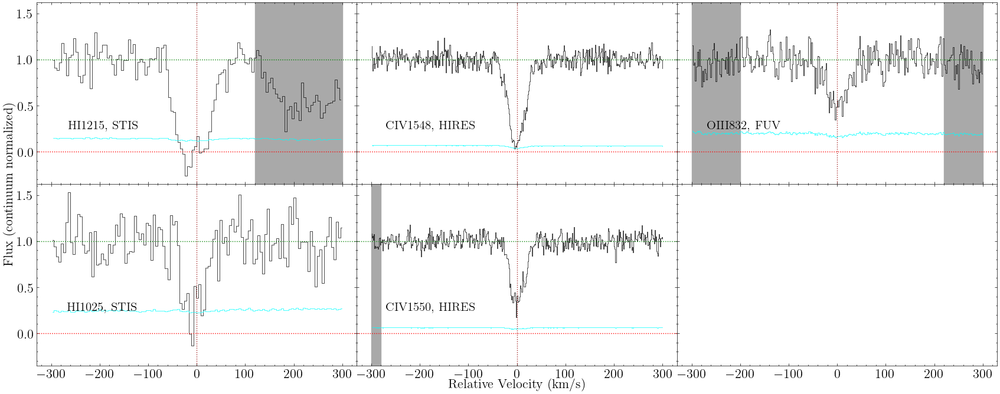

In [324]:
fig, axes = hi_civ_oiii.plot_ion_suite(n_cols=3)

In [325]:
hi_civ_oiii.init_ion_suite([
                                [[13.7,4.3,14,10],[14.6,4.3,14,-5]], # HI
                                [[13.7,4.3,14,10],[14.6,4.3,14,-5]],
                                [[13.5,4.3,14,10],[13.7,4.3,14,-5]], # CIV
                                [[13.5,4.3,14,10],[13.7,4.3,14,-5]], # CIV
                                [[13.8,4.3,14,10],[14.0,4.3,14,-5]], # OIII
                                [[13.8,4.3,14,10],[14.0,4.3,14,-5]],
                                   ])

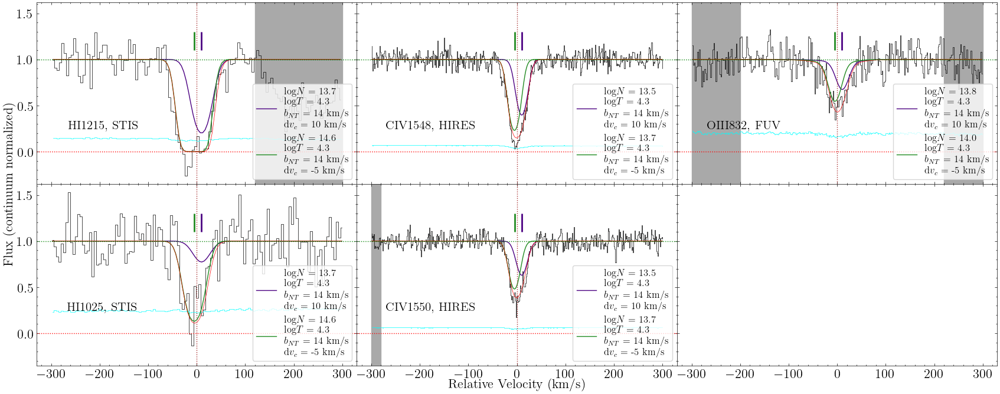

In [326]:
fig, axes = hi_civ_oiii.plot_ion_suite_init_fit(n_cols=3)

In [327]:
hi_civ_oiii.fit_ion_suite(tie_params_list=[
    ['it1c1_logN', 'it2c1_logN'], # Tie logN for HI c1
    ['it1c2_logN', 'it2c2_logN'], # Tie logN for HI c2
    ['it3c1_logN', 'it4c1_logN'], # Tie logN for CIV c1
    ['it3c2_logN', 'it4c2_logN'], # Tie logN for CIV c2
    ['it5c1_logN', 'it6c1_logN'], # Tie logN for OIII c1
    ['it5c2_logN', 'it6c2_logN'], # Tie logN for OIII c2
    
    ['it1c1_logT', 'it2c1_logT'], # Tie b for HI c1
    ['it1c1_logT', 'it3c1_logT'],
    ['it1c1_logT', 'it4c1_logT'],
    ['it1c1_logT', 'it5c1_logT'],
    ['it1c1_logT', 'it6c1_logT'],
    ['it1c2_logT', 'it2c2_logT'], # Tie b for HI c2
    ['it1c2_logT', 'it3c2_logT'],
    ['it1c2_logT', 'it4c2_logT'],
    ['it1c2_logT', 'it5c2_logT'],
    ['it1c2_logT', 'it6c2_logT'],
    ['it1c1_b_NT', 'it2c1_b_NT'], # Tie b for HI c1
    ['it1c1_b_NT', 'it3c1_b_NT'],
    ['it1c1_b_NT', 'it4c1_b_NT'],
    ['it1c1_b_NT', 'it5c1_b_NT'],
    ['it1c1_b_NT', 'it6c1_b_NT'],
    ['it1c2_b_NT', 'it2c2_b_NT'], # Tie b for HI c2
    ['it1c2_b_NT', 'it3c2_b_NT'],
    ['it1c2_b_NT', 'it4c2_b_NT'],
    ['it1c2_b_NT', 'it5c2_b_NT'],
    ['it1c2_b_NT', 'it6c2_b_NT'],
    ['it1c1_dv_c', 'it2c1_dv_c'], # Tie all dv_c together, c1
    ['it1c1_dv_c', 'it3c1_dv_c'],
    ['it1c1_dv_c', 'it4c1_dv_c'],
    ['it1c1_dv_c', 'it5c1_dv_c'],
    ['it1c1_dv_c', 'it6c1_dv_c'],
    ['it1c2_dv_c', 'it2c2_dv_c'], # Tie all dv_c together, c2
    ['it1c2_dv_c', 'it3c2_dv_c'],
    ['it1c2_dv_c', 'it4c2_dv_c'],
    ['it1c2_dv_c', 'it5c2_dv_c'],
    ['it1c2_dv_c', 'it6c2_dv_c'],

],
    #fix_params_list = ['it1c1_b_NT', 'it1c2_b_NT'],
    lower_bounds_dict = {'it1c1_logN': 13.6,
                         'it1c2_logN': 13.6,
                         }, 
    #upper_bounds_dict = {'it1c1_logT': 4.3, 
    #                     'it1c2_logT': 4.3,
    #                    },
    exclude_models=['it3c1_logN > it3c2_logN', # Thermal limit on HI width
    #                'it1c2_b > it3c2_b 3.46',
    #                'it1c1_b < it3c1_b 3.4',
    #                'it1c2_b < it3c2_b 3.4',
    #                'it1c1_b < it1c2_b',
                   ]
                                              )

KeyError: 'it6c1_logN'

In [ ]:
fig, axes = hi_civ_oiii.plot_ion_suite_best_fit(n_cols=3)

# HI + CIV + OIII + OIV

In [ ]:
hi_civ_oiii_oiv = ion_suite(z_sys, 'HI+CIV+OIII+OIV', [hi, civ, oiii, oiv])

In [ ]:
fig, axes = hi_civ_oiii_oiv.plot_ion_suite(n_cols=3)

In [ ]:
hi_civ_oiii_oiv.init_ion_suite([
                                [[13.7,4.3,14,10],[14.6,4.3,14,-5]], # HI
                                [[13.7,4.3,14,10],[14.6,4.3,14,-5]],
                                [[13.5,4.3,14,10],[13.7,4.3,14,-5]], # CIV
                                [[13.5,4.3,14,10],[13.7,4.3,14,-5]], # CIV
                                [[13.8,4.3,14,10],[14.0,4.3,14,-5]], # OIII
                                [[13.8,4.3,14,10],[14.0,4.3,14,-5]],
                                [[13.8,4.3,14,10],[14.0,4.3,14,-5]], # OIV
                                [[13.8,4.3,14,10],[14.0,4.3,14,-5]],
                                [[13.8,4.3,14,10],[14.0,4.3,14,-5]],
                                [[13.8,4.3,14,10],[14.0,4.3,14,-5]],
                                   ])

In [ ]:
fig, axes = hi_civ_oiii_oiv.plot_ion_suite_init_fit(n_cols=3)

In [ ]:
hi_civ_oiii_oiv.fit_ion_suite(tie_params_list=[
    ['it1c1_logN', 'it2c1_logN'], # Tie logN for HI c1
    ['it1c2_logN', 'it2c2_logN'], # Tie logN for HI c2
    ['it3c1_logN', 'it4c1_logN'], # Tie logN for CIV c1
    ['it3c2_logN', 'it4c2_logN'], # Tie logN for CIV c2
    ['it5c1_logN', 'it6c1_logN'], # Tie logN for OIII c1
    ['it5c2_logN', 'it6c2_logN'], # Tie logN for OIII c2
    ['it7c1_logN', 'it8c1_logN'], # Tie logN for OIV c1
    ['it7c1_logN', 'it9c1_logN'],
    ['it7c1_logN', 'it10c1_logN'],
    ['it7c2_logN', 'it8c2_logN'], # Tie logN for OIV c2
    ['it7c2_logN', 'it9c2_logN'],
    ['it7c2_logN', 'it10c2_logN'],
    ['it1c1_logT', 'it2c1_logT'], # Tie b for HI c1
    ['it1c1_logT', 'it3c1_logT'],
    ['it1c1_logT', 'it4c1_logT'],
    ['it1c1_logT', 'it5c1_logT'],
    ['it1c1_logT', 'it6c1_logT'],
    ['it1c1_logT', 'it7c1_logT'],
    ['it1c1_logT', 'it8c1_logT'],
    ['it1c1_logT', 'it9c1_logT'],
    ['it1c1_logT', 'it10c1_logT'],
    ['it1c2_logT', 'it2c2_logT'], # Tie b for HI c2
    ['it1c2_logT', 'it3c2_logT'],
    ['it1c2_logT', 'it4c2_logT'],
    ['it1c2_logT', 'it5c2_logT'],
    ['it1c2_logT', 'it6c2_logT'],
    ['it1c2_logT', 'it7c2_logT'],
    ['it1c2_logT', 'it8c2_logT'],
    ['it1c2_logT', 'it9c2_logT'],
    ['it1c2_logT', 'it10c2_logT'],
    ['it1c1_b_NT', 'it2c1_b_NT'], # Tie b for HI c1
    ['it1c1_b_NT', 'it3c1_b_NT'],
    ['it1c1_b_NT', 'it4c1_b_NT'],
    ['it1c1_b_NT', 'it5c1_b_NT'],
    ['it1c1_b_NT', 'it6c1_b_NT'],
    ['it1c1_b_NT', 'it7c1_b_NT'],
    ['it1c1_b_NT', 'it8c1_b_NT'],
    ['it1c1_b_NT', 'it9c1_b_NT'],
    ['it1c1_b_NT', 'it10c1_b_NT'],
    ['it1c2_b_NT', 'it2c2_b_NT'], # Tie b for HI c2
    ['it1c2_b_NT', 'it3c2_b_NT'],
    ['it1c2_b_NT', 'it4c2_b_NT'],
    ['it1c2_b_NT', 'it5c2_b_NT'],
    ['it1c2_b_NT', 'it6c2_b_NT'],
    ['it1c2_b_NT', 'it7c2_b_NT'],
    ['it1c2_b_NT', 'it8c2_b_NT'],
    ['it1c2_b_NT', 'it9c2_b_NT'],
    ['it1c2_b_NT', 'it10c2_b_NT'],
    ['it1c1_dv_c', 'it2c1_dv_c'], # Tie all dv_c together, c1
    ['it1c1_dv_c', 'it3c1_dv_c'],
    ['it1c1_dv_c', 'it4c1_dv_c'],
    ['it1c1_dv_c', 'it5c1_dv_c'],
    ['it1c1_dv_c', 'it6c1_dv_c'],
    ['it1c1_dv_c', 'it7c1_dv_c'],
    ['it1c1_dv_c', 'it8c1_dv_c'],
    ['it1c1_dv_c', 'it9c1_dv_c'],
    ['it1c1_dv_c', 'it10c1_dv_c'],
    ['it1c2_dv_c', 'it2c2_dv_c'], # Tie all dv_c together, c2
    ['it1c2_dv_c', 'it3c2_dv_c'],
    ['it1c2_dv_c', 'it4c2_dv_c'],
    ['it1c2_dv_c', 'it5c2_dv_c'],
    ['it1c2_dv_c', 'it6c2_dv_c'],
    ['it1c2_dv_c', 'it7c2_dv_c'],
    ['it1c2_dv_c', 'it8c2_dv_c'],
    ['it1c2_dv_c', 'it9c2_dv_c'],
    ['it1c2_dv_c', 'it10c2_dv_c'],
],
    #fix_params_list = ['it1c1_b_NT', 'it1c2_b_NT'],
    lower_bounds_dict = {'it1c1_logN': 13.6,
                         'it1c2_logN': 13.6,
                         }, 
    #upper_bounds_dict = {'it1c1_logT': 4.3, 
    #                     'it1c2_logT': 4.3,
    #                    },
    exclude_models=['it3c1_logN > it3c2_logN', # Thermal limit on HI width
    #                'it1c2_b > it3c2_b 3.46',
    #                'it1c1_b < it3c1_b 3.4',
    #                'it1c2_b < it3c2_b 3.4',
    #                'it1c1_b < it1c2_b',
                   ]
                                              )

In [ ]:
fig, axes = hi_civ_oiii_oiv.plot_ion_suite_best_fit(n_cols=3)

# HI + CIV + OIII + OIV + OV

In [ ]:
hi_civ_oiii_oiv_ov = ion_suite(z_sys, 'HI+CIV+OIII+OIV+OV', [hi, civ, oiii, oiv, ov])

In [ ]:
fig, axes = hi_civ_oiii_oiv_ov.plot_ion_suite(n_cols=3)

In [ ]:
hi_civ_oiii_oiv_ov.init_ion_suite([
                                [[14.6,4.3,14,-5],[13.7,4.5,14,10]], # HI
                                [[14.6,4.3,14,-5],[13.7,4.5,14,10]],
                                [[13.7,4.3,14,-5],[13.5,4.5,14,10]], # CIV
                                [[13.7,4.3,14,-5],[13.5,4.5,14,10]], # CIV
                                [[14.0,4.3,14,-5],[13.8,4.5,14,10]], # OIII
                                [[14.0,4.3,14,-5],[13.8,4.5,14,10]],
                                [[14.0,4.3,14,-5],[13.8,4.5,14,10]], # OIV
                                [[14.0,4.3,14,-5],[13.8,4.5,14,10]],
                                [[14.0,4.3,14,-5],[13.8,4.5,14,10]],
                                [[14.0,4.3,14,-5],[13.8,4.5,14,10]],
                                [[14.0,4.3,14,-5],[13.8,4.5,14,10]], # OV
                                   ])

In [ ]:
fig, axes = hi_civ_oiii_oiv_ov.plot_ion_suite_init_fit(n_cols=3)

In [ ]:
hi_civ_oiii_oiv_ov.fit_ion_suite(tie_params_list=[
    ['it1c1_logN', 'it2c1_logN'], # Tie logN for HI c1
    ['it1c2_logN', 'it2c2_logN'], # Tie logN for HI c2
    ['it3c1_logN', 'it4c1_logN'], # Tie logN for CIV c1
    ['it3c2_logN', 'it4c2_logN'], # Tie logN for CIV c2
    ['it5c1_logN', 'it6c1_logN'], # Tie logN for OIII c1
    ['it5c2_logN', 'it6c2_logN'], # Tie logN for OIII c2
    ['it7c1_logN', 'it8c1_logN'], # Tie logN for OIV c1
    ['it7c1_logN', 'it9c1_logN'],
    ['it7c1_logN', 'it10c1_logN'],
    ['it7c2_logN', 'it8c2_logN'], # Tie logN for OIV c2
    ['it7c2_logN', 'it9c2_logN'],
    ['it7c2_logN', 'it10c2_logN'],
    ['it1c1_logT', 'it2c1_logT'], # Tie b for HI c1
    ['it1c1_logT', 'it3c1_logT'],
    ['it1c1_logT', 'it4c1_logT'],
    ['it1c1_logT', 'it5c1_logT'],
    ['it1c1_logT', 'it6c1_logT'],
    ['it1c1_logT', 'it7c1_logT'],
    ['it1c1_logT', 'it8c1_logT'],
    ['it1c1_logT', 'it9c1_logT'],
    ['it1c1_logT', 'it10c1_logT'],
    ['it1c1_logT', 'it11c1_logT'],
    ['it1c2_logT', 'it2c2_logT'], # Tie b for HI c2
    ['it1c2_logT', 'it3c2_logT'],
    ['it1c2_logT', 'it4c2_logT'],
    ['it1c2_logT', 'it5c2_logT'],
    ['it1c2_logT', 'it6c2_logT'],
    ['it1c2_logT', 'it7c2_logT'],
    ['it1c2_logT', 'it8c2_logT'],
    ['it1c2_logT', 'it9c2_logT'],
    ['it1c2_logT', 'it10c2_logT'],
    ['it1c2_logT', 'it11c2_logT'],
    ['it1c1_b_NT', 'it2c1_b_NT'], # Tie b for HI c1
    ['it1c1_b_NT', 'it3c1_b_NT'],
    ['it1c1_b_NT', 'it4c1_b_NT'],
    ['it1c1_b_NT', 'it5c1_b_NT'],
    ['it1c1_b_NT', 'it6c1_b_NT'],
    ['it1c1_b_NT', 'it7c1_b_NT'],
    ['it1c1_b_NT', 'it8c1_b_NT'],
    ['it1c1_b_NT', 'it9c1_b_NT'],
    ['it1c1_b_NT', 'it10c1_b_NT'],
    ['it1c1_b_NT', 'it11c1_b_NT'],
    ['it1c2_b_NT', 'it2c2_b_NT'], # Tie b for HI c2
    ['it1c2_b_NT', 'it3c2_b_NT'],
    ['it1c2_b_NT', 'it4c2_b_NT'],
    ['it1c2_b_NT', 'it5c2_b_NT'],
    ['it1c2_b_NT', 'it6c2_b_NT'],
    ['it1c2_b_NT', 'it7c2_b_NT'],
    ['it1c2_b_NT', 'it8c2_b_NT'],
    ['it1c2_b_NT', 'it9c2_b_NT'],
    ['it1c2_b_NT', 'it10c2_b_NT'],
    ['it1c2_b_NT', 'it11c2_b_NT'],
    ['it1c1_dv_c', 'it2c1_dv_c'], # Tie all dv_c together, c1
    ['it1c1_dv_c', 'it3c1_dv_c'],
    ['it1c1_dv_c', 'it4c1_dv_c'],
    ['it1c1_dv_c', 'it5c1_dv_c'],
    ['it1c1_dv_c', 'it6c1_dv_c'],
    ['it1c1_dv_c', 'it7c1_dv_c'],
    ['it1c1_dv_c', 'it8c1_dv_c'],
    ['it1c1_dv_c', 'it9c1_dv_c'],
    ['it1c1_dv_c', 'it10c1_dv_c'],
    ['it1c1_dv_c', 'it11c1_dv_c'],
    ['it1c2_dv_c', 'it2c2_dv_c'], # Tie all dv_c together, c2
    ['it1c2_dv_c', 'it3c2_dv_c'],
    ['it1c2_dv_c', 'it4c2_dv_c'],
    ['it1c2_dv_c', 'it5c2_dv_c'],
    ['it1c2_dv_c', 'it6c2_dv_c'],
    ['it1c2_dv_c', 'it7c2_dv_c'],
    ['it1c2_dv_c', 'it8c2_dv_c'],
    ['it1c2_dv_c', 'it9c2_dv_c'],
    ['it1c2_dv_c', 'it10c2_dv_c'],
    ['it1c2_dv_c', 'it11c2_dv_c'],
],
    #fix_params_list = ['it1c1_b_NT', 'it1c2_b_NT'],
    lower_bounds_dict = {'it1c1_logN': 13.6,
                         'it1c2_logN': 13.6,
                         }, 
    #upper_bounds_dict = {'it1c1_logT': 4.3, 
    #                     'it1c2_logT': 4.3,
    #                    },
    exclude_models=[#'it3c1_logN > it3c2_logN',
                    'it1c1_logT > it1c2_logT',
        #'it3c1_logN > it5c1_logN', 
                    #'it3c2_logN > it5c2_logN',
    #                'it1c2_b > it3c2_b 3.46',
    #                'it1c1_b < it3c1_b 3.4',
    #                'it1c2_b < it3c2_b 3.4',
    #                'it1c1_b < it1c2_b',
                   ]
                                              )

In [ ]:
fig, axes = hi_civ_oiii_oiv_ov.plot_ion_suite_best_fit(n_cols=3)

In [ ]:
#hi_civ_oiii_oiv_ov.fit_ion_suite_emcee(loaddir=rootdir, n_walkers=200, n_steps=2000, scale_covar=1e-16)
#hi_civ_oiii_oiv_ov.fit_ion_suite_emcee(loaddir=rootdir, load=True)

In [ ]:
#hi_civ_oiii_oiv_ov.plot_corner()

In [ ]:
#np.percentile(hi_civ_oiii_oiv_ov.result_emcee.flatchain['it1c2_logN'], 100*cdf_3sig)

In [ ]:
#fig, axes = hi_civ_oiii_oiv_ov.plot_samples(n_cols=3)

# HI + CIV + OIII + SiIII

In [ ]:
hi_civ_oiii_siiii = ion_suite(z_sys, 'HI+CIV+OIII+SiIII', [hi, civ, oiii, siiii])

In [ ]:
fig, axes = hi_civ_oiii_siiii.plot_ion_suite(n_cols=4)

In [ ]:
hi_civ_oiii_siiii.init_ion_suite([
                                [[14.5,15,0],[14.4,20,-15],[14.3,15,10]], # HI
                                [[14.5,15,0],[14.4,20,-15],[14.3,15,10]],
                                [[13.7,10,0],[13.3,10,-15]], # CIV
                                [[13.7,10,0],[13.3,10,-15]], # CIV
                                [[14.0,10,0],[13.9,10,-15]], # OIII
                                [[14.0,10,0],[13.9,10,-15]],
                                [[12.1,10,0]],  # SiIII
                                   ])

In [ ]:
fig, axes = hi_civ_oiii_siiii.plot_ion_suite_init_fit(n_cols=4)

In [ ]:
hi_civ_oiii_siiii.fit_ion_suite(tie_params_list=[
    ['it1c1_logN', 'it2c1_logN'], # Tie logN for HI c1
    ['it1c2_logN', 'it2c2_logN'], # Tie logN for HI c2
    ['it3c1_logN', 'it4c1_logN'], # Tie logN for CIV c1
    ['it3c2_logN', 'it4c2_logN'], # Tie logN for CIV c2
    ['it5c1_logN', 'it6c1_logN'], # Tie logN for OIII c1
    ['it5c2_logN', 'it6c2_logN'], # Tie logN for OIII c2
    ['it1c1_b', 'it2c1_b'], # Tie b for HI c1
    ['it1c2_b', 'it2c2_b'], # Tie b for HI c2
    ['it3c1_b', 'it4c1_b'], # Tie b for CIV, OIII, SiIII, c1
    ['it3c1_b', 'it5c1_b'],
    ['it3c1_b', 'it6c1_b'],
    ['it3c1_b', 'it7c1_b'],    
    ['it3c2_b', 'it4c2_b'], # Tie b for CIV, OIII c2
    ['it3c2_b', 'it5c2_b'],
    ['it3c2_b', 'it6c2_b'],
    ['it1c1_dv_c', 'it2c1_dv_c'], # Tie all dv_c together, c1
    ['it1c1_dv_c', 'it3c1_dv_c'],
    ['it1c1_dv_c', 'it4c1_dv_c'],
    ['it1c1_dv_c', 'it5c1_dv_c'],
    ['it1c1_dv_c', 'it6c1_dv_c'],
    ['it1c1_dv_c', 'it7c1_dv_c'],
    ['it1c2_dv_c', 'it2c2_dv_c'], # Tie all dv_c together, c2
    ['it1c2_dv_c', 'it3c2_dv_c'],
    ['it1c2_dv_c', 'it4c2_dv_c'],
    ['it1c2_dv_c', 'it5c2_dv_c'],
    ['it1c2_dv_c', 'it6c2_dv_c'],

],
    #lower_bounds_dict = {'it1c1_b': 15, # Avoid narrow HI
    #                     }, 
    #upper_bounds_dict = {'it3c1_b': 12, # Have narrow SiIII
    #                    },
    exclude_models=['it1c1_logN < it1c2_logN', # Keep blue HI component weaker
                    'it1c1_b < it1c2_b',
                   ]
                                              )

In [ ]:
fig, axes = hi_civ_oiii_siiii.plot_ion_suite_best_fit(n_cols=4)

In [ ]:
len(hi_civ_oiii_siiii.result.var_names)

In [ ]:
#hi_civ_oiii_siiii.fit_ion_suite_emcee(loaddir=rootdir, n_walkers=200, n_steps=2500, scale_covar=1e-21)
#hi_civ_oiii_siiii.fit_ion_suite_emcee(loaddir=rootdir, load=True)

In [ ]:
#hi_civ_oiii_siiii.plot_corner()

In [ ]:
#fig, axes = hi_civ_oiii_siiii.plot_samples(n_cols=3)

# HI + CIII + CIV + NIV + OIII + OIV + OV + OVI - multiphase VP

In [488]:
hi_ciii_civ_niv_oiii_oiv_ov_ovi = ion_suite(z_sys, 'HI+CIII+CIV+NIV+OIII+OIV+OV+OVI', [hi, ciii, civ, niv, oiii, oiv, ov, ovi])

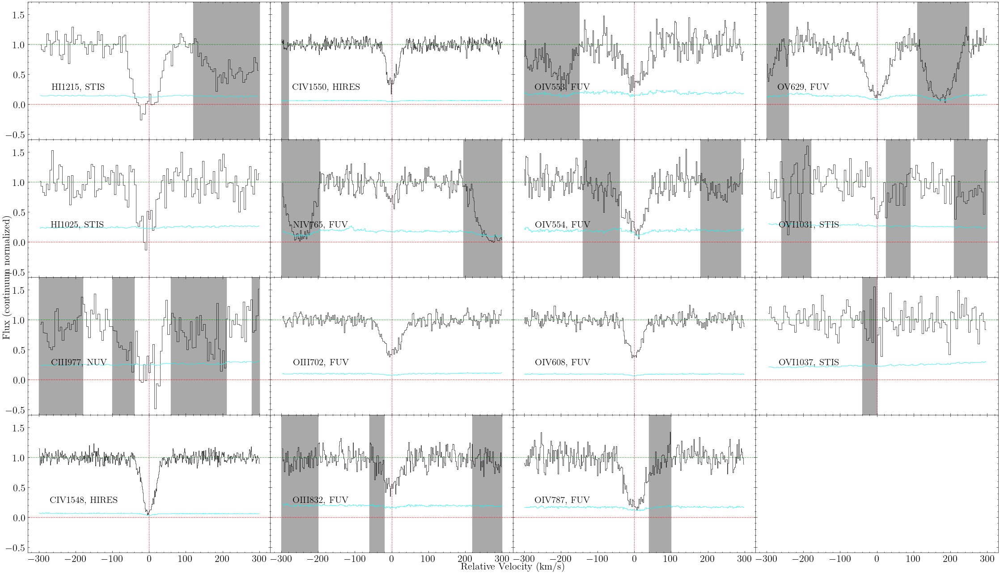

In [489]:
fig, axes = hi_ciii_civ_niv_oiii_oiv_ov_ovi.plot_ion_suite(n_cols=4)

In [490]:
hi_ciii_civ_niv_oiii_oiv_ov_ovi.init_ion_suite([
                                [[14.5,20,0],[14.0,22,-20]], # HI
                                [[14.5,20,0],[14.0,22,-20]],
                                [[14.4,17.7,0]], # CIII
                                [[13.90,17.7,0],[13.1,23,0]], # CIV
                                [[13.90,17.7,0],[13.1,23,0]], # CIV
                                [[13.1,13,0]], # NIV
                                [[14.02,17.7,0],[13.9,23,0]], # OIII
                                [[14.02,17.7,0],[13.9,23,0]],
                                [[14.67,23,0]],  # OIV
                                [[14.67,23,0]],
                                [[14.67,23,0]],
                                [[14.67,23,0]],
                                [[14.20,23,0]],  # OV
                                [[13.8,13,0]],  # OVI
                                [[13.8,13,0]],
                                   ])

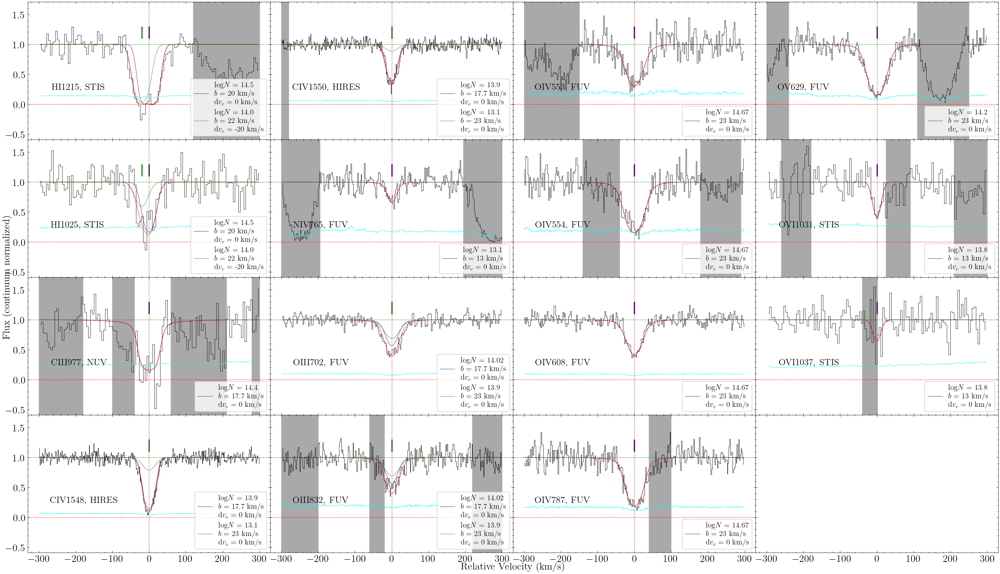

In [491]:
fig, axes = hi_ciii_civ_niv_oiii_oiv_ov_ovi.plot_ion_suite_init_fit(n_cols=4)

In [492]:
hi_ciii_civ_niv_oiii_oiv_ov_ovi.fit_ion_suite(tie_params_list=[
    ['it1c1_logN', 'it2c1_logN'], # Tie logN for HI c1
    ['it1c2_logN', 'it2c2_logN'], # Tie logN for HI c2
    ['it4c1_logN', 'it5c1_logN'], # Tie logN for CIV c1
    ['it4c2_logN', 'it5c2_logN'], # Tie logN for CIV c2
    ['it7c1_logN', 'it8c1_logN'], # Tie logN for OIII c1
    ['it7c2_logN', 'it8c2_logN'], # Tie logN for OIII c1
    ['it9c1_logN', 'it10c1_logN'], # Tie logN for OIV c1
    ['it9c1_logN', 'it11c1_logN'], # Tie logN for OIV c1
    ['it9c1_logN', 'it12c1_logN'], # Tie logN for OIV c1
    ['it14c1_logN', 'it15c1_logN'], # Tie logN for OVI c1
    ['it1c1_b', 'it2c1_b'], # Tie b for HI c1
    ['it1c2_b', 'it2c2_b'], # Tie b for HI c2
    ['it3c1_b', 'it4c1_b'], # Tie b for CIII, CIV, OIII c1
    ['it3c1_b', 'it5c1_b'],
    ['it3c1_b', 'it7c1_b'],
    ['it3c1_b', 'it8c1_b'],    
    ['it4c2_b', 'it5c2_b'], # Tie b for CIV c2, OIII c2, OIV c1 
    ['it4c2_b', 'it7c2_b'],
    ['it4c2_b', 'it8c2_b'],
    ['it4c2_b', 'it9c1_b'],
    ['it4c2_b', 'it10c1_b'],
    ['it4c2_b', 'it11c1_b'],
    ['it4c2_b', 'it12c1_b'],
    ['it14c1_b', 'it15c1_b'], # Tie b for OVI c1
    ['it1c1_dv_c', 'it2c1_dv_c'], # Tie all dv_c together, c1 (HI, CIV, OIII, OIV, OV, OVI)
    ['it1c1_dv_c', 'it3c1_dv_c'],
    ['it1c1_dv_c', 'it4c1_dv_c'],
    ['it1c1_dv_c', 'it4c2_dv_c'], # CIV, c2
    ['it1c1_dv_c', 'it5c1_dv_c'],
    ['it1c1_dv_c', 'it5c2_dv_c'], # CIV, c2
    ['it1c1_dv_c', 'it6c1_dv_c'],
    ['it1c1_dv_c', 'it7c1_dv_c'],
    ['it1c1_dv_c', 'it7c2_dv_c'], # OIII, c2
    ['it1c1_dv_c', 'it8c1_dv_c'], 
    ['it1c1_dv_c', 'it8c2_dv_c'], # OIII, c2
    ['it1c1_dv_c', 'it9c1_dv_c'],
    ['it1c1_dv_c', 'it10c1_dv_c'],
    ['it1c1_dv_c', 'it11c1_dv_c'],
    ['it1c1_dv_c', 'it12c1_dv_c'],
    ['it1c1_dv_c', 'it13c1_dv_c'],
    ['it1c1_dv_c', 'it14c1_dv_c'],
    ['it1c1_dv_c', 'it15c1_dv_c'],
    ['it1c2_dv_c', 'it2c2_dv_c']],
    lower_bounds_dict = {'it1c1_b': 15, # Avoid narrow HI
                         'it6c1_b':5, # Avoid narrow NIV
                         'it14c1_b':5}, # Avoid narrow OVI
    upper_bounds_dict = {'it3c1_b': 35, # Avoid too broad CIII
                        'it6c1_b': 40, # Avoid too broad NIV
                         'it14c1_b': 45}, # Avoid too broad OVI
    exclude_models=['it1c1_logN < it1c2_logN', # Keep blue HI component weaker
                    'it3c1_logN > it1c1_logN', # Keep CIII weaker than associated HI
                    'it7c1_logN < it7c2_logN']
                                              )

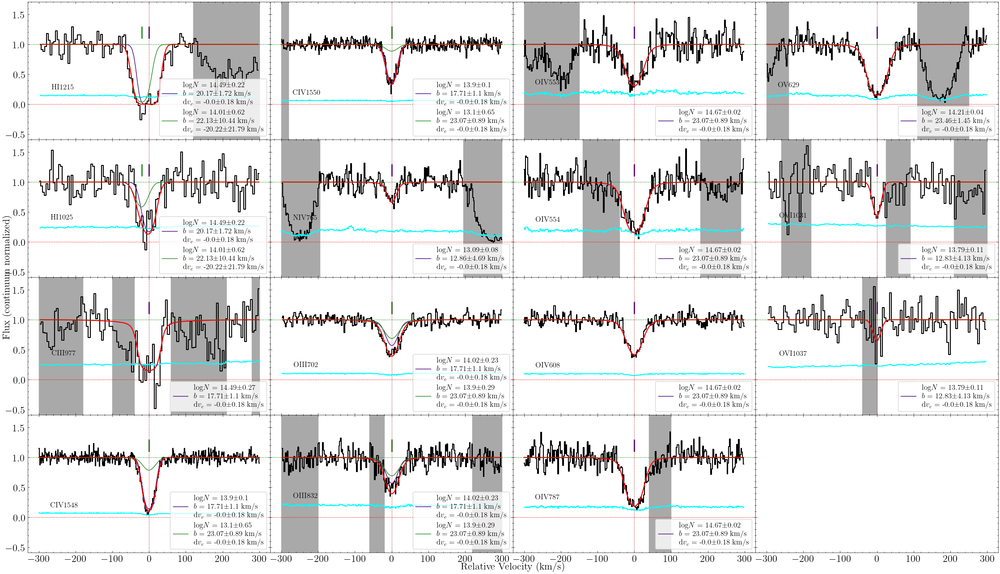

In [493]:
fig, axes = hi_ciii_civ_niv_oiii_oiv_ov_ovi.plot_ion_suite_best_fit(n_cols=4)

In [494]:
len(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result.var_names)

20

In [495]:
#hi_ciii_civ_niv_oiii_oiv_ov_ovi.fit_ion_suite_emcee(loaddir=rootdir, n_walkers=200, n_steps=5000, scale_covar=1e-21)
hi_ciii_civ_niv_oiii_oiv_ov_ovi.fit_ion_suite_emcee(loaddir=rootdir, load=True)

In [496]:
df_slice = hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain[['it1c1_logN', 'it3c1_logN']]

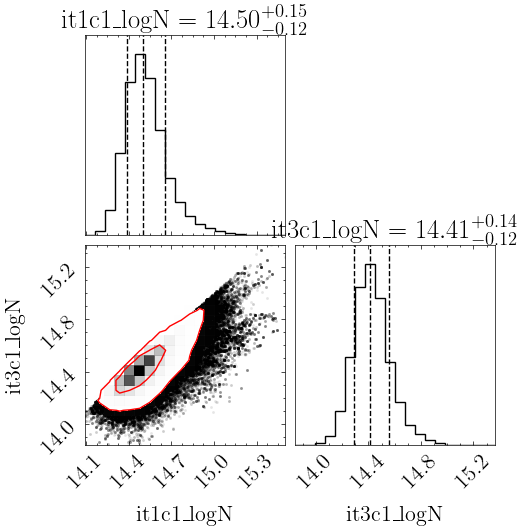

In [497]:
corner_plot = corner.corner(df_slice, 
              labels=list(df_slice.columns),
              quantiles=(1-cdf_1sig, 0.5, cdf_1sig),
              show_titles=True, plot_density=True, 
              levels=[2*cdf_1sig-1, 2*cdf_2sig-1], 
              contour_kwargs={'colors':'red'})

In [498]:
#hi_ciii_civ_niv_oiii_oiv_ov_ovi.plot_corner()

In [499]:
np.percentile(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it3c1_logN'], 100*(1-cdf_3sig))

14.021876652612171

In [500]:
#np.median(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it4c2_logN'])-np.percentile(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it4c2_logN'], 100*(1-cdf_1sig))

In [501]:
logN_CIV_c2H = hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it4c1_logN']
logN_CIV_c2L = hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it4c2_logN']
logN_CIV = np.log10(10**logN_CIV_c2H + 10**logN_CIV_c2L)


logN_OIII_c2H = hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it7c1_logN']
logN_OIII_c2L = hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it7c2_logN']
logN_OIII = np.log10(10**logN_OIII_c2H + 10**logN_OIII_c2L)

KeyError: 'it4c2_logN'

In [ ]:
plt.hist(logN_CIV)

In [ ]:
np.median(logN_CIV), np.median(logN_CIV)-np.percentile(logN_CIV,100*(1-cdf_1sig)), np.percentile(logN_CIV,100*cdf_1sig)-np.median(logN_CIV) 

In [ ]:
np.median(logN_OIII), np.median(logN_OIII)-np.percentile(logN_OIII,100*(1-cdf_1sig)), np.percentile(logN_OIII,100*cdf_1sig)-np.median(logN_OIII) 

In [ ]:
fig, axes = hi_ciii_civ_niv_oiii_oiv_ov_ovi.plot_samples(n_cols=3)